# COMP9444 Project - ESC

Contents:
1. [Introduction](#Introduction)
2. [Data source and analysis](#Data-Source-&-Analysis)
3. [Dataset](#ESC-50/ESC-10-Dataset)
4. [Models](#Models)
5. [Results](#Results)
6. [Discussion](#Discussion)
7. [Conclusion](#Conclusion)

| Name                  |
| --------------------- |
| Hongtian Yu           |
| Zhenhao (Harley) Ding |
| Zachary Scott         |
| Weiyuan (Felix) Li    |
| Aalam Virk            |

## Introduction

The field of intelligent sound classification has gained increasing attention in recent years, especially in areas such as wildlife and urban monitoring. Currently, urban monitoring, involving sounds such as glass breaking, talking, footsteps [1], wildlife monitoring and healthcare monitoring requires a level of speed and accuracy which poses some interesting technical and cost difficulty for modern mass adoption. There has been an observable trend of pushing the boundaries of large-scale models capable of achieving very high accuracy on datasets with a large amount of audio classes at the expense of performance and size. Unfortunately, this makes most of these implementations unsuitable for many devices that have limited access to computational resources and are not able to upload sounds (e.g. to the cloud) through the internet for off-site inference. 

### Motivation

Whilst a large amount of research has already been put into high accuracy models, in many cases the cost of both training and inference are very high. In physical applications such as in security systems, robotics or healthcare, it was found that such models are not optimal in terms of cost despite being able to achieve an extremely high accuracy. In particular, the difference between requirements of such applications and the objectives of aforementioned models mostly lies in the key fact that such sound classifiers often do not need to classify a wide, diverse range of sounds with a large number of categories; rather, they only need to be able to distinguish a small number of kinds of sounds. This, in turn, highlights the issue that many aforementioned models should, for these purposes, be considered needlessly bloated and the high cost associated with their capacity to classify a wide range of sound types is simply an unwelcomed overhead for such devices. Furthermore, these models also poses very high training costs, often demanding a large amount of time and power due to not only the networks' sheer sizes but also the incorporation of techniques such as pretraining on one or multiple public datasets that are huge in size and/or heavy data augmentation. Manufacturers who can minimise the training and inference costs of models employed by its low-end devices will be able to bring to the market products with highly competitive prices.

Hence, this presents a difficult challenge wherein our interest lies, providing strong motivations for us to the objective of this project: 

> *To use signal processing and deep learning techniques to explore and develop a robust and efficient model with minimal training cost, one that is specifically optimised for audio classification over a small number of classes and capable of running on limited computational space and power, which is commonly found in low-end, budget-friendly devices.*


### Potential Applications

1. **Caretaking**: Smart devices with microphones that can assist elderly individuals at home, detecting falls or cries for help so it can alert caretakers or medical professionals in a timely manner.

2. **Security systems**: Classifying accurately a small, fixed set of sound classes possibly indicating criminal activity on the premises whilst ignoring regular urban noises and natural events such as thunder or rain.

3. **Wildlife monitoring**: Detecting movement or animal sounds to activate track cameras or estimating populations in a range of different environments, targeting specific species.


### Project Overview

In this project, the work we have done to tackle this challenge can be loosely split into the following stages:

1. **Data sourcing and analysis**: A suitable appropriately sized dataset needs to be selected with enough variety of distinct sounds, while not being too computationally intensive to train a model on. Then analyse the data chosen and select appropriate evaluation techniques to effectively compare the performance of our model in relation to other pre-existing models.

2. **Research related papers**: Read and compile a list of promising related works done in the field or on the chosen dataset, this step gives us a solid understanding on what techniques and areas have the largest effective impact over a model's accuracy, as well as potential issues and shortcomings we may run into when developing and training a model in this field.

3. **Baseline Replication**: Replicate baseline models and compare and select the best overall model based on criteria of implemented accuracy, complexity, size and amount of pre-processing techniques. Ideally, we select a simple model that does not rely data augmentation and preprocessing to have the flexibility to implement and integrate techniques found in the above step.

4. **Model Improvement**: After selecting a model, we evaluate, refine and combine the researched techniques and well as our unique novel approaches along with standard deep learning optimisation practices to aim to achieve an accuracy as high as possible while maintaining a reasonable size and speed.

5. **Validation**: We assess our accuracy and size of our model on the chosen dataset against pre-existing papers and benchmarks to evaluate its overall effectiveness in achieving our particular goal in tackling the aforementioned specialised environmental sound classification challenge.

---
## Data Source & Analysis

An issue with training deep neural networks is the amount of labelled data required for efficient learning as there do not exist many publicly available audio classification datasets, due to time- and cost-intensive tasks of labelling and refining the data. The ESC dataset (https://github.com/karolpiczak/ESC-50) proposed by Karol J. Piczak (http://dx.doi.org/10.1145/2733373.2806390) is comprised of a collection of 2000 labelled environment recordings of exactly 5 seconds from the Freesound project (https://dl.acm.org/doi/10.1145/2502081.2502245). These recordings cover 5 major categories:
- animal sounds
- natural soundscapes and water sounds
- human (non-speech) sounds
- interior/domestic sounds
- exterior/urban noises

Each of these noises are packed into a uniform format `*.wav` files, containing exactly 5 seconds of mono-channel audio with a sampling rate of 44.1kHz and are manually labelled. To ensure consistancy across reported accuracies, the author has manually partitioned the data into 5 folds allowing for 5 fold accuracy validation which makes benchmarking models against each other very consistant. 

The dataset is quite diverse comprising of a range from quite common sounds like rain and dog barking to uncommon and more nuanced samples like church bells and crying. As this project is targeting light-weight, efficient and few-class classification models, we can instead use a variant of this dataset, ESC-10, comprising of fewer but still diverse soundscapes. The ESC-10 dataset is a manual selection by K. Piczak from the ESC-50 dataset, and contains audios from 10 classes, which can be then loosely organised into 3 new categories (the 400 audio samples are still sorted into 5 folds):

| transient/percussion sounds | strong harmonic content | structured noise/soundscapes |
|---------|---------|---------|
|   sneezing  |   crying baby |   rain |
|   dog barking   |  crowing rooster  |   sea waves|
|   clock ticking  |    |   fire crackling |
|     |    |   helicopter |
|     |    |   chainsaw |

Furthermore, having found this dataset on Hugging Face (https://huggingface.co/datasets/ashraq/esc50), we are provided with the rich, streamlined Hugging Face Dataset APIs optimised for dataset manipulations. Additionally, the original ESC dataset includes but the raw audio files and a simple csv file storing their metadata; this particular dataset has pre-combined this information with the content waveform of the audio file into a simple table, where each row represents a single audio sample, and has the following columns:
- `fold_number`
- `target`
- `category`
- `esc10` (a boolean flag, indicating if it's in the esc10 dataset)
- `src_file`
- `take`

Using this highly accessible format, we can then easily obtain the train and test data for the model and apply various different pre-processing and augmentation techniques efficiently to test our models.

## Basic Setup

We have developed a framework from scratch that allows different models and datasets to be used without having to change the rest of the code.
This allows different approaches to be tested whilst still ensuring a high level of consistency.
The basic setup is described below, and other parts (such as the dataset interface) are discussed in their respective dedicated sections.

### Library Imports

We have used a wide range of libraries to build our framework as well as our numerous models, dataset handlers, and data pre-processors.

In [2]:
import copy
import multiprocessing
import os
import sys
import time
from abc import ABC, abstractmethod
from contextlib import contextmanager
from pprint import pprint
from typing import Literal, Sized, TypeAlias, Callable, cast

import datasets
import datasets.config
import librosa
import matplotlib.pyplot as plt
import numpy as np
import torch
import torch.nn as nn
import torch.utils
import torchinfo
from gammatone.filters import centre_freqs, erb_filterbank, make_erb_filters
from sklearn import metrics
from torch.utils.data import DataLoader, Dataset, IterableDataset, get_worker_info

### Configuration Interface

In our framework, we have a dedicated data class for storing global configurations,
as the framework is much easier to work with when we have all the 
shared hyper-parameters, flags and controls together in one place.
Additionally, most of these remain unchanged across different experiments in order to ensure consistency.

In [3]:
class Config:
    def __init__(self):
        self.device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
        self.cpu_count = multiprocessing.cpu_count()

        self.epochs = 300

        self.lr = 0.002
        self.weight_decay = 0.001  # L2 regularisation
        self.momentum = 0.9
        self.nesterov_momentum = True  # ^ These are from the Piczak CNN paper

        self.batch_size = 200  # 24  # 64

        # self.criterion = nn.CrossEntropyLoss()
        # self.criterion_name = "Cross Entropy Loss"
        self.criterion = nn.NLLLoss()
        self.criterion_name = "Negative Log Loss"

        self.fold_count = 5
        self.test_fold_index = 3  # for 1-fold testing only

        self.input_shape: tuple[int, ...] = (-1, -1, -1)

        self.cache_dir = os.path.join(".cache")
        self.output_dir = os.path.join("output")

        self.display_graphics = True
        self.report_interval = 4

        self.model_path = None  # Continue from pretrained model if needed

    def print(self) -> None:
        """Prints the config."""

        print("=" * 32)
        print("Config: ")
        for prop, value in vars(self).items():
            print(f"    {prop}: ", end="")
            pprint(value)
        print("=" * 32)
        print()

We then create a global instance of this class named `config`, which can be accesssed from anywhere in the entire codebase.

In [4]:
config = Config()


@contextmanager
def temporary_config():
    global config
    orig = copy.copy(config)
    try:
        yield config
    finally:
        config = orig

For ease of use, we also provide a simple context manager that allows temporary modification of the global config within a `with` block and restores it after execution leaves the block.

## Dataset Interface

We have a uniform interface for all our (pre-processed) datasets, abstracting away the implementation details of the datasets and only exposing a small, carefully designed set of operations supported by all datasets. This allows most other part of the framework to be completely decoupled from what dataset we are actually using, which helps immensely when conducting experiments involving different datasets and pre-processing techniques.

In [5]:
class CustomDataset(ABC):
    @abstractmethod
    def get_train_and_test_datasets(
        self, fold_count: int, test_fold_index: int
    ) -> tuple[Dataset[dict], Dataset[dict]]:
        pass

    @abstractmethod
    def get_class_count(self) -> int:
        pass

Above is the abstract base class for all dataset classes. It only supports two basic operations:
1. Retrieving the train and test datasets as `pytorch` datasets, given the number of folds to split the data into and the index of the fold used for model evaluation.
2. Get the number of classes this dataset have.

### Debug Dataset

We have a super basic dataset `DebugDataset` built solely for debugging purposes. The dataset only contains `class_count` samples, each being a 2D square tensor with dimension $\text{size} \times \text{size}$. It can replace a normal audio dataset during troubleshooting. 

For the $n$<sup>th</sup> sample with data $S$ and target $t$, $t$ is simply equal to $n$, and $S$ is defined by:
$$
    S_{i, j} = \begin{cases}
        1 \quad \text{ if } i = n \text{ and } j = n \text{,} \\
        0 \quad \text{ otherwise.}
    \end{cases}
$$

This dataset is easily classifiable, even for a basic two-layer MLP network. Hence, it can be used to test whether a networks is set up properly and capable of learning.

In [6]:
class DebugDataset(CustomDataset):
    class CustomDataset(Dataset[dict]):
        def __init__(self, data: list[dict], repeat: int) -> None:
            super().__init__()
            self.data = data
            self.repeat = repeat
            assert repeat > 0

        def __len__(self) -> int:
            return len(self.data) * self.repeat

        def __getitem__(self, index) -> dict:
            return self.data[index % len(self.data)]

    def __init__(self, class_count: int, size: int = 224) -> None:
        self.class_count = class_count
        self.data: list[dict] = [
            {
                "audio": torch.tensor(
                    np.pad(
                        np.array([[1]]),
                        ((i, size - 1 - i), (i, size - 1 - i)),
                        mode="constant",
                        constant_values=0,
                    ),
                    dtype=torch.float,
                ).unsqueeze(0),
                "target": torch.tensor(i),
            }
            for i in range(class_count)
        ]

        test_sample: torch.Tensor = self.data[min(1, class_count - 1)]["audio"]
        print("Debug Dataset: shape =", test_sample.size())
        print("e.g.:", test_sample)
        assert test_sample.size() == (1, size, size)

    def get_class_count(self) -> int:
        return self.class_count

    def get_train_and_test_datasets(
        self, fold_count: int, test_fold_index: int
    ) -> tuple[Dataset[dict], Dataset[dict]]:
        """
        The train and test folds are identical for this dataset,
        so a fully-functional network should achieve 100% accuracy.
        """
        dataset = self.CustomDataset(self.data, 16)
        return dataset, dataset

### ESC-50/ESC-10 Dataset

All dataset classes that preprocessesing raw audio waveforms from the ESC-50 dataset have a common abstract base class named `EscDataset`. It provides some basic functionalities:
- **Raw Dataset Loading**
    - Loads the pre-packaged ESC-50 dataset `ashraq/esc50` with Hugging Face APIs
    - Discards any unused columns to save storage space
- **ESC-10 Mode**
    - Extracts ESC-10 samples from the ESC-50 dataset prior to preparation if the `esc10` flag is set to `True`.
- **Caching Mechanism**
    - Prepared datsets are saved in the [Arrow](https://arrow.apache.org/) format on the disk so we don't have to load and prepare the dataset every time.
- **Folds for Cross-Validation**
    - Automatically splits the dataset into the predefined 5 folds in the manner required by the author of the dataset.

In [7]:
class EscDataset(CustomDataset):
    """ESC-50/ESC-10 Dataset"""

    Format: TypeAlias = Literal["full", "seg-long", "seg-short"]

    esc10_label_map = {
        0: (0, "dog"),
        10: (1, "rain"),
        11: (2, "waves"),
        20: (3, "cry"),
        38: (4, "clock"),
        21: (5, "sneeze"),
        40: (6, "helicopter"),
        41: (7, "chainsaw"),
        1: (8, "rooster"),
        12: (9, "fire"),
    }

    esc10_cache_path = os.path.join(config.cache_dir, "esc10", "{}", "{}", "fold-{}")
    esc50_cache_path = os.path.join(config.cache_dir, "esc50", "{}", "{}", "fold-{}")
    hugging_face_cache_path = os.path.join(config.cache_dir, "datasets")

    def __init__(self, *, esc10: bool) -> None:
        self.esc10 = esc10
        if self.are_test_and_train_format_different():
            self.test_folds = self.load_dataset(
                esc10, fold_count=5, is_test_dataset=True
            )
            self.train_folds = self.load_dataset(
                esc10, fold_count=5, is_test_dataset=False
            )
        else:
            self.train_folds = self.test_folds = self.load_dataset(esc10, fold_count=5)

    def load_dataset(
        self, esc10: bool, fold_count: int, is_test_dataset: bool | None = None
    ) -> list[datasets.Dataset]:
        """Loads the original Hugging Face dataset and prepares it"""

        esc_cache_path = self.esc10_cache_path if esc10 else self.esc50_cache_path
        prepared_dataset: datasets.Dataset | None = None

        dataset_folds: list[datasets.Dataset] = []

        for fold_index in range(fold_count):
            is_current_fold = lambda row: row["fold"] - 1 == fold_index

            save_folder_name = self.get_format() + ("-test" if is_test_dataset else "")
            fold_save_path = esc_cache_path.format(
                self.get_name(), save_folder_name, fold_index
            )
            if os.path.exists(fold_save_path):
                existing = datasets.Dataset.load_from_disk(fold_save_path)
                print(
                    f"ESC Dataset: Found cache for fold-{fold_index} at '{fold_save_path}': "
                    + f"sample count = {len(existing)}"
                )
                dataset_folds.append(existing)
                continue

            if prepared_dataset is None:
                raw_dataset = self.fetch_raw_dataset()
                if esc10:
                    # Remove non-ESC-10 entries first
                    raw_dataset = raw_dataset.filter(
                        lambda flag: flag,
                        batch_size=64,
                        num_proc=config.cpu_count,
                        input_columns="esc10",
                    )
                # Lazily prepare dataset
                prepared_dataset = self.prepare_dataset(raw_dataset, is_test_dataset)

            fold_dataset = prepared_dataset.filter(
                # Here be 24 hours of pain because of a superfluous `not`
                lambda row: is_current_fold(row),
                batch_size=64,
                num_proc=config.cpu_count,
            )

            fold_dataset.save_to_disk(fold_save_path)
            print(f"ESC Dataset: Saved fold-{fold_index} to '{fold_save_path}'.")

            dataset_folds.append(fold_dataset)

        assert len(dataset_folds) == fold_count

        return dataset_folds

    @classmethod
    def fetch_raw_dataset(cls) -> datasets.Dataset:
        """Fetches dataset from https://huggingface.co/datasets/ashraq/esc50"""
        return cast(
            datasets.Dataset,
            datasets.load_dataset(
                "ashraq/esc50", split="train", cache_dir=cls.hugging_face_cache_path
            ),
        )

    @abstractmethod
    def get_format(self) -> Format:
        pass

    @abstractmethod
    def get_name(self) -> str:
        pass

    @abstractmethod
    def prepare_dataset(
        self, dataset: datasets.Dataset, is_test_dataset: bool | None
    ) -> datasets.Dataset:
        pass

    @abstractmethod
    def are_test_and_train_format_different(self) -> bool:
        return False

    def clean_and_resample(
        self, dataset: datasets.Dataset, sample_rate: int
    ) -> datasets.Dataset:
        dataset = dataset.remove_columns(
            ["category", "src_file", "take"]
        )

        # Resample audio
        dataset = dataset.cast_column(
            "audio", datasets.Audio(sampling_rate=sample_rate)
        )

        print(
            f"Preprocess: audio resampled to {dataset[0]['audio']['sampling_rate']}Hz "
            + f"({len(dataset[0]['audio']['array'])} frames)"
        )

        return dataset

    def get_train_and_test_datasets(
        self, fold_count: int, test_fold_index: int
    ) -> tuple[Dataset[dict], Dataset[dict]]:
        assert fold_count == 5  # Mandatory requirement...

        train_dataset = datasets.concatenate_datasets(
            [d for i, d in enumerate(self.train_folds) if i != test_fold_index]
        )

        test_dataset = self.test_folds[test_fold_index]

        # Below code is used to inspect the generated folds for troubleshooting.
        #
        # self.dump_splits_to_file(
        #     os.path.join(config.output_dir, "split_dump.txt"),
        #     train_dataset,
        #     test_dataset,
        # )
        # exit()

        return self.convert_train_and_test_datasets(train_dataset, test_dataset)

    def convert_train_and_test_datasets(
        self, train_dataset: datasets.Dataset, test_dataset: datasets.Dataset
    ) -> tuple[Dataset[dict], Dataset[dict]]:
        """Convert to PyTorch datasets"""
        return (
            cast(
                Dataset[dict],
                train_dataset.with_format("torch"),
            ),
            cast(
                Dataset[dict],
                test_dataset.with_format("torch"),
            ),
        )

    def get_class_count(self) -> int:
        return 10 if self.esc10 else 50

    def get_sample_rate(self) -> int:
        return self.train_folds[0][0]["audio"]["sampling_rate"]

    def convert_target(self, target: int) -> int:
        return self.esc10_label_map.get(target, (-1, None))[0] if self.esc10 else target

    @staticmethod
    def dump_splits_to_file(
        filename: str, train: datasets.Dataset, test: datasets.Dataset
    ):
        """Dumps information about all train and test splits for debugging purposes"""

        def dump_line(row: dict) -> str:
            return (
                str(row["filename"])
                + " -> "
                + str(row["target"])
                + ": "
                + str(np.shape(row["audio"]))
                + "\n"
            )

        with open(filename, "w") as file:
            file.write("Train:\n\n")
            file.writelines((dump_line(cast(dict, row)) for row in train))

            file.write("\n\nTest:\n\n")
            file.writelines((dump_line(cast(dict, row)) for row in test))
            file.write("\n")

        print(f"Dumped splits to '{filename}'")

## Data Pre-Processing

Whilst it is possible to feed raw waveforms into a 1D convolutional network, the vast majority of the models we have used requires audio to be pre-processed into a 2D tensor (such as a spectrogram) in order to leverage computer vision techniques. For the purposed of our project, the various pre-processed datasets can be loosely organised into two major classes:

1. Mel Spectrogram Representations,
2. Gammatone Representations.

In the framework we have designed, instead of having independent pre-processing pipelines, the data pre-processing step is integrated into dedicated sub-classes of `EscDataset`. This means that for we have a dataset class for each of the pre-processing method we have, inheriting from the aforementioned base class which supplies the raw audio and other necessary functionalities. This design promotes simplicity, which leads to easy management, and allows the pre-processed datasets to be cached as well, which significantly improves efficiency when we are testing or conducting experiments.

Hence, the term "dataset" below generally refers to our dataset classes, which are bundled with pre-processing, and the phrase "different datasets" usually means the same ESC-50 dataset, but pre-processed with different techniques, which also makes sense as the processed datasets hold completely different content despite all being generated from the same set of raw audio waveforms.

### Segmented Datasets

The author of the dataset, K. Piczak, proposed a technique where overlapping segments is extracted from the spectrogram of the raw 5s audio, and silent segments are discarded. The segments theoretically come in 2 variants:
1. 50% overlapping segments of 41 frames (short variant, approx. 950 ms)
2. 90% overlapping segments of 101 frames (long variant, approx. 2.3 s)

The network is then trained on these individual segments; when evaluating, probability voting will be used to determine the final output for the entire audio sample. In order to achieve this, we chose to use different structures for the test and train datasets:
- Each entry in the test dataset contains an array of segments extracted from the corresponding 5s audio sample;
- Each entry in the train dataset contains a single individual segment.

This means that there is a one-to-many relationship between the audio samples and train dataset entries,
whereas the former has a one-to-one relationship with the test datasets. 
This will make more sense when we introduce our training and testing methods.

This technique is not only used for the Piczak dataset we have replicated, but also a range of other pre-processed datasets we have. Hence, for readability and maintainability, we have extracted a common abstract base class for all datasets that extracts multiple segments from each audio sample, along with some useful utilities and template methods.

Furthermore, we also provide an abstract template method for data augmentation, which child dataset classes can optionally choose to support.

In [8]:
class EscSegmentDataset(EscDataset):
    sample_rate = 22_050

    # ESC-10:
    esc10_limits = {
        1: ((-4, 4), (0.95, 1.1)),
        3: ((0, 0), (0.9, 1.2)),
        4: ((-3, 6), (0.8, 1.3)),
        6: ((-4, 4), (0.9, 1.2)),
        7: ((0, 0), (0.9, 1.2)),
        8: ((-4, 2), (0.9, 1.2)),
        9: ((-3, 2), (0.95, 1.1)),
    }

    def __init__(self, *, esc10: bool, long: bool, augment_count: int, use_test_format: bool) -> None:
        self.long = long
        self.augment_count = augment_count
        self.frames_per_segment = 101 if self.long else 41
        self.use_test_format = use_test_format
        self.test_dataset: datasets.Dataset | None = None  # the cached test dataset
        super().__init__(esc10=esc10)

    def get_format(self) -> EscDataset.Format:
        return "seg-long" if self.long else "seg-short"

    def load_dataset(
        self, esc10: bool, fold_count: int, is_test_dataset: bool | None = None
    ) -> list[datasets.Dataset]:
        if self.use_test_format:
            is_test_dataset = True
        return super().load_dataset(esc10, fold_count, is_test_dataset)

    def prepare_dataset(
        self, dataset: datasets.Dataset, is_test_dataset: bool | None
    ) -> datasets.Dataset:
        if self.augment_count > 0:
            return self.prepare_dataset_with_augment(dataset, is_test_dataset)
        return self.prepare_dataset_no_augment(dataset, is_test_dataset)

    def prepare_dataset_with_augment(
        self, dataset: datasets.Dataset, is_test_dataset: bool | None
    ) -> datasets.Dataset:
        assert is_test_dataset is not None

        dataset = self.clean_and_resample(dataset, self.sample_rate)

        print(
            f"Preprocessing: cleaned dataset has {len(dataset)} samples" 
            + f"(test dataset = {is_test_dataset})."
        )

        if is_test_dataset:

            def test_data_transformer(audio: dict, target: int, filename: str) -> dict:
                segments, ranges = self.extract_segments(filename, audio["array"])
                return {
                    "audio": segments,
                    "ranges": ranges,
                    "target": self.convert_target(target),
                }

            return dataset.map(
                test_data_transformer,
                input_columns=["audio", "target", "filename"],
                num_proc=config.cpu_count,
            )
        else:

            def train_data_transformer(rows: dict[str, list]) -> dict[str, list]:
                """Convert target number and pre-process each dataset entry"""
                assert len(rows["audio"]) == 1

                audio = rows["audio"][0]["array"]
                target = self.convert_target(rows["target"][0])
                segments = self.extract_segments(rows["filename"][0], audio)[0]

                for _ in range(self.augment_count):
                    augmented = self.augment(audio, target)
                    segments.extend(
                        self.extract_segments(rows["filename"][0], augmented)[0]
                    )

                out_count = len(segments)
                remaining = {
                    key: [value[0]] * out_count
                    for key, value in rows.items()
                    if key not in {"audio", "target"}
                }

                return {
                    "audio": segments,
                    "target": [target] * out_count,
                    **remaining,
                }

            return dataset.map(
                train_data_transformer,
                batch_size=1,  # Using batched to split dataset only
                batched=True,
                num_proc=config.cpu_count,
            )

    def prepare_dataset_no_augment(
        self, dataset: datasets.Dataset, is_test_dataset: bool | None
    ) -> datasets.Dataset:
        assert is_test_dataset is not None

        if self.test_dataset is None:
            dataset = self.clean_and_resample(dataset, self.sample_rate)
            print(f"Preprocessing: cleaned dataset has {len(dataset)} samples.")

            def test_data_transformer(audio: dict, target: int, filename: str) -> dict:
                segments, ranges = self.extract_segments(filename, audio["array"])
                return {
                    "audio": segments,
                    "ranges": ranges,
                    "target": self.convert_target(target),
                }

            self.test_dataset = dataset.map(
                test_data_transformer,
                input_columns=["audio", "target", "filename"],
                num_proc=config.cpu_count,
            )

        if is_test_dataset:
            dataset = self.test_dataset
        else:

            def train_data_transformer(rows: dict[str, list]) -> dict[str, list]:
                """
                Since we have no augmentation, we simply generate an entry for
                each individual segment in each test dataset entry.
                """

                assert len(rows["audio"]) == 1

                segments = rows["audio"][0]
                out_count = len(segments)
                remaining = {
                    key: [value[0]] * out_count
                    for key, value in rows.items()
                    if key not in {"audio", "ranges"}
                }

                return {
                    "audio": segments,
                    **remaining,
                }

            dataset = self.test_dataset.map(
                train_data_transformer,
                batch_size=1,  # Using batched to split dataset only
                batched=True,
                num_proc=config.cpu_count,
                remove_columns=["ranges"],
            )

        print(f"Preprocessing: prepared dataset now has {len(dataset)} samples.")

        return dataset

    @abstractmethod
    def extract_segments(
        self, name: str, clip: np.ndarray
    ) -> tuple[list[np.ndarray], list[tuple]]:
        pass

    @abstractmethod
    def augment(self, audio: np.ndarray, target: int) -> np.ndarray:
        pass

### Mel Spectrogram Representations

Mel-scaled spectrograms (often referred to as *mel spectrograms* for short) are obtained by applying a frequency domain filterbank to raw audio waveforms. Instead of a linear scale, the frequency is put into the Mel scale, which is a scale experimentally determined to model the human perception of pitch.

Furthermore, the human perception of amplitude is logarithmic instead of linear, so we would often have to convert the magnitude of the spectrogram into the decibel scale though logarithmic compression. Whilst possibly causing certain details to be lost, it better mimics our perception of loudness which has been, to a certain extent, specifically optimised for distinguishing sounds by natural selection.

Here is an example of what a mel spectrogram looks like.

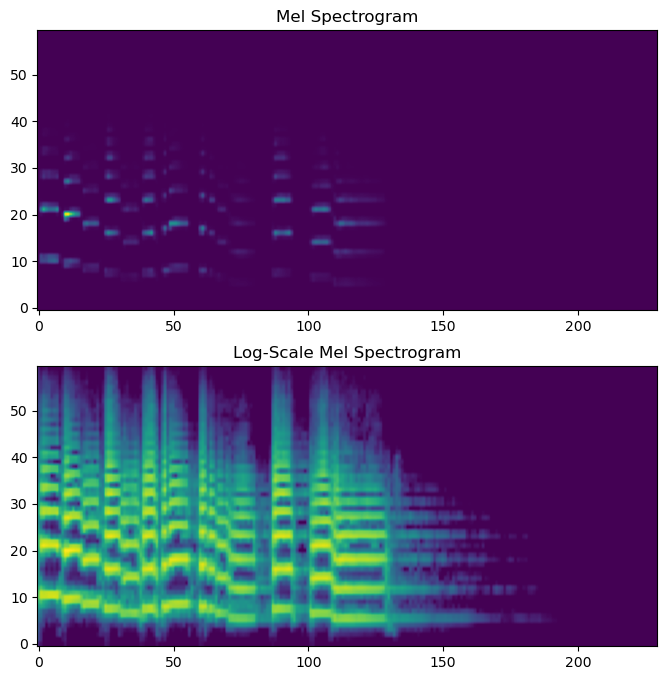

In [9]:
def mel_spectrogra_demo() -> None:
    # Using one of librosa's built-in audio examples
    y, sr = librosa.load(librosa.ex('trumpet'))
    spec = librosa.feature.melspectrogram(y=y, sr=sr, n_fft=1024, hop_length=512, n_mels=60)
    log_spec = librosa.power_to_db(spec, ref=np.max)

    plt.figure(figsize=(8, 8))

    plt.subplot(2, 1, 1)
    plt.title("Mel Spectrogram")
    plt.imshow(spec, aspect="auto", origin="lower")

    plt.subplot(2, 1, 2)
    plt.title("Log-Scale Mel Spectrogram")
    plt.imshow(log_spec, aspect="auto", origin="lower")

    plt.show()

mel_spectrogra_demo()
del mel_spectrogra_demo

Below we present some pre-processing methods based on the extraction of mel spectrograms from raw audio waveforms. The extraction is achieved with the latest *librosa* implementation (version 0.10.2, DOI: [10.5281/zenodo.591533](https://doi.org/10.5281/zenodo.11192913)), using the [`librosa.feature.melspectrogram`](https://librosa.org/doc/0.10.2/generated/librosa.feature.melspectrogram.html#librosa.feature.melspectrogram) function.

#### Unsegmented Mel Spectrogram Dataset

This dataset contains unscaled square mel-spectrogram of 5s audio samples with size $224 \times 224$, intended to be mainly used by the mono-channel VGG-16 network which requires the input data to be in this shape. This is achieved by carefully choosing the sampling rate to downsample the raw audio to as well as the mel-band count and hop length.

In [10]:
class EscFullMelDataset(EscDataset):
    sample_rate = 15_670
    mel_n_fft = 1024
    mel_hop_length = 350
    mel_count = 224

    def __init__(self, *, esc10: bool) -> None:
        assert config.input_shape == (1, 224, 224)
        super().__init__(esc10=esc10)

    def get_name(self) -> str:
        return "mel"

    def get_format(self) -> EscDataset.Format:
        return "full"

    def prepare_dataset(
        self, dataset: datasets.Dataset, is_test_dataset: bool | None = None
    ) -> datasets.Dataset:
        """Pre-processing pipeline"""

        # pipeline_mapper = lambda audio_batch: {
        #     "audio": pipeline(
        #         torch.tensor(
        #             np.array([audio["array"] for audio in audio_batch]),
        #             dtype=torch.float,
        #             device=config.device,
        #         )
        #     )
        # }

        assert is_test_dataset is None

        dataset = self.clean_and_resample(dataset, self.sample_rate)

        # CPU spectrogram is actually faster
        # (may be due to not having to copy tensors between GPU and CPU)
        def data_transformer(audio, target):
            import numpy as np 
            import librosa.feature
            # Need the redundant imports above on Windows 
            # due to some obscure Jupyter behaviours
            return {
                "audio": np.expand_dims(
                    # librosa.power_to_db(
                    (
                        librosa.feature.melspectrogram(
                            y=audio["array"],
                            sr=self.sample_rate,
                            n_fft=self.mel_n_fft,
                            hop_length=self.mel_hop_length,
                            n_mels=self.mel_count,
                        )
                    ),
                    0,  # One channel -> unsqueeze array of size (mel, time) to (1, mel, time)
                ),
                "target": self.convert_target(target),
            }

        # Pass audio waveforms though our processing pipline
        dataset = dataset.map(
            # pipeline_mapper,
            data_transformer,
            batch_size=128,
            # batched=True,
            input_columns=["audio", "target"],
            # remove_columns=["filename", "category", "src_file", "take"],
            num_proc=config.cpu_count,
        )

        return dataset
    
    def are_test_and_train_format_different(self) -> bool:
        return False

Here's an example of what an entry in the dataset looks like:

ESC Dataset: Found cache for fold-0 at '.cache\esc10\mel\full\fold-0': sample count = 80
ESC Dataset: Found cache for fold-1 at '.cache\esc10\mel\full\fold-1': sample count = 80
ESC Dataset: Found cache for fold-2 at '.cache\esc10\mel\full\fold-2': sample count = 80
ESC Dataset: Found cache for fold-3 at '.cache\esc10\mel\full\fold-3': sample count = 80
ESC Dataset: Found cache for fold-4 at '.cache\esc10\mel\full\fold-4': sample count = 80
{'esc10': tensor(True),
 'filename': '4-169127-B-41.wav',
 'fold': tensor(4),
 'target': tensor(7)}


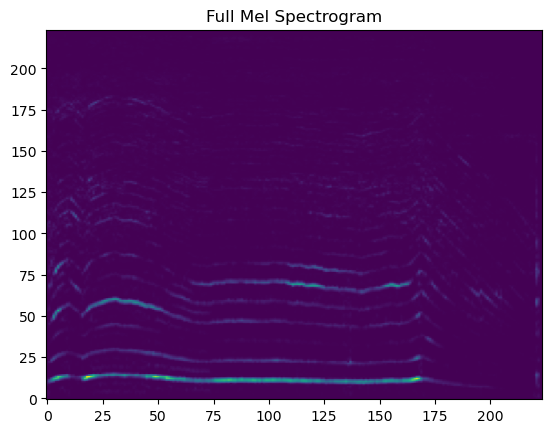

In [11]:
def esc_full_mel_demo() -> None:
    with temporary_config():
        config.input_shape = (1, 224, 224)

        dataset = EscFullMelDataset(esc10=True)
        # Train & test dataset has the same format so either one works for this demo
        _, test_dataset = dataset.get_train_and_test_datasets(5, config.test_fold_index)
        demo_entry = test_dataset[32]

        full_mel_spec = demo_entry.pop("audio")[0]

        pprint(demo_entry)

        plt.imshow(full_mel_spec, aspect="auto", origin="lower")
        plt.title("Full Mel Spectrogram")
        plt.show()


esc_full_mel_demo()
del esc_full_mel_demo

Whilst being less discernible for humans, existing studies show that mel spectrograms that are not log-scaled are still quite easy for computer vision networks to grasp. We decided to not introduce any additional complexity for this dataset (which is our first), and hence have not applied log-scale to the magnitudes. Whilst basic, this representation is nevertheless still widely used, and we thought would be a decent starting point for us.

#### Segmented Log-Scaled Mel Spectrogram

This is the version of our dataset class for ESC-50/ESC-10 that is bundled with the original pre-processing methods proposed by K. Piczak as part of his baseline CNN paper, along with the data augmentation he proposed. We have patched some bugs that were originally present in his implementation and reworked some parts. We also bumped the versions of libraries used to the latest and replaced any deprecated API usages. Some more details regarding (log-)mel spectrograms and segments are outlined in above sections.

In [12]:
class EscLogMelSegmentDataset(EscSegmentDataset):
    def __init__(self, *, esc10: bool, long: bool, augment_count=0, use_test_format=False) -> None:
        super().__init__(esc10=esc10, long=long, augment_count=augment_count, use_test_format=use_test_format)

    def get_name(self) -> str:
        aug_postfix = ("-aug-" + str(self.augment_count)) if self.augment_count else ""
        return "log-mel" + aug_postfix

    def extract_segments(
        self, name: str, clip: np.ndarray
    ) -> tuple[list[np.ndarray], list[tuple]]:
        # Based on https://github.com/karolpiczak/paper-2015-esc-convnet/blob/master/Code/_Datasets/Setup.ipynb

        # "Due to an off-by-one bug which has not been caught earlier,
        # actually both variants (long and short) use the same
        # overlap setting (half of window size) - whereas different settings
        # were mentioned in the paper.
        #
        # The code below has been already cleaned up to reflect those changes.
        #
        # Apart from that, for reproducibility purposes it is required that
        # librosa v0.3.1 is used, as further versions drastically change
        # the delta computations."
        #
        #   -- Note from the original source code.

        # But let's just use the latest `librosa` for our purposes,
        # as no significant changes have been made on the features used below.

        # Additionally, the bug is now patched by us.

        FRAMES_PER_SEGMENT = (
            self.frames_per_segment - 1
        )  # 41 frames ~= 950 ms segment length @ 22050 Hz
        WINDOW_SIZE = 512 * FRAMES_PER_SEGMENT  # 23 ms per frame @ 22050 Hz
        STEP_SIZE = 512 * int(FRAMES_PER_SEGMENT * (0.1 if self.long else 0.5))
        BANDS = 60

        s = 0
        segments = []
        ranges = []

        normalization_factor = 1 / np.max(np.abs(clip))
        clip = clip * normalization_factor

        while (
            len(signal := clip[s * STEP_SIZE : s * STEP_SIZE + WINDOW_SIZE])
            == WINDOW_SIZE
        ):
            melspec = librosa.feature.melspectrogram(
                y=signal, sr=self.sample_rate, n_fft=1024, hop_length=512, n_mels=BANDS
            )

            logspec = librosa.power_to_db(melspec, ref=1.0, amin=1e-10, top_db=80.0)

            delta = librosa.feature.delta(logspec)

            if np.mean(logspec) > -70.0:  # drop silent frames
                segments.append([logspec, delta])
                ranges.append((s * STEP_SIZE, s * STEP_SIZE + WINDOW_SIZE))

            s += 1

        if len(segments) <= 0:
            # For debugging; this should never happen
            print("\n\n" + name + "\n\n")
        assert len(segments) > 0

        return segments, ranges

    def augment(self, audio: np.ndarray, target: int) -> np.ndarray:
        limits = ((0, 0), (1.0, 1.0))  # pitch shift in half-steps, time stretch

        if self.esc10:
            limits = self.esc10_limits.get(target, limits)

        pitch_shift = np.random.randint(limits[0][1], limits[0][1] + 1)
        time_stretch = np.random.random() * (limits[1][1] - limits[1][0]) + limits[1][0]
        time_shift = np.random.randint(self.sample_rate)

        shifted = librosa.effects.pitch_shift(
            audio, sr=self.sample_rate, n_steps=pitch_shift
        )
        stretched = librosa.effects.time_stretch(shifted, rate=time_stretch)

        return np.hstack(
            (np.zeros((time_shift)), stretched)
        )  # pad a random amount of zeroes in front

    def are_test_and_train_format_different(self) -> bool:
        return not self.use_test_format

Since the CNN proposed by Piczak uses probabilistic voting when evaluating but trains on individual segments, we will demonstrate an entry from the test dataset as it contains all short segments extracted from a single audio sample.

ESC Dataset: Found cache for fold-0 at '.cache\esc10\log-mel\seg-short-test\fold-0': sample count = 80
ESC Dataset: Found cache for fold-1 at '.cache\esc10\log-mel\seg-short-test\fold-1': sample count = 80
ESC Dataset: Found cache for fold-2 at '.cache\esc10\log-mel\seg-short-test\fold-2': sample count = 80
ESC Dataset: Found cache for fold-3 at '.cache\esc10\log-mel\seg-short-test\fold-3': sample count = 80
ESC Dataset: Found cache for fold-4 at '.cache\esc10\log-mel\seg-short-test\fold-4': sample count = 80
ESC Dataset: Found cache for fold-0 at '.cache\esc10\log-mel\seg-short\fold-0': sample count = 628
ESC Dataset: Found cache for fold-1 at '.cache\esc10\log-mel\seg-short\fold-1': sample count = 649
ESC Dataset: Found cache for fold-2 at '.cache\esc10\log-mel\seg-short\fold-2': sample count = 647
ESC Dataset: Found cache for fold-3 at '.cache\esc10\log-mel\seg-short\fold-3': sample count = 641
ESC Dataset: Found cache for fold-4 at '.cache\esc10\log-mel\seg-short\fold-4': sample co

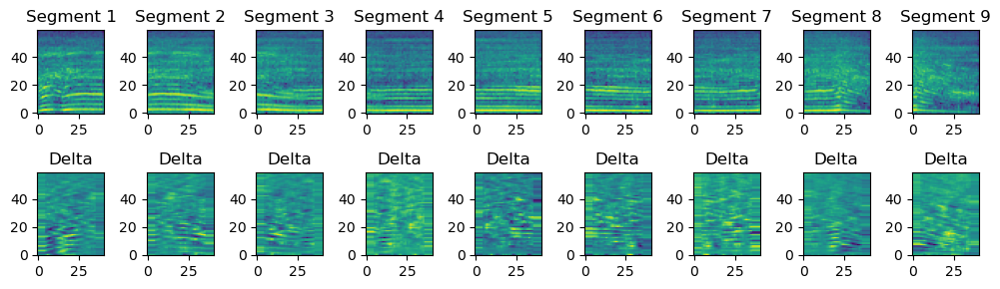

In [13]:
def esc_seg_mel_demo() -> None:
    dataset = EscLogMelSegmentDataset(esc10=True, long=False)
    # Train & test dataset has the same format so either one works for this demo
    _, test_dataset = dataset.get_train_and_test_datasets(config.fold_count, config.test_fold_index)
    entry = test_dataset[32]

    segments = entry.pop("audio")

    pprint(entry)

    n = len(segments)

    print(n, "segments found.")

    plt.figure(figsize=(n + 1, 2 + 1))

    for i, spec in enumerate(segments):
        spec = spec.numpy()

        plt.subplot(2, n, i + 1)
        plt.imshow(spec[0], aspect="auto", origin="lower")
        plt.title("Segment " + str(i + 1))

        plt.subplot(2, n, n + i + 1)
        plt.imshow(spec[1], aspect="auto", origin="lower")
        plt.title("Delta")

        print(
            f"Segment #{i + 1}: min = {np.min(spec[0])}, max = {np.max(spec[0])}, mean = {np.mean(spec[0])}"
        )

    plt.tight_layout()
    plt.show()

esc_seg_mel_demo()
del esc_seg_mel_demo

##### Data Augmentation On the Fly

Unsatisfied by the crude data augmentation proposed by piczak, we create a child class of the segmented log-mel dataset so we can generate randomly augmented segments on the fly, which is the more common thing to do and theoretically should do a better job at encouraging generalisation. However, as we have to continually re-generate mel-spectrograms during training, it will significantly increase the training time needed for each epoch.

In [14]:
class EscAugmentedLogMelSegmentDataset(EscLogMelSegmentDataset):
    sample_rate = 22_050

    # ESC-10:
    esc10_limits = {
        1: ((-4, 4), (0.95, 1.1)),
        3: ((0, 0), (0.9, 1.2)),
        4: ((-3, 6), (0.8, 1.3)),
        6: ((-4, 4), (0.9, 1.2)),
        7: ((0, 0), (0.9, 1.2)),
        8: ((-4, 2), (0.9, 1.2)),
        9: ((-3, 2), (0.95, 1.1)),
    }

    class OurIterableTrainingDataset(IterableDataset[dict]):
        def __init__(self, outer: 'EscAugmentedLogMelSegmentDataset', dataset: Dataset[dict]):
            super(EscAugmentedLogMelSegmentDataset.OurIterableTrainingDataset).__init__()
            self.outer = outer
            self.dataset = dataset

        def __iter__(self):
            worker_info = get_worker_info()
            assert worker_info is None # single-process data loading
            return self.generate_data()

        def generate_data(self):
            for entry in self.dataset:
                name = entry["filename"]
                waveform: torch.Tensor = entry["audio"]["array"]
                augmented = self.outer.augment(waveform.numpy(), entry["target"])
                segments, ranges = self.outer.extract_segments(name, augmented)
                segments = np.array(segments, dtype=np.float32)
                for segment in segments:
                    segment_tensor = torch.tensor(segment, device=waveform.device)
                    yield { **entry, "audio": segment_tensor }

    def __init__(self, *, esc10: bool, long: bool) -> None:
        super().__init__(esc10=esc10, long=long, augment_count=0, use_test_format=False)

    def get_name(self) -> str:
        return "log-mel-aug"

    def prepare_dataset(
        self, dataset: datasets.Dataset, is_test_dataset: bool | None
    ) -> datasets.Dataset:
        assert is_test_dataset is not None

        dataset = self.clean_and_resample(dataset, self.sample_rate)
        print(f"Preprocessing: cleaned dataset has {len(dataset)} samples.")

        if is_test_dataset:

            def test_data_transformer(audio: dict, target: int, filename: str) -> dict:
                segments, ranges = self.extract_segments(filename, audio["array"])
                return {
                    "audio": segments,
                    "ranges": ranges,
                    "target": self.convert_target(target),
                }

            dataset = dataset.map(
                test_data_transformer,
                input_columns=["audio", "target", "filename"],
                num_proc=config.cpu_count,
            )
        else:

            def train_data_transformer(target: int) -> dict:
                # Note how we keep the raw audio waveform untouched
                return {
                    "target": self.convert_target(target),
                }

            dataset = dataset.map(
                train_data_transformer,
                input_columns=["target"],
                num_proc=config.cpu_count,
            )

        print(f"Preprocessing: prepared dataset now has {len(dataset)} samples.")
        return dataset

    def convert_train_and_test_datasets(
        self, train_dataset: datasets.Dataset, test_dataset: datasets.Dataset
    ) -> tuple[Dataset[dict], Dataset[dict]]:
        train, test = super().convert_train_and_test_datasets(train_dataset, test_dataset)
        return self.OurIterableTrainingDataset(self, train), test

    def are_test_and_train_format_different(self) -> bool:
        return True


### Gammatone-Based Representations

Whilst we have also tried many different gammatone-based pre-processing methods, we mainly outline the most significant ones, which are all inspired by the novel techniques described in the paper [ovel TEO-based Gammatone features for environmental sound classification](https://doi.org/10.23919/EUSIPCO.2017.8081521), henceforth referred  to as the "TEO paper".

Unfortunately, the paper was very vague when it comes to the exact details of the pre-processing part. Hence, we basically had to construct everything from scratch with only their incomprehensive descriptions and some electrical-engineering textbooks. A significant amount of improvisation and heuristics were employed, and hence these representations should be considered partially original and certainly not an equivalent to the one(s) proposed in the aforementioned paper.

#### Gammatone Filterbank
A gammatone filterbank is a collection of gammatone filters designed to mimic how humans perceive and analyse sounds. Each filter is based on the gammatone function and centered around a set frequency, yielding different impulse responses that will pick up pitches in a similar way to the human ear.

##### Gammatone Filter
The impulse response of a gammatone filter is given by:

$$g(t)=t^{(n-1)}e^{(-2 \pi bt)}\cos{(2 \pi f_ct+\phi)}$$

where:
- $t$ is time,
- $n$ is the order of the filter,
- $b$ is the bandwidth of the filter,
- $f_c$ is the center frequency of the filter,
- $\phi$ is the phase.

Filters used in the filterbank are obtained with `make_erb_filters(sample_rate, centre_freqs)` function which constructs a filter for each of the given centre frequencies.

#### Center Frequency
Each filter in gammatone filterbank has a unique center frequency; the respective filter's response would be maximized at the centre frequency to effectively analyse different parts of the frequency spectrum. It is also how human ears works, where our sensory receptors are fine-tuned to pick up particular frequencies to decompose the signals.

We used helper function `centre_freqs(sample_rate, 60, 60)` to calculate the frequency for each filter.

#### Half Wave Rectifier
Half wave rectifiers allow only either the positive half-cycle of a signal or the negative half-cycle to go through. It is often used to convert AC to DC in electrical engineering for further signal pre-processing.

#### Teager Energy Operator
Teager Energy Operator (as known as TEO) is a nonlinear operator to estimate the energy of the signal. Unlike the traditional energy measures which rely on the square of the signal's amplitude, TEO takes into account both the amplitude and the instantaneous frequency of the signal, which can be used to help our models to further distinguish between different types of sounds.

The math and principles behind it can be found in this paper: https://doi.org/10.1109/ICOEI.2018.8553703

#### Short Term Averaging
Short term averaging is a method that take the average of a subset of the data points within a window of specified length moving along a certain axis. We use this to smooth out any occasional drastic discrepancies yielded by the TEO operator.

#### Pure TEO-GTSC Dataset

The dataset bundled with version of the TEO-GTSC pre-processing that we came up with.
Raw awaveforms are pre-processed using the above steps, before we apply logarithmmic compression like we did for the log-mel spectrograms.

In [15]:
class EscPureTeoGtscDataset(EscSegmentDataset):
    """
    This is the TEO-GTSC feature based on the description in the TEO paper.
    """

    def __init__(self, *, esc10: bool, long: bool, use_test_format = False) -> None:
        super().__init__(esc10=esc10, long=long, augment_count=0, use_test_format=use_test_format)

    def get_name(self) -> str:
        return "teo-gtsc" # "ggram"

    sample_rate = EscLogMelSegmentDataset.sample_rate
    centre_f = centre_freqs(sample_rate, 60, 20)
    erb_filters = make_erb_filters(sample_rate, centre_f)
    fcoefs = np.flipud(erb_filters)

    # Saw this method here: https://github.com/pratyush-prateek/environmental_sound_classification_1DCNN/blob/e9e43fc868d8a137b2f157ac84f3dc80ae3c054a/model_config.py#L147
    # which holds the source code for the paper https://doi.org/10.1016/j.eswa.2019.06.040
    # (End-to-end environmental sound classification using a 1D convolutional neural network)
    # gram = nnAudio.features.Gammatonegram(
    #     sr=ESCLogMelSegmentDataset.sample_rate,
    #     n_bins=60,
    #     trainable_STFT=False,
    #     verbose=False,
    # )
    # It did perform similarly but uses a different approach and is difficult to deal with
    # since it yields the gammatone-gram whereas we need access to the actual filterbank.

    @classmethod
    def apply_gammatone_filterbank(cls, y):
        # return cls.gram(torch.tensor(y).float()).squeeze().numpy()
        return erb_filterbank(y, cls.fcoefs)
        # TODO: Not sure about this part -- original split into hamming window
        # and dropped continuously silent windows first

    # Half Wave Rectifier (HWR)
    @staticmethod
    def half_wave_rectifier(y):
        return np.maximum(y, 0)

    # Teager Energy Operator (TEO)
    @staticmethod
    def teager_energy_operator(y: np.ndarray):
        energy = y[1:-1] ** 2 - y[:-2] * y[2:]
        # When the central sample is very small (or close to zero)
        # and the surrounding samples are NON-zero,
        # e.g. [1, 1, 0, 1, 1] -> [1, -1, 1]
        # So we replace the negative values with zero.
        energy[energy < 0] = 0
        return energy

    # Short-term Averaging
    @staticmethod
    def short_term_averaging(window_size: int, hop_size: int):
        def sta(signal: np.ndarray) -> np.ndarray:
            window_count = (len(signal) - window_size) // hop_size + 1
            result = np.zeros(window_count)

            for i in range(window_count):
                start_index = i * hop_size
                end_index = start_index + window_size
                window = signal[start_index:end_index]
                result[i] = np.mean(window)

            return result
        return sta

    def extract_segments(
        self, name: str, clip: np.ndarray
    ) -> tuple[list[np.ndarray], list[tuple]]:
        FRAMES_PER_SEGMENT = (
            self.frames_per_segment  # - 1
        )  # 41 frames ~= ??? ms segment length @ 22050 Hz (TODO)
        WINDOW_SIZE = FRAMES_PER_SEGMENT  # ?? ms per frame @ 22050 Hz
        STEP_SIZE = int(FRAMES_PER_SEGMENT * (0.1 if self.long else 0.5))
        N_FFT = 1024
        HOP_LEN = N_FFT // 2

        s = 0
        segments = []
        ranges = []

        normalization_factor = 1 / np.max(np.abs(clip))
        clip = clip * normalization_factor

        # Apply Gammatone filterbank
        y_filtered = self.apply_gammatone_filterbank(clip)
        # print(y_filtered.shape, np.min(y_filtered), np.max(y_filtered))

        # Apply Half Wave Rectifier
        y_hwr = self.half_wave_rectifier(y_filtered)
        # print(y_hwr.shape, np.min(y_hwr), np.max(y_hwr))

        # Apply Teager Energy Operator
        y_teo = np.apply_along_axis(self.teager_energy_operator, 1, y_hwr)
        # print(y_teo.shape, np.min(y_teo), np.max(y_teo))

        # Apply Short-term Averaging
        y_sta = np.apply_along_axis(self.short_term_averaging(N_FFT, HOP_LEN), 1, y_teo)  # y_teo)
        # print(y_sta.shape, np.min(y_sta), np.max(y_sta))

        # Apply Logarithmic Compression
        y_log = librosa.power_to_db(y_sta, ref=np.max, top_db=None) # np.log1p(y_sta * ((np.e - 1) / np.max(y_sta)))
        y_log /= np.max(np.abs(y_log))
        y_log += 1
        # print(y_log.shape, np.min(y_log), np.max(y_log))

        teo_gtsc = y_log

        fused = teo_gtsc  # no fusion occurs

        # hamming_window = np.hamming(WINDOW_SIZE)
        while (segment := fused[:, s * STEP_SIZE : s * STEP_SIZE + WINDOW_SIZE]).shape[
            1
        ] == WINDOW_SIZE:
            if np.mean(segment) > 0.025:
                # segment = segment * hamming_window
                delta = librosa.feature.delta(segment)
                segments.append([segment, delta])
                # mel_segment = mel[:, s * STEP_SIZE : s * STEP_SIZE + WINDOW_SIZE]
                # segments.append([segment, mel_segment])
                ranges.append((s * STEP_SIZE, s * STEP_SIZE + WINDOW_SIZE))
            # else drop silent frames;
            # TODO: idk about the threshold -- i just guessed a random number :/

            s += 1

        if len(segments) <= 0:
            # For debugging
            print("\n\n" + name + " " + str(np.mean(segment)) + "\n\n")
            np.savetxt(os.path.join(config.output_dir, "segment_dump.txt"), fused, "%.2e")
        assert len(segments) > 0

        return segments, ranges

    def augment(self, audio: np.ndarray, target: int) -> np.ndarray:
        raise NotImplementedError("Unsupported for now")

    def are_test_and_train_format_different(self) -> bool:
        return True

Below is an example entry from the dataset:

ESC Dataset: Found cache for fold-0 at '.cache\esc10\teo-gtsc\seg-short-test\fold-0': sample count = 80
ESC Dataset: Found cache for fold-1 at '.cache\esc10\teo-gtsc\seg-short-test\fold-1': sample count = 80
ESC Dataset: Found cache for fold-2 at '.cache\esc10\teo-gtsc\seg-short-test\fold-2': sample count = 80
ESC Dataset: Found cache for fold-3 at '.cache\esc10\teo-gtsc\seg-short-test\fold-3': sample count = 80
ESC Dataset: Found cache for fold-4 at '.cache\esc10\teo-gtsc\seg-short-test\fold-4': sample count = 80
ESC Dataset: Found cache for fold-0 at '.cache\esc10\teo-gtsc\seg-short\fold-0': sample count = 629
ESC Dataset: Found cache for fold-1 at '.cache\esc10\teo-gtsc\seg-short\fold-1': sample count = 641
ESC Dataset: Found cache for fold-2 at '.cache\esc10\teo-gtsc\seg-short\fold-2': sample count = 648
ESC Dataset: Found cache for fold-3 at '.cache\esc10\teo-gtsc\seg-short\fold-3': sample count = 636
ESC Dataset: Found cache for fold-4 at '.cache\esc10\teo-gtsc\seg-short\fold-4':

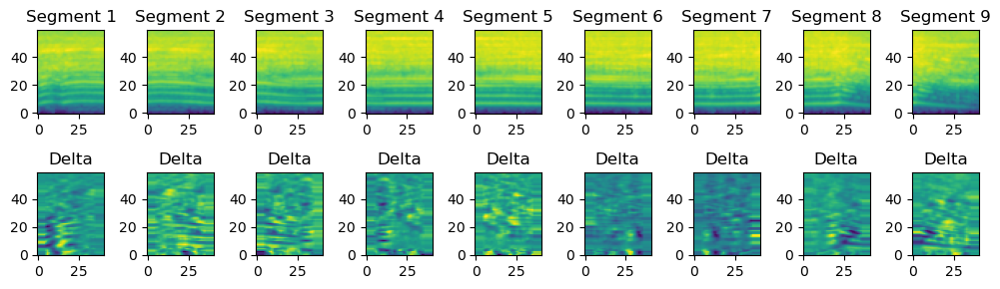

In [16]:
def esc_pure_teo_gtsc_demo() -> None:
    dataset = EscPureTeoGtscDataset(esc10=True, long=False)
    # Train & test dataset has the same format so either one works for this demo
    _, test_dataset = dataset.get_train_and_test_datasets(config.fold_count, config.test_fold_index)
    entry = test_dataset[32]

    segments = entry.pop("audio")

    pprint(entry)

    n = len(segments)

    print(n, "segments found.")

    plt.figure(figsize=(n + 1, 2 + 1))

    for i, spec in enumerate(segments):
        spec = spec.numpy()

        plt.subplot(2, n, i + 1)
        plt.imshow(spec[0], aspect="auto", origin="lower")
        plt.title("Segment " + str(i + 1))

        plt.subplot(2, n, n + i + 1)
        plt.imshow(spec[1], aspect="auto", origin="lower")
        plt.title("Delta")

        print(
            f"Segment #{i + 1}: min = {np.min(spec[0])}, max = {np.max(spec[0])}, mean = {np.mean(spec[0])}"
        )

    plt.tight_layout()
    plt.show()

esc_pure_teo_gtsc_demo()
del esc_pure_teo_gtsc_demo

#### Fused TEO-GTSC Dataset

In addition to the above, we propose a novel way of pre-processing the dataset: we perform a special type of concatenation-free feature-level fusion of a custom version of Gammatione-gram (generated by applying STA to the square of the amplitudes of the raw channels) with TEO-GTSC using a weighted average. The optimal $\alpha$ value (i.e. the wieght for the first feature) we ended up choosing after various quick, informal experiments was $0.5$.

In [17]:
class EscFusedTeoGtscDataset(EscSegmentDataset):
    """Inheritance is messed up -- TODO: extract superclass later..."""

    def __init__(self, *, esc10: bool) -> None:
        super().__init__(esc10=esc10, long=False, augment_count=0, use_test_format=False)

    def get_name(self) -> str:
        return "gtsc"

    def get_format(self) -> EscDataset.Format:
        return "seg-short"

    sample_rate = EscSegmentDataset.sample_rate
    centre_f = centre_freqs(sample_rate, 60, 20)
    erb_filters = make_erb_filters(sample_rate, centre_f)
    fcoefs = np.flipud(erb_filters)

    # Also tried to fuse with this but didn't work well
    # gram = nnAudio.features.Gammatonegram(
    #     sr=ESCLogMelSegmentDataset.sample_rate,
    #     n_bins=60,
    #     trainable_STFT=False,
    #     verbose=False,
    # )

    @classmethod
    def apply_gammatone_filterbank(cls, y, sr: int, num_bands):
        # return cls.gram(torch.tensor(y).float()).squeeze().numpy()
        return erb_filterbank(y, cls.fcoefs)
        # TODO: Not sure about this part -- original split into hamming window
        # and dropped continuously silent windows first

    # Half Wave Rectifier (HWR)
    @staticmethod
    def half_wave_rectifier(y):
        return np.maximum(y, 0)

    # Teager Energy Operator (TEO)
    @staticmethod
    def teager_energy_operator(y: np.ndarray):
        energy = y[1:-1] ** 2 - y[:-2] * y[2:]
        # When the central sample is very small (or close to zero)
        # and the surrounding samples are NON-zero,
        # e.g. [1, 1, 0, 1, 1] -> [1, -1, 1]
        # So we replace the negative values with zero.
        energy[energy < 0] = 0
        return energy

    # Short-term Averaging
    @staticmethod
    def short_term_averaging(signal: np.ndarray, window_size=1024, hop_size=512):
        window_count = (len(signal) - window_size) // hop_size + 1
        result = np.zeros(window_count)

        for i in range(window_count):
            start_index = i * hop_size
            end_index = start_index + window_size
            window = signal[start_index:end_index]
            result[i] = np.mean(window)

        return result

    def extract_segments(
        self, name: str, clip: np.ndarray
    ) -> tuple[list[np.ndarray], list[tuple]]:
        FRAMES_PER_SEGMENT = self.frames_per_segment
        WINDOW_SIZE = FRAMES_PER_SEGMENT  # ?? ms per frame @ 22050 Hz
        STEP_SIZE = FRAMES_PER_SEGMENT // 2
        BANDS = 60

        # For score-level fusion
        alpha = 0.5

        s = 0
        segments = []
        ranges = []

        normalization_factor = 1 / np.max(np.abs(clip))
        clip = clip * normalization_factor

        # Apply Gammatone filterbank
        y_filtered = self.apply_gammatone_filterbank(clip, self.sample_rate, BANDS)
        # print(y_filtered.shape, np.min(y_filtered), np.max(y_filtered))

        # Get Gammatone-Gram by converting to power
        # y_spec = np.sqrt(np.apply_along_axis(self.short_term_averaging, 1, np.square(y_filtered)))
        y_spec = np.apply_along_axis(
            self.short_term_averaging, 1, np.square(y_filtered)
        )

        # Apply Half Wave Rectifier
        y_hwr = self.half_wave_rectifier(y_filtered)
        # print(y_hwr.shape, np.min(y_hwr), np.max(y_hwr))

        # Apply Teager Energy Operator
        y_teo = np.apply_along_axis(self.teager_energy_operator, 1, y_hwr)
        # print(y_teo.shape, np.min(y_teo), np.max(y_teo))

        # Apply Short-term Averaging
        y_sta = np.apply_along_axis(self.short_term_averaging, 1, y_teo)  # y_teo)
        # print(y_sta.shape, np.min(y_sta), np.max(y_sta))

        # Apply Logarithmic Compression
        y_log = np.log1p(np.sqrt(y_sta)) # nvm this should work... no??
        # print(y_log.shape, np.min(y_log), np.max(y_log))

        def normalise(y: np.ndarray):
            normalization_factor: float = 1 / np.max(np.abs(y))
            # print("Normalisation factor:", normalization_factor)
            return y * normalization_factor  # - 0.5

        fused = normalise(y_spec) * alpha + normalise(y_log) * (1 - alpha)

        while (segment := fused[:, s * STEP_SIZE : s * STEP_SIZE + WINDOW_SIZE]).shape[
            1
        ] == WINDOW_SIZE:
            delta = librosa.feature.delta(segment)

            if np.mean(segment) > 1e-5:
                segments.append([segment, delta])
                ranges.append((s * STEP_SIZE, s * STEP_SIZE + WINDOW_SIZE))
            # else drop silent frames;
            # TODO: idk about the threshold -- i just guessed a random number :/

            s += 1

        if len(segments) <= 0:
            # For debugging
            print("\n\n" + name + "\n\n")
        assert len(segments) > 0

        return segments, ranges
    
    def augment(self, audio: np.ndarray, target: int) -> np.ndarray:
        raise NotImplementedError("Unsupported for now")
    
    def are_test_and_train_format_different(self) -> bool:
        return True


An example entry is shown below:

ESC Dataset: Found cache for fold-0 at '.cache\esc10\gtsc\seg-short-test\fold-0': sample count = 80
ESC Dataset: Found cache for fold-1 at '.cache\esc10\gtsc\seg-short-test\fold-1': sample count = 80
ESC Dataset: Found cache for fold-2 at '.cache\esc10\gtsc\seg-short-test\fold-2': sample count = 80
ESC Dataset: Found cache for fold-3 at '.cache\esc10\gtsc\seg-short-test\fold-3': sample count = 80
ESC Dataset: Found cache for fold-4 at '.cache\esc10\gtsc\seg-short-test\fold-4': sample count = 80
ESC Dataset: Found cache for fold-0 at '.cache\esc10\gtsc\seg-short\fold-0': sample count = 641
ESC Dataset: Found cache for fold-1 at '.cache\esc10\gtsc\seg-short\fold-1': sample count = 660
ESC Dataset: Found cache for fold-2 at '.cache\esc10\gtsc\seg-short\fold-2': sample count = 662
ESC Dataset: Found cache for fold-3 at '.cache\esc10\gtsc\seg-short\fold-3': sample count = 658
ESC Dataset: Found cache for fold-4 at '.cache\esc10\gtsc\seg-short\fold-4': sample count = 675
{'esc10': tensor(Tru

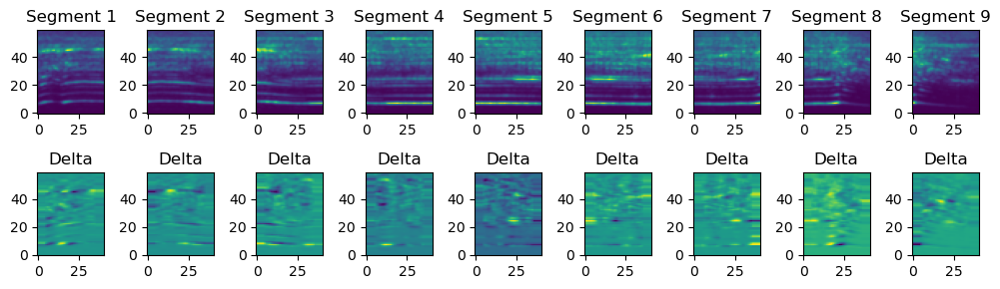

In [18]:
def esc_fused_teo_gtsc_demo() -> None:
    dataset = EscFusedTeoGtscDataset(esc10=True)
    # Train & test dataset has the same format so either one works for this demo
    _, test_dataset = dataset.get_train_and_test_datasets(config.fold_count, config.test_fold_index)
    entry = test_dataset[32]

    segments = entry.pop("audio")

    pprint(entry)

    n = len(segments)

    print(n, "segments found.")

    plt.figure(figsize=(n + 1, 2 + 1))

    for i, spec in enumerate(segments):
        spec = spec.numpy()

        plt.subplot(2, n, i + 1)
        plt.imshow(spec[0], aspect="auto", origin="lower")
        plt.title("Segment " + str(i + 1))

        plt.subplot(2, n, n + i + 1)
        plt.imshow(spec[1], aspect="auto", origin="lower")
        plt.title("Delta")

        print(
            f"Segment #{i + 1}: min = {np.min(spec[0])}, max = {np.max(spec[0])}, mean = {np.mean(spec[0])}"
        )

    plt.tight_layout()
    plt.show()

esc_fused_teo_gtsc_demo()
del esc_fused_teo_gtsc_demo

## Models

After constructing the above parts of our framework, we are then free to test different architectures on any of the datasets and preprocessing methods implemented above.

When replicate the models proposed in the papers, we had to construct each network manually
since most papers do not publish source code, and the source code of those that do is difficult
to integrate into our framework.

In [19]:
def init_weights(net: nn.Module) -> None:
    def init_pass(module: nn.Module) -> None:
        # Based on weight initialisation used by torchvision.models.VGG
        if isinstance(module, nn.Conv2d):
            nn.init.kaiming_normal_(module.weight, mode="fan_out", nonlinearity="relu")
            if module.bias is not None:
                nn.init.constant_(module.bias, 0)
        elif isinstance(module, nn.BatchNorm2d):
            nn.init.constant_(module.weight, 1)
            nn.init.constant_(module.bias, 0)
        elif isinstance(module, nn.Linear):
            nn.init.normal_(module.weight, 0, 0.01)
            nn.init.constant_(module.bias, 0)

    net.apply(init_pass)
    print("Weight initialisation complete.")

The weight initialisation method used here is based on the default weight initialisation for the `torchvision.models.VGG` module in the source code of `pytorch`.
- We initialise all bias weights to zero
- For 2D convolution layers, we apply Kaiming initialization (since all convolution layers in our networks uses ReLU activation)
- For 2D any batch normalisation layers, we initialise their weights ($\gamma$ values) to $1$ so the normalised inputs are unscaled at first.
- For fully-connected layers, we simply initialise the weights using a normal distribution with $\mu = 0$ and $\sigma = 0.01$.
Even though originally intended for use with the relatively deeper VGG networks, we have experimentally found out that it works well for our networks as well.
Hence, we decided to keep using this as it currently is to initialise the weights for all models we replicated or came up with.

### Debug Net

We have built a two-layer perceptron network for the purposes of troubleshooting and demonstration.

In [20]:
class DebugNet(nn.Module):
    def __init__(self, class_count: int, input_shape: tuple[int, ...]):
        super(DebugNet, self).__init__()
        self.main = nn.Sequential(
            nn.Flatten(start_dim=1),
            nn.Linear(np.prod(input_shape).item(), 64),
            nn.Tanh(),
            nn.Linear(64, class_count),
            nn.LogSoftmax(dim=1),
        )

    def forward(self, x: torch.Tensor) -> torch.Tensor:
        return self.main(x)

In [21]:
torchinfo.summary(DebugNet(class_count=10, input_shape=(1, 224, 224)), input_size=(1, 1, 224, 224))

Layer (type:depth-idx)                   Output Shape              Param #
DebugNet                                 [1, 10]                   --
├─Sequential: 1-1                        [1, 10]                   --
│    └─Flatten: 2-1                      [1, 50176]                --
│    └─Linear: 2-2                       [1, 64]                   3,211,328
│    └─Tanh: 2-3                         [1, 64]                   --
│    └─Linear: 2-4                       [1, 10]                   650
│    └─LogSoftmax: 2-5                   [1, 10]                   --
Total params: 3,211,978
Trainable params: 3,211,978
Non-trainable params: 0
Total mult-adds (Units.MEGABYTES): 3.21
Input size (MB): 0.20
Forward/backward pass size (MB): 0.00
Params size (MB): 12.85
Estimated Total Size (MB): 13.05

<div class="alert alert-block alert-info"> 
<b>&#x1F914; What is this?</b> 

The model summary is a small report of the structure and properties of the network. It breaks down the architecture into its constituent layers showing the input and output tensor shapes and dimensions, as well as the number of parameters contained therein. It also calculates total number of parameters which need to be trained and used by the model, and can also estimate the amount of space needed. This provides valuable information on the inference cost of the model, as well as act as a quick reference for keeping track of any changes we have made when improving the architecture. It also shed light on the time needed to train our models. Furthermore, the information on individual layers makes it easy for us to identify which layers in the neural network need to be altered, removed or re-designed to minimise the amount of computation power required by the model.
</div>

### VGG-16

Our VGG-16 network implementation allows us to observe what accuracy a standard deep CNN network like this, which is often used as baselines, could achieve. It consists of 16 layers with 13 convolutional layers and 3 fully connected layers. As it is renowned for its strong performance on image classification despite its simplicity, we hypothesised that it would make a decent baseline for us to further improve on.

In [22]:
# based off VGG-16: https://www.geeksforgeeks.org/vgg-16-cnn-model/
class VGG16(nn.Module):
    """Our network (name yet to be decided)"""

    def __init__(self, class_count: int, input_channels=1):
        super(VGG16, self).__init__()
        self.main = nn.Sequential(
            nn.Sequential(
                nn.Conv2d(
                    in_channels=input_channels,
                    out_channels=64,
                    kernel_size=3,
                    padding=1,
                ),
                nn.BatchNorm2d(64),
                nn.ReLU(),
                nn.Conv2d(in_channels=64, out_channels=64, kernel_size=3, padding=1),
                nn.BatchNorm2d(64),
                nn.ReLU(),
                nn.MaxPool2d(kernel_size=2, stride=2),
            ),
            nn.Sequential(
                nn.Conv2d(in_channels=64, out_channels=128, kernel_size=3, padding=1),
                nn.BatchNorm2d(128),
                nn.ReLU(),
                nn.Conv2d(in_channels=128, out_channels=128, kernel_size=3, padding=1),
                nn.BatchNorm2d(128),
                nn.ReLU(),
                nn.MaxPool2d(kernel_size=2, stride=2),
            ),
            nn.Sequential(
                nn.Conv2d(in_channels=128, out_channels=256, kernel_size=3, padding=1),
                nn.BatchNorm2d(256),
                nn.ReLU(),
                nn.Conv2d(in_channels=256, out_channels=256, kernel_size=3, padding=1),
                nn.BatchNorm2d(256),
                nn.ReLU(),
                nn.Conv2d(in_channels=256, out_channels=256, kernel_size=3, padding=1),
                nn.BatchNorm2d(256),
                nn.ReLU(),
                nn.MaxPool2d(kernel_size=2, stride=2),
            ),
            nn.Sequential(
                nn.Conv2d(in_channels=256, out_channels=512, kernel_size=3, padding=1),
                nn.BatchNorm2d(512),
                nn.ReLU(),
                nn.Conv2d(in_channels=512, out_channels=512, kernel_size=3, padding=1),
                nn.BatchNorm2d(512),
                nn.ReLU(),
                nn.Conv2d(in_channels=512, out_channels=512, kernel_size=3, padding=1),
                nn.BatchNorm2d(512),
                nn.ReLU(),
                nn.MaxPool2d(kernel_size=2, stride=2),
            ),
            nn.Sequential(
                nn.Conv2d(in_channels=512, out_channels=512, kernel_size=3, padding=1),
                nn.BatchNorm2d(512),
                nn.ReLU(),
                nn.Conv2d(in_channels=512, out_channels=512, kernel_size=3, padding=1),
                nn.BatchNorm2d(512),
                nn.ReLU(),
                nn.Conv2d(in_channels=512, out_channels=512, kernel_size=3, padding=1),
                nn.BatchNorm2d(512),
                nn.ReLU(),
                nn.MaxPool2d(kernel_size=2, stride=2),
            ),
            nn.Flatten(start_dim=1),
            nn.Sequential(
                nn.Dropout(0.5),
                nn.Linear(512 * 7 * 7, 4096),
                nn.ReLU(),
                nn.Dropout(0.5),
                nn.Linear(4096, 4096),
                nn.ReLU(),
                nn.Linear(4096, class_count),
                nn.LogSoftmax(dim=1),
            ),
        )

    def forward(self, x: torch.Tensor) -> torch.Tensor:
        # NOTE: x is always of size (batch size, ...)
        return self.main(x)

In [23]:
torchinfo.summary(VGG16(class_count=10), input_size=(1, 1, 224, 224))

Layer (type:depth-idx)                   Output Shape              Param #
VGG16                                    [1, 10]                   --
├─Sequential: 1-1                        [1, 10]                   --
│    └─Sequential: 2-1                   [1, 64, 112, 112]         --
│    │    └─Conv2d: 3-1                  [1, 64, 224, 224]         640
│    │    └─BatchNorm2d: 3-2             [1, 64, 224, 224]         128
│    │    └─ReLU: 3-3                    [1, 64, 224, 224]         --
│    │    └─Conv2d: 3-4                  [1, 64, 224, 224]         36,928
│    │    └─BatchNorm2d: 3-5             [1, 64, 224, 224]         128
│    │    └─ReLU: 3-6                    [1, 64, 224, 224]         --
│    │    └─MaxPool2d: 3-7               [1, 64, 112, 112]         --
│    └─Sequential: 2-2                   [1, 128, 56, 56]          --
│    │    └─Conv2d: 3-8                  [1, 128, 112, 112]        73,856
│    │    └─BatchNorm2d: 3-9             [1, 128, 112, 112]        256
│  

### Piczak CNN

The recommended baseline for ESC-50 and ESC-10 proposed by Karol Piczak, the author of the ESC datasets. It uses 2 convolutional layers, the first with dropout applied, followed by 3 fully connected layers also with dropout. The probability of the dropouts were all set to be 0.5. Its aim was to leverage computer vision techniques, in particular the convolution and pooling layers, to extract and learn local structures present in the input log-mel spectrogram (even though other kinds of spectrogram-like data also work) and use these learnt characteristics to classify sounds, which was a somewhat novel approach at the time it was published. One advantage of this network is its minimalism, being less demanding on computational resources due to having less parameters &mdash; especially when compared to really deep CNNs and some other bloated SoTA models. Overall this network has a reported accuracy of 76% on ESC-10 which can serve as a strong baseline for this task.

In [24]:
class PiczakCNNBaseline(nn.Module):
    """ESC-50 CNN Baseline

    K. J. Piczak, “Environmental sound classification with convolutional
    neural networks,” in 25th Int. Workshop on Machine Learning for Signal
    Processing (MLSP), Boston, MA, USA, 2015, pp. 1-6.

    Original Repo: https://github.com/karolpiczak/paper-2015-esc-convnet

    Had to replicate from scratch again because the author used `pylearn2`,
    which is a discontinued library with zero documentation
    so we had to actually dig through the source code of the library itself
    just to figure out what on earth is going on :(
    """

    def __init__(self, class_count: int, long: bool, input_channels=2):
        super(PiczakCNNBaseline, self).__init__()
        self.class_count = class_count
        self.long = long
        self.input_size = (60, 101) if long else (60, 41)

        if long:
            self.fc_in_size = 80 * 1 * 10
        else:
            self.fc_in_size = 80 * 1 * 4

        self.main = nn.Sequential(
            nn.Sequential(
                # 2 @ 60 x 41 / 101
                nn.Conv2d(
                    in_channels=input_channels, out_channels=80, kernel_size=(57, 6)
                ),
                nn.ReLU(),
                # 80 @ 4 x 36 / 96
                nn.MaxPool2d(kernel_size=(4, 3), stride=(1, 3)),
                # 80 @ 1 x 12 / 32
                nn.Dropout(p=0.5),
            ),
            nn.Sequential(
                nn.Conv2d(in_channels=80, out_channels=80, kernel_size=(1, 3)),
                nn.ReLU(),
                # 80 @ 1 x 10 / 30
                # See https://github.com/lisa-lab/pylearn2/blob/af81e5c362f0df4df85c3e54e23b2adeec026055/pylearn2/models/mlp.py#L3540
                nn.MaxPool2d(kernel_size=(1, 3), stride=(1, 3), ceil_mode=True),
                # 80 @ 1 x 4 / 10
                # No Dropout
            ),
            nn.Flatten(start_dim=1),
            nn.Sequential(
                nn.Linear(in_features=self.fc_in_size, out_features=5000),
                nn.ReLU(),
                nn.Dropout(p=0.5),
            ),
            nn.Sequential(
                nn.Linear(in_features=5000, out_features=5000),
                nn.ReLU(),
                nn.Dropout(p=0.5),
            ),
            nn.Sequential(
                nn.Linear(5000, class_count),
                # See https://github.com/lisa-lab/pylearn2/blob/af81e5c362f0df4df85c3e54e23b2adeec026055/pylearn2/models/mlp.py#L1416
                nn.LogSoftmax(dim=1),
            ),
        )

    def forward(self, x: torch.Tensor) -> torch.Tensor:
        return self.main(x)

In [25]:
torchinfo.summary(PiczakCNNBaseline(class_count=10, long=False), input_size=(1, 2, 60, 41))

Layer (type:depth-idx)                   Output Shape              Param #
PiczakCNNBaseline                        [1, 10]                   --
├─Sequential: 1-1                        [1, 10]                   --
│    └─Sequential: 2-1                   [1, 80, 1, 12]            --
│    │    └─Conv2d: 3-1                  [1, 80, 4, 36]            54,800
│    │    └─ReLU: 3-2                    [1, 80, 4, 36]            --
│    │    └─MaxPool2d: 3-3               [1, 80, 1, 12]            --
│    │    └─Dropout: 3-4                 [1, 80, 1, 12]            --
│    └─Sequential: 2-2                   [1, 80, 1, 4]             --
│    │    └─Conv2d: 3-5                  [1, 80, 1, 10]            19,280
│    │    └─ReLU: 3-6                    [1, 80, 1, 10]            --
│    │    └─MaxPool2d: 3-7               [1, 80, 1, 4]             --
│    └─Flatten: 2-3                      [1, 320]                  --
│    └─Sequential: 2-4                   [1, 5000]                 --
│    │ 

### TEO Paper CNN

The CNN proposed by the TEO paper. Based on the Piczak CNN, it is a shallower network designed to receive GTSC and TEO-GTSC tensors generated by the improved preprocessing pipeline proposed in the paper, rather than deepening network to achieve an improvement on accuracy which is a common (but not necessarily better) approach found in the literature. 

By applying a Teager Energy Operator (TEO) it tracks the energy provided by the ESC-10 dataset in terms of amplitude and frequency, then using a gammatone filterbank it converts this output to represent characteristics of human auditory processing. Using this preprocessing we used the piczak network as used by the original authors which uses 2 convolutional layers with max pooling followed by a linear layer to try differentiate and learn features. Theoretically, this representaion breaks down the audio into more differentiable features for the network to learn.

In [26]:
class TEOGammmatoneCNN(nn.Module):
    """CNN Proposed in "Novel TEO-based Gammatone Features for Environmental Sound Classification"

    D. M. Agrawal, H. B. Sailor, M. H. Soni and H. A. Patil,
    "Novel TEO-based Gammatone features for environmental sound classification,"
    2017 25th European Signal Processing Conference (EUSIPCO), Kos, Greece, 2017, pp. 1809-1813,
    doi: 10.23919/EUSIPCO.2017.8081521.

    This is a modified version of the Piczak model proposed in the paper.

    Since its source code was not published, this is purely constructed by hand from scratch,
    with a certain degree of heuristics being applied where it is unclear in the original paper.
    """

    def __init__(self, class_count: int, input_channels=2):
        super(TEOGammmatoneCNN, self).__init__()
        self.class_count = class_count
        self.input_size = (60, 41)
        self.fc_in_size = 80 * 1 * 4

        self.main = nn.Sequential(
            # not using in-place operations for now because it might mess with backprop...
            nn.Sequential(
                # 2 @ 60 x 41 / 101
                nn.Conv2d(
                    in_channels=input_channels,
                    out_channels=80,
                    kernel_size=(57, 6),  # 60 x 6 specified, assuming to be mistake...
                ),
                nn.ReLU(),
                # 80 @ 4 x 36 / 96
                nn.MaxPool2d(kernel_size=(4, 3), stride=(1, 3)),
                # 80 @ 1 x 12 / 32
                nn.Dropout(p=0.5),
            ),
            nn.Sequential(
                nn.Conv2d(in_channels=80, out_channels=80, kernel_size=(1, 3)),
                nn.ReLU(),
                # 80 @ 1 x 10 / 30
                # See https://github.com/lisa-lab/pylearn2/blob/af81e5c362f0df4df85c3e54e23b2adeec026055/pylearn2/models/mlp.py#L3540
                nn.MaxPool2d(kernel_size=(1, 3), stride=(1, 3), ceil_mode=True),
                # 80 @ 1 x 4 / 10
                # No Dropout
            ),
            nn.Flatten(start_dim=1),
            nn.Sequential(
                nn.Linear(in_features=self.fc_in_size, out_features=500),
                nn.ReLU(),
                nn.Dropout(p=0.5),
            ),
            nn.Sequential(
                nn.Linear(500, class_count),
                # See https://github.com/lisa-lab/pylearn2/blob/af81e5c362f0df4df85c3e54e23b2adeec026055/pylearn2/models/mlp.py#L1416
                nn.LogSoftmax(dim=1),
            ),
        )

    def forward(self, x: torch.Tensor) -> torch.Tensor:
        return self.main(x)

In [27]:
torchinfo.summary(TEOGammmatoneCNN(class_count=10), input_size=(1, 2, 60, 41))

Layer (type:depth-idx)                   Output Shape              Param #
TEOGammmatoneCNN                         [1, 10]                   --
├─Sequential: 1-1                        [1, 10]                   --
│    └─Sequential: 2-1                   [1, 80, 1, 12]            --
│    │    └─Conv2d: 3-1                  [1, 80, 4, 36]            54,800
│    │    └─ReLU: 3-2                    [1, 80, 4, 36]            --
│    │    └─MaxPool2d: 3-3               [1, 80, 1, 12]            --
│    │    └─Dropout: 3-4                 [1, 80, 1, 12]            --
│    └─Sequential: 2-2                   [1, 80, 1, 4]             --
│    │    └─Conv2d: 3-5                  [1, 80, 1, 10]            19,280
│    │    └─ReLU: 3-6                    [1, 80, 1, 10]            --
│    │    └─MaxPool2d: 3-7               [1, 80, 1, 4]             --
│    └─Flatten: 2-3                      [1, 320]                  --
│    └─Sequential: 2-4                   [1, 500]                  --
│    │ 

### Our model

We base our improved model on PiczakCNN due to its flexibility and minimalism. With our numerous attempts beforehand, it is found that simply increasing the depth a model only brings limited improvements in accuracy despite a significant increase in computational costs that also no longer caters to out goal, whilst ensemble learning by data augmentations is not scalable and still brings limited improvements to few-class classifications. Unsatisfied with only getting our greatest improvements from signal processing, we propose a novel "heterogeneous parallel CNN" architecture in hopes that it will improve the accuracy further.

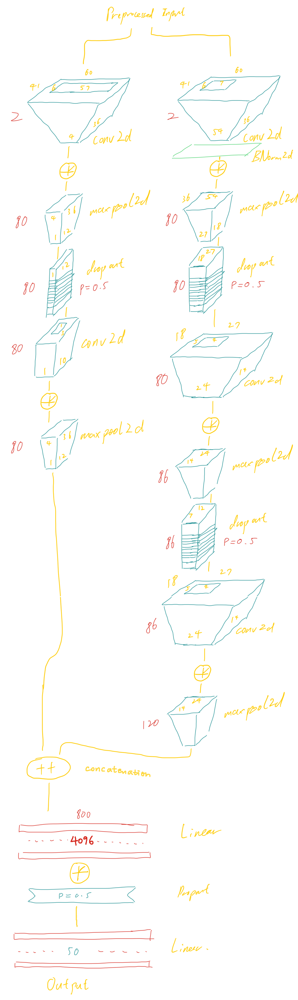

The left convnet extracts the time-series feature of the sound, whilst the deeper and denser right convnet focuses on various local attentions. At the end the two network are concatenated and passed through a single dense fully-connected layer and an output layer. The two branches processes the input independently, and are designed to have different depths.

In [28]:
class OurNet(nn.Module):
    """Based on ESC-50 CNN Baseline by K. J. Piczak"""
    
    def __init__(self, class_count: int):
        super(OurNet, self).__init__()
        self.class_count = class_count
        self.input_size = (60, 41)

        self.fc_in_size = 80 * 1 * 4 + 120 * 4 * 1

        self.cnn_along_time = nn.Sequential(
            # not using in-place operations for now because it might mess with backprop...
            nn.Sequential(
                # 2 @ 60 x 41 / 101
                nn.Conv2d(
                    in_channels=2, out_channels=80, kernel_size=(57, 6)
                ),
                nn.ReLU(),
                # 80 @ 4 x 36 / 96
                nn.MaxPool2d(kernel_size=(4, 3), stride=(1, 3)),
                # 80 @ 1 x 12 / 32
                nn.Dropout(p=0.5),
            ),
            nn.Sequential(
                nn.Conv2d(in_channels=80, out_channels=80, kernel_size=(1, 3)),
                nn.ReLU(),
                # 80 @ 1 x 10 / 30
                nn.MaxPool2d(kernel_size=(1, 3), stride=(1, 3), ceil_mode=True),
                # 80 @ 1 x 4 / 10
                # No Dropout
            ),
        )

        self.cnn_square_features = nn.Sequential(
            nn.Sequential(
                # 2 @ 60 x 41
                nn.Conv2d(
                    in_channels=2, out_channels=80, kernel_size=(7, 6)
                ),
                nn.BatchNorm2d(80),
                nn.ReLU(),
                # 80 @ 54 x 36
                nn.MaxPool2d(kernel_size=(2, 2), stride=(2, 2)),
                # 80 @ 27 x 18
                nn.Dropout(p=0.5),
            ),
            nn.Sequential(
                nn.Conv2d(in_channels=80, out_channels=86, kernel_size=(4, 5)),
                nn.ReLU(),
                # 86 @ 24 x 14
                nn.MaxPool2d(kernel_size=(2, 2), stride=(2, 2)),
                # 86 @ 12 x 7
                nn.Dropout(p=0.3),
            ),
            nn.Sequential(
                nn.Conv2d(in_channels=86, out_channels=120, kernel_size=(5, 6)),
                nn.ReLU(),
                # 120 @ 8 x 2
                nn.MaxPool2d(kernel_size=(2, 2), stride=(2, 2)),
                # 120 @ 4 x 1
            ),
        )

        self.fc = nn.Sequential(
            nn.Sequential(
                nn.Linear(in_features=int(self.fc_in_size), out_features=4096),
                nn.ReLU(),
                nn.Dropout(p=0.5),
            ),
            nn.Sequential(
                nn.Linear(4096, class_count),
                nn.LogSoftmax(dim=1),
            ),
        )

    def forward(self, x: torch.Tensor) -> torch.Tensor:
        cnn1_out = torch.flatten(self.cnn_along_time(x), start_dim=1)
        cnn2_out = torch.flatten(self.cnn_square_features(x), start_dim=1)
        cnn_combined = torch.cat((cnn1_out, cnn2_out), dim=1)
        return self.fc(cnn_combined)

In [29]:
torchinfo.summary(OurNet(class_count=10), input_size=(1, 2, 60, 41))

Layer (type:depth-idx)                   Output Shape              Param #
OurNet                                   [1, 10]                   --
├─Sequential: 1-1                        [1, 80, 1, 4]             --
│    └─Sequential: 2-1                   [1, 80, 1, 12]            --
│    │    └─Conv2d: 3-1                  [1, 80, 4, 36]            54,800
│    │    └─ReLU: 3-2                    [1, 80, 4, 36]            --
│    │    └─MaxPool2d: 3-3               [1, 80, 1, 12]            --
│    │    └─Dropout: 3-4                 [1, 80, 1, 12]            --
│    └─Sequential: 2-2                   [1, 80, 1, 4]             --
│    │    └─Conv2d: 3-5                  [1, 80, 1, 10]            19,280
│    │    └─ReLU: 3-6                    [1, 80, 1, 10]            --
│    │    └─MaxPool2d: 3-7               [1, 80, 1, 4]             --
├─Sequential: 1-2                        [1, 120, 4, 1]            --
│    └─Sequential: 2-3                   [1, 80, 27, 18]           --
│    │ 

### Our Attempt with CRNN

This network is developed in conjunction with `OurNet` attempt above. We intended to achieve higher accuracy by handling the outputs from all segments of a sample with a gated recurrent unit (GRU), implemented with `nn.GRU`, instead of using probabilistic voting. This was hypothesised to perform better, as the segments are extracted in order and a RNN would better capture the temporal features than a simple arithmetic mean. However, this model learns very unstabe and overgeneralized at earlier than 50% validation accuracy. Another attempt was also made utilising our pretrained `PiczakCNN` baseline, however the validation accuracy did not advance past 57%. hence, it was discarded early and failed to make it to the evaluation stage later on.



In [29]:
class OurCRNNet(nn.Module):
    """Based on ESC-50 CNN Baseline by K. J. Piczak"""

    def __init__(self, class_count: int):
        super(OurCRNNet, self).__init__()
        self.class_count = class_count
        self.input_size = (60, 41)

        self.fc_in_size = 80 * 1 * 4

        self.cnn = nn.Sequential(
            # not using in-place operations for now because it might mess with backprop...
            nn.Sequential(
                # 2 @ 60 x 41 / 101
                nn.Conv2d(
                    in_channels=2, out_channels=80, kernel_size=(57, 6)
                ),
                nn.ReLU(),
                # 80 @ 4 x 36 / 96
                nn.MaxPool2d(kernel_size=(4, 3), stride=(1, 3)),
                # 80 @ 1 x 12 / 32
            ),
            nn.Sequential(
                nn.Conv2d(in_channels=80, out_channels=80, kernel_size=(1, 3)),
                nn.ReLU(),
                # 80 @ 1 x 10 / 30
                nn.MaxPool2d(kernel_size=(1, 3), stride=(1, 3), ceil_mode=True),
                # 80 @ 1 x 4 / 10
            ),
            nn.Flatten(start_dim=1),
            nn.Sequential(
                nn.Linear(in_features=self.fc_in_size, out_features=5000),
                nn.ReLU(),
            ),
            nn.Sequential(
                nn.Linear(in_features=5000, out_features=5000),
                nn.ReLU(),
            ),
            nn.Sequential(
                nn.Linear(5000, class_count),
            ),
        )
        self.gru = nn.GRU(input_size=class_count, hidden_size=class_count, batch_first=True)
        # self.dropout = nn.Dropout(p=0.25)
        self.output_layer = nn.Sequential(
            nn.Linear(class_count * 2, 1),
            # nn.LogSoftmax(dim=0),  # only one dimesion here
        )

    def forward(self, x: torch.Tensor) -> torch.Tensor:
        # alpha = 0.6
        cnn_out: torch.Tensor = self.cnn(x)
        # return torch.max(torch.log_softmax(cnn_out, dim=1), dim=0).values # yields 82%
        gru_out, _ = self.gru(torch.cat([cnn_out, torch.zeros(1, self.class_count, dtype=cnn_out.dtype, device=cnn_out.device)]))
        return torch.log_softmax(gru_out[-1], dim=0)
        # rnn_out = torch.softmax(self.output_layer(gru_out), dim=0) # shape: (seq len, 1)
        # prob_vote = torch.sum(cnn_out * rnn_out, dim=0) # trainable weighted mean
        # return rnn_out * alpha + prob_vote * (1 - alpha)
        # return torch.log_softmax(prob_vote, dim=0) 

    def use_pretrained_piczak(self, state_dict: dict) -> None:
        partial_state_dict = {}
        for k, v in state_dict.items():
            if not str(k).startswith("main."):
                continue
            k2 = str(k).removeprefix("main.")
            if int(k2.split(".")[0]) in {0, 1, 3, 4, 5}:
                partial_state_dict[k2] = v
        # self.cnn.load_state_dict(partial_state_dict)
        self.cnn.load_state_dict(partial_state_dict)
        for name, param in self.cnn.named_parameters():
            if True: # not name.startswith("5"): # Leave ouput layer
                param.requires_grad = False  # Freeze

    @staticmethod
    def collate_fn(data: list[dict]) -> dict[str, list | torch.Tensor]:
        stackable = {
            k: [] for k in data[0].keys() if k not in {"audio", "ranges"} and torch.is_tensor(data[0][k])
        }
        as_is = {
            k: [] for k in data[0].keys() if k not in stackable
        }

        for entry in data:
            for k, v in entry.items():
                if k in stackable:
                    stackable[k].append(v)
                else:
                    as_is[k].append(v)

        # for k, v in { k: v for k, v in stackable.items() }.items():
        #     print(k, [w.shape for w in v])

        return {
            **as_is,
            **{ k: torch.stack(v) for k, v in stackable.items() }
        }

## Method

For training and testing our model, we decided to adjust them such that it works tightly with different types of datasets, whereas models such as VGG-16 takes in the entire spectrogram of the audio. The baseline we chose, PiczakCNN, uses probability voting when evaluating but the training is done on individual segments. Such approach allows (benefit)

### Basic Setup
Basic setup involves initialising the directories for storing config and cache. They will be utilised to speed up the training process.

In [30]:
def setup() -> None:
    """Perform setup"""

    config.print()
    print()

    if not os.path.exists(config.cache_dir):
        os.makedirs(config.cache_dir)

    if not os.path.exists(config.output_dir):
        os.makedirs(config.output_dir)

    if torch.cuda.is_available():
        torch.cuda.empty_cache()

#### Plotting
We utilise the Matplotlib library to plot our results so that we can visualise how well the model is performing.

In [31]:
def plot_learning_curve(
    train: list[float], test: list[float], title: str, y_label: str
):
    plt.figure(figsize=(12, 8))
    plt.title(title)
    plt.plot(test, label="Validation")
    plt.plot(train, label="Training")
    plt.xlabel("Epoch Number")
    plt.ylabel(y_label)
    plt.legend()

In [32]:
InputType: TypeAlias = Literal["simple", "ensemble", "no-batch"]

We support 3 types of models in our universal train/test framework. Details are explained below.

#### Minibatch

`evaluate_minibatch()` is a helper function to evaluate each minibatch in the test dataset where:
- `test_loss_sum` Accumulates the loss for the current batch
- `correct_count` and `total_count` updates the count of correct predictions and total predictions.

#### Main Evaluation Loop

This is the main evaluation loop that evaluates the model using test split.

With `torch.no_grad()` disabling gradient computation, it will reduce memory usage and speeding up evaluation. 
We then check our `input_type`, where:
- `ensemble`: averages the output over all segments (probabilistic voting)
- `no-batch`: processes each sample individually and make our own mini-batches
- `simple`: we will just process each batch's outputs and target like traditional methods.

In [33]:
def evaluate(
    net: nn.Module,
    test_loader: DataLoader[dict],
    input_type: InputType,
    compute_conf_matrix: bool,
) -> tuple[float, dict, np.ndarray | None]:
    net.eval()

    test_loss_sum = 0.0
    correct_count = 0
    total_count = 0
    conf_matrix = None

    def evaluate_minibatch(output: torch.Tensor, target: torch.Tensor) -> None:
        nonlocal test_loss_sum
        nonlocal correct_count
        nonlocal total_count
        nonlocal conf_matrix

        class_count = output.size(1)

        # Sum up batch loss
        test_loss_sum += config.criterion(output, target).item()

        # Determine index with maximal log-probability
        predicted = output.argmax(dim=1)
        correct_count += (predicted == target).sum().item()
        total_count += predicted.size(0)

        if compute_conf_matrix:
            # Compute confusion matrix
            current_conf_matrix = metrics.confusion_matrix(
                target.cpu(), predicted.cpu(), labels=list(range(class_count))
            )

            # Update confusion matrix
            if conf_matrix is None:
                conf_matrix = current_conf_matrix
            else:
                conf_matrix += current_conf_matrix

    with torch.no_grad():
        if input_type == "ensemble" or input_type == "no-batch":
            assert test_loader.batch_size is not None
            batch_size = test_loader.batch_size
            dataset_size = len(cast(Sized, test_loader.dataset))

            # For each sample, pass all segments through net and take the average.
            # Then we reconstruct a minibatch output of size (batch size, class count).
            minibatch_output: list[torch.Tensor] = []
            minibatch_target: list[torch.Tensor] = []
            for i in range(dataset_size):
                entry = test_loader.dataset[i]
                segments: torch.Tensor = entry["audio"].to(config.device)
                target: torch.Tensor = entry["target"].to(config.device)

                output: torch.Tensor
                if input_type == "ensemble":
                    # Probability Voting -- take the average of output over all segments
                    segment_output = net(segments)
                    output = torch.mean(segment_output, dim=0)
                else:
                    output = net(segments)
                    assert output.dim() == 1

                minibatch_output.append(output)
                minibatch_target.append(target)

                if (i + 1) % batch_size == 0 or i + 1 == dataset_size:
                    # print(f"Evatuation at minibatch #{i + 1}: ", end="")
                    # print("current minibatch size =", len(minibatch_target))
                    # print(segment_output)
                    # print(output)
                    evaluate_minibatch(
                        torch.stack(minibatch_output), torch.stack(minibatch_target)
                    )

                    minibatch_output = []
                    minibatch_target = []
        else:
            assert input_type == "simple"
            for entry in test_loader:
                data = entry["audio"].to(config.device)
                target: torch.Tensor = entry["target"].to(config.device)

                output = net(data)
                evaluate_minibatch(output, target)

    avg_loss = test_loss_sum / len(test_loader)
    # conf_matrix /= len(test_loader)  # take average

    return (
        avg_loss,
        {
            "correct": correct_count,
            "total": total_count,
            "percentage": 100.0 * correct_count / total_count,
        },
        conf_matrix,
    )

#### Training

This is the main training code for our model. Before the training, we first output the model summary, such as the number of parameters to train and the layers.

Within the training loop, if the `input_type` is `no-batch`, we feed all segments to the model during training (for our CRNN mainly). 
Else, the code runs as "normal", which assumes the test data format is identical as the train data, or "ensemble" where we use probabilistic voting during evaluation..

We calculate and displayed general information about the training, where:
- `epoch_time` and `eval_time` calculates the time taken for the epoch and evaluation.
- `evaluate` calls the `evaluate` function to compute the test loss and accuracy.
- `train_avg_loss` and `train_accuracy_percentage` compute the average training loss and accuracy for each epoch.

Lastly, to handle keyboard interrupt for early stop, we just used regular exception handling to catch the interrupt and used numpy to save the training and test accuracies as well as save other results such as graphs.



In [34]:
def train(
    net: nn.Module,
    train_loader: DataLoader[dict],
    test_loader: DataLoader[dict],
    optimizer: torch.optim.Optimizer,
    input_type: InputType,
    starting_epoch=1,
) -> tuple[int, dict]:

    print()
    model_info = torchinfo.summary(net, input_size=(config.batch_size, *config.input_shape))
    with open(os.path.join(config.output_dir, "torchinfo.txt"), "w", encoding="utf-8") as model_info_file:
        model_info_file.write(repr(model_info))
    print()

    train_accuracies: list[float] = []
    train_losses: list[float] = []

    test_accuracies: list[float] = []
    test_losses: list[float] = []

    epoch = starting_epoch
    try:
        for epoch in range(starting_epoch, starting_epoch + config.epochs):
            # Epoch summary heading
            print(f"Epoch: {epoch}")

            net.train()

            # Train
            epoch_time_start = time.perf_counter()

            train_loss_sum = 0.0
            train_correct_count = 0
            train_total_count = 0
            minibatch_count = 0
            for batch_index, entry in enumerate(train_loader):
                data: torch.Tensor = entry["audio"]
                target: torch.Tensor = entry["target"]

                target = target.to(config.device)

                if input_type == "no-batch":
                    outputs = []
                    # assert data.dim() == 5
                    # assert target.dim() == 1
                    for i in range(target.size(0)):
                        outputs.append(net(data[i].to(config.device)))
                    output = torch.stack(outputs)
                else:
                    data = data.to(config.device)
                    output: torch.Tensor = net(data)
                
                # NOTE: loss is actually the mean loss for this mini-batch
                loss: torch.Tensor = config.criterion(output, target)

                optimizer.zero_grad()
                loss.backward()
                optimizer.step()

                with torch.no_grad():
                    train_loss_sum += loss.item()

                    # Determine index with maximal log-probability
                    predicted = output.argmax(dim=1)

                    correct_count = (predicted == target).sum().item()

                    train_correct_count += correct_count
                    train_total_count += predicted.size(0)

                    if batch_index % config.report_interval == 0:
                        print(
                            f"\t  > Mini-batch #{batch_index}: \tLoss = {loss.item():.4f} "
                            + f"\tAccuracy = {correct_count} / {predicted.size(0)} "
                            + f"({correct_count / predicted.size(0) * 100:.3f}%)"
                        )

                minibatch_count += 1

            epoch_time_end = time.perf_counter()
            epoch_time = epoch_time_end - epoch_time_start

            # Evaluate
            eval_time_start = time.perf_counter()

            eval_avg_loss, eval_acc, _ = evaluate(
                net, test_loader, input_type, compute_conf_matrix=False
            )

            eval_time_end = time.perf_counter()
            eval_time = eval_time_end - eval_time_start

            train_avg_loss = train_loss_sum / minibatch_count
            train_accuracy_percentage = train_correct_count / train_total_count * 100

            train_accuracies.append(train_accuracy_percentage)
            train_losses.append(train_avg_loss)

            test_accuracies.append(eval_acc["percentage"])
            test_losses.append(eval_avg_loss)

            print()
            print(
                f"\t[Train] Time: {epoch_time:.1f}\t| Average Loss: {train_avg_loss:.4f}\t| "
                + f"Accuracy: {train_correct_count}/{train_total_count} ({train_accuracy_percentage:.3f}%)"
            )
            print(
                f"\t[Test]  Time: {eval_time:.2f}\t| Average Loss: {eval_avg_loss:.4f}\t| "
                + f"Accuracy: {eval_acc['correct']}/{eval_acc['total']} ({eval_acc['percentage']:.3f}%)"
            )
            print()

            if train_avg_loss < 0.001 or train_correct_count == train_total_count:
                break

    except KeyboardInterrupt:
        epoch -= 1  # Incomplete epoch
        print("[Keyboard Interrupt]")

    print()
    print("Training complete.")
    print()

    np.save(os.path.join(config.output_dir, "accuracy_train.npy"), train_accuracies)
    np.save(os.path.join(config.output_dir, "accuracy_test.npy"), test_accuracies)

    plot_learning_curve(train_accuracies, test_accuracies, "Accuracy", "Accuracy (%)")
    plt.savefig(os.path.join(config.output_dir, "plot_accuracy.png"))
    if config.display_graphics:
        plt.show()

    np.save(os.path.join(config.output_dir, "loss_train.npy"), train_accuracies)
    np.save(os.path.join(config.output_dir, "loss_test.npy"), test_accuracies)

    plot_learning_curve(train_losses, test_losses, "Loss", config.criterion_name)
    plt.savefig(os.path.join(config.output_dir, "plot_loss.png"))
    if config.display_graphics:
        plt.show()

    return epoch, optimizer.state_dict()

We also have a `test` helper function for independent model evaluation.

In [35]:
def test(net: nn.Module, test_loader: DataLoader[dict], input_type:InputType) -> None:
    """For testing outside training."""
    # Evaluate
    eval_time_start = time.perf_counter()

    eval_avg_loss, eval_acc, conf_matrix = evaluate(
        net, test_loader, input_type, compute_conf_matrix=True
    )

    eval_time_end = time.perf_counter()
    eval_time = eval_time_end - eval_time_start

    print(
        f"[Eval]  Time: {eval_time:.2f}\t| Average Loss: {eval_avg_loss:.4f}\t| "
        + f"Accuracy: {eval_acc['correct']}/{eval_acc['total']} ({eval_acc['percentage']:.4f}%)"
    )

    assert conf_matrix is not None
    np.savetxt(os.path.join(config.output_dir, "confusion_matrix.txt"), conf_matrix)

    print("> Confusion Matrix:")
    with np.printoptions(precision=4, threshold=sys.maxsize, linewidth=256):
        print(conf_matrix)

    full_fig_size = conf_matrix.shape[0] * 0.8 + 0.5
    plt.figure(figsize=(full_fig_size, full_fig_size))
    metrics.ConfusionMatrixDisplay(conf_matrix).plot(ax=plt.gca())
    plt.savefig(os.path.join(config.output_dir, "confusion_matrix.png"))

    if config.display_graphics:
        plt.show()

Below is just a helper function to be used for experiments in this notebook, to reduce boilerplate code and clutter.

In [36]:
def train_and_test(
    dataset: CustomDataset, 
    model: nn.Module, 
    input_type: InputType, 
    name: str,
    collate_fn: Callable | None = None
) -> float:
    config.output_dir = os.path.join(config.output_dir, name)

    print(f'Training and testing "{name}"...')

    if not os.path.exists(config.output_dir):
        os.makedirs(config.output_dir)

    # pipeline = OurPipeline(dataset.get_sample_rate()).to(config.device).eval()

    train_dataset, test_dataset = dataset.get_train_and_test_datasets(
        fold_count=config.fold_count,
        test_fold_index=config.test_fold_index,
    )

    print(
        "The size of an example dataset entry size is",
        np.shape(test_dataset[1]["audio"]),
    )

    train_loader = DataLoader(
        train_dataset, batch_size=config.batch_size, shuffle=False, collate_fn=collate_fn #, collate_fn=OurCRNNet.collate_fn
    )
    test_loader = DataLoader(test_dataset, batch_size=config.batch_size, shuffle=False)

    optimizer = torch.optim.SGD(
        model.parameters(),
        lr=config.lr,
        momentum=config.momentum,
        weight_decay=config.weight_decay,
        nesterov=config.nesterov_momentum,
    )

    starting_epoch = 1
    optimizer_state = None
    if config.model_path is not None:
        saved: dict = torch.load(config.model_path)
        starting_epoch = saved["epoch_count"] + 1
        optimizer.load_state_dict(saved["optimizer"])
        model.load_state_dict(saved["state_dict"])
        print(f"Loaded existing model at '{config.model_path}'.")
        # test(model, test_loader, True);
        # exit()
    else:
        # print([(n, p.mean().item()) for n, p in model.named_parameters()])
        init_weights(model)
        # print([(n, p.mean().item()) for n, p in model.named_parameters()])
        # exit()

    # Used for our CRNN
    # model.use_pretrained_piczak(torch.load("output/esc10-pure-teo-gtsc/570/model.pt")["state_dict"])
    # test(model, test_loader, input_type)

    total_time_measurement_start = time.perf_counter()

    epoch_count, optimizer_state = train(
        model,
        train_loader,
        test_loader,
        optimizer,
        input_type,
        starting_epoch=starting_epoch,
    )

    total_time_measurement_end = time.perf_counter()

    # test(model, test_loader, input_type)

    torch.save(
        {
            "epoch_count": epoch_count,
            "state_dict": model.state_dict(),
            "optimizer": optimizer_state,
        },
        os.path.join(config.output_dir, "model.pt"),
    )

    peak_accuracy = np.max(np.load(os.path.join(config.output_dir, "accuracy_test.npy")))
    total_training_time = total_time_measurement_end - total_time_measurement_start

    print()
    print("=" * 16)
    print(f"Peak Evaluation Accuracy: {peak_accuracy:.4f}%")
    print(f"Total Training Time: {total_training_time:.4f}s")
    print("=" * 16)
    print()

    return peak_accuracy

## Results

- Accuracy
- Training time (possibly)
- Parameter count
- Compare with baseline and SoTA on ESC-10 on above aspects


In [37]:
setup()

Config: 
    device: device(type='cuda')
    cpu_count: 12
    epochs: 300
    lr: 0.002
    weight_decay: 0.001
    momentum: 0.9
    nesterov_momentum: True
    batch_size: 200
    criterion: NLLLoss()
    criterion_name: 'Negative Log Loss'
    fold_count: 5
    test_fold_index: 3
    input_shape: (-1, -1, -1)
    cache_dir: '.cache'
    output_dir: 'output'
    display_graphics: True
    report_interval: 4
    model_path: None




### Cross-Validation

As discussed before, the author of the ESC-50/ESC-10 dataset has split the data into 5 predefined folds to ensure that the accuracies of models obtained using 5-fold cross-validation are consistent and comparable, eliminating the issue of having indeterministic and varying content in folds used by different studies, which makes their results extremely difficult to be compared against each other despite all using the same dataset.

Below we present the source code for our own implementation of 5-fold cross-validation, which is guaranteed to use the predefined folds proposed by Piczak for our ESC-based datasets.

In [38]:
def cross_validate(dataset: CustomDataset, model: nn.Module, input_type: InputType, experiment_name: str) -> None:
    peak_accuracies = np.zeros(config.fold_count, dtype=np.float32)
    for test_fold_index in range(config.fold_count):
        config.test_fold_index = test_fold_index
        experiment_name += "/" + str(test_fold_index)
        peak_accuracy = train_and_test(dataset, model, input_type, experiment_name)
        peak_accuracies[test_fold_index] = peak_accuracy
    
    print("Peak Accuracies:", peak_accuracies)
    print("Mean:", np.mean(peak_accuracies))
    print("Std:", np.std(peak_accuracies))

### Raw Results

#### Debug Dataset + Debug Network

Added here for demonstrative purposes, and to also help the reader familiarise with the workflow we will be using.

Debug Dataset: shape = torch.Size([1, 224, 224])
e.g.: tensor([[[0., 0., 0.,  ..., 0., 0., 0.],
         [0., 1., 0.,  ..., 0., 0., 0.],
         [0., 0., 0.,  ..., 0., 0., 0.],
         ...,
         [0., 0., 0.,  ..., 0., 0., 0.],
         [0., 0., 0.,  ..., 0., 0., 0.],
         [0., 0., 0.,  ..., 0., 0., 0.]]])
Training and testing "debug-model/debug-dataset/0"...
The size of an example dataset entry size is torch.Size([1, 224, 224])
Weight initialisation complete.


Epoch: 1
	  > Mini-batch #0: 	Loss = 1.3860 	Accuracy = 32 / 64 (50.000%)

	[Train] Time: 0.0	| Average Loss: 1.3860	| Accuracy: 32/64 (50.000%)
	[Test]  Time: 0.01	| Average Loss: 1.3860	| Accuracy: 32/64 (50.000%)

Epoch: 2
	  > Mini-batch #0: 	Loss = 1.3860 	Accuracy = 32 / 64 (50.000%)

	[Train] Time: 0.1	| Average Loss: 1.3860	| Accuracy: 32/64 (50.000%)
	[Test]  Time: 0.01	| Average Loss: 1.3860	| Accuracy: 32/64 (50.000%)

Epoch: 3
	  > Mini-batch #0: 	Loss = 1.3860 	Accuracy = 32 / 64 (50.000%)

	[Train] Time: 

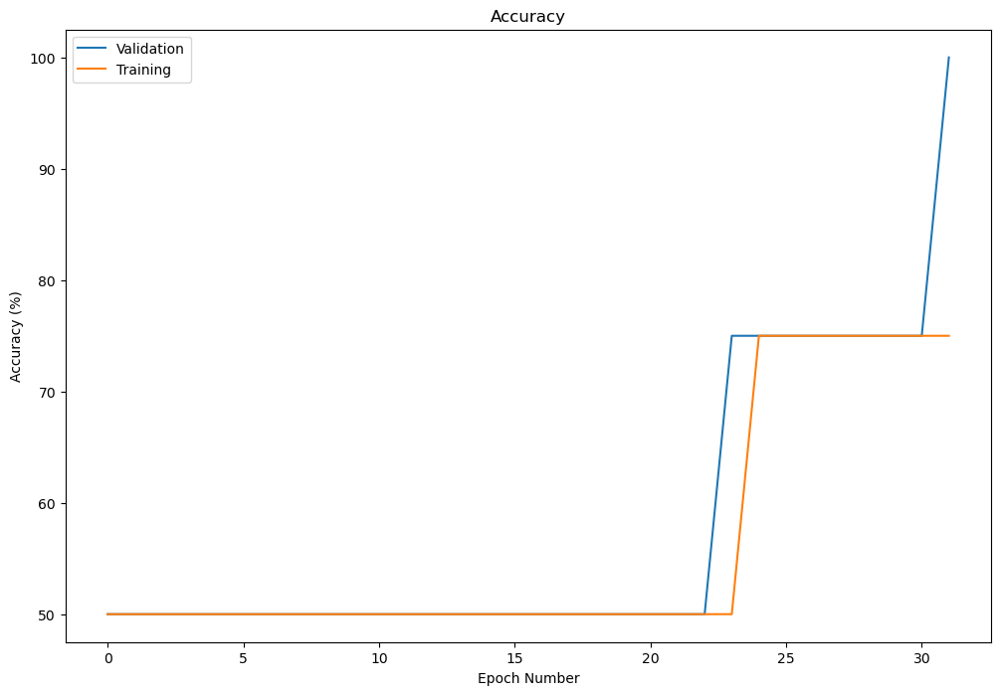

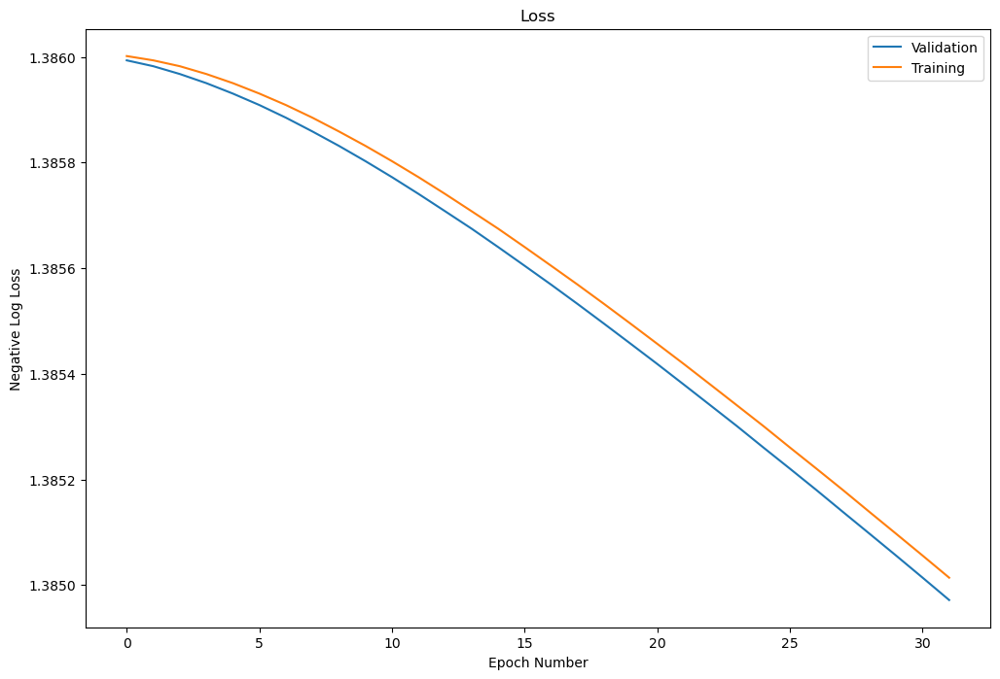


Peak Evaluation Accuracy: 100.0000%
Total Training Time: 0.9706s

Training and testing "debug-model/debug-dataset/0/1"...
The size of an example dataset entry size is torch.Size([1, 224, 224])
Weight initialisation complete.


Epoch: 1
	  > Mini-batch #0: 	Loss = 1.3860 	Accuracy = 16 / 64 (25.000%)

	[Train] Time: 0.0	| Average Loss: 1.3860	| Accuracy: 16/64 (25.000%)
	[Test]  Time: 0.00	| Average Loss: 1.3860	| Accuracy: 16/64 (25.000%)

Epoch: 2
	  > Mini-batch #0: 	Loss = 1.3860 	Accuracy = 16 / 64 (25.000%)

	[Train] Time: 0.0	| Average Loss: 1.3860	| Accuracy: 16/64 (25.000%)
	[Test]  Time: 0.00	| Average Loss: 1.3860	| Accuracy: 16/64 (25.000%)

Epoch: 3
	  > Mini-batch #0: 	Loss = 1.3860 	Accuracy = 16 / 64 (25.000%)

	[Train] Time: 0.0	| Average Loss: 1.3860	| Accuracy: 16/64 (25.000%)
	[Test]  Time: 0.00	| Average Loss: 1.3860	| Accuracy: 16/64 (25.000%)

Epoch: 4
	  > Mini-batch #0: 	Loss = 1.3860 	Accuracy = 16 / 64 (25.000%)

	[Train] Time: 0.0	| Average Loss: 1.3860	| Ac

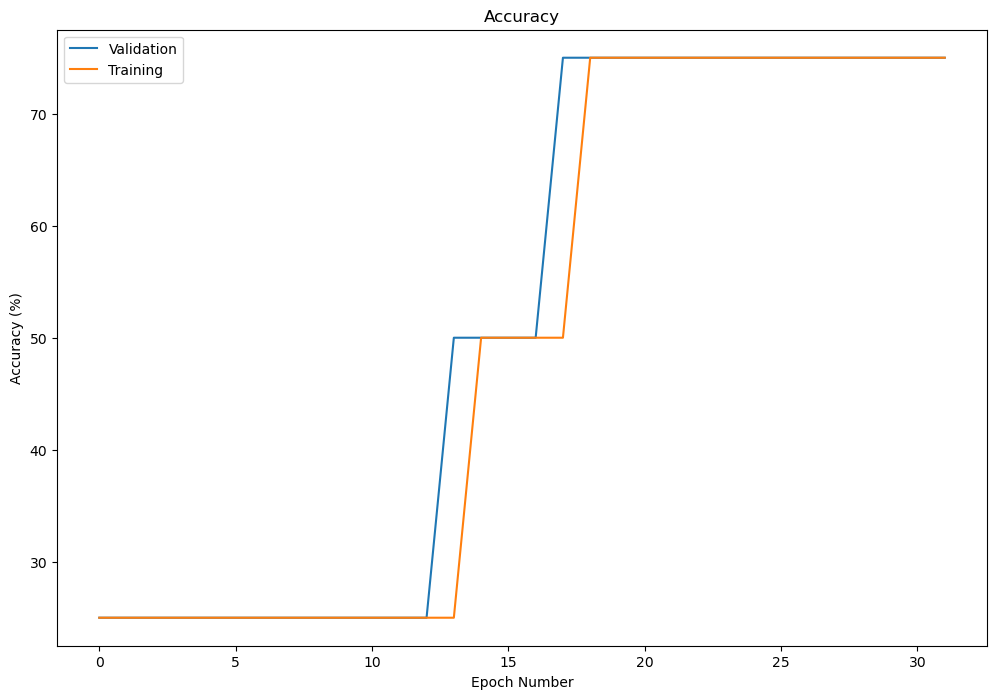

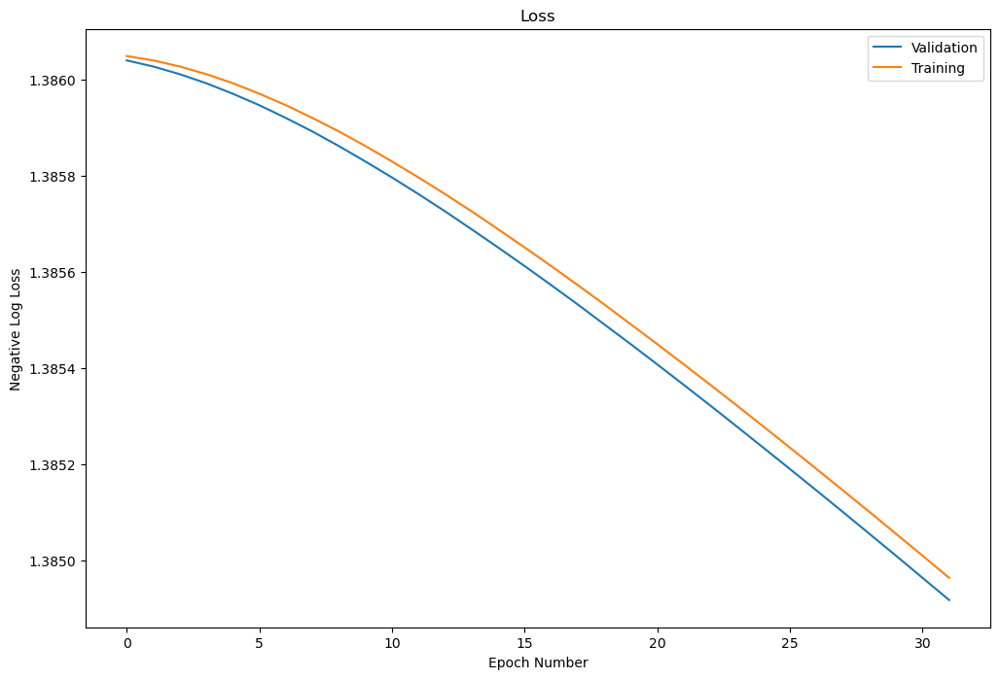


Peak Evaluation Accuracy: 75.0000%
Total Training Time: 0.6305s

Training and testing "debug-model/debug-dataset/0/1/2"...
The size of an example dataset entry size is torch.Size([1, 224, 224])
Weight initialisation complete.


Epoch: 1
	  > Mini-batch #0: 	Loss = 1.3856 	Accuracy = 32 / 64 (50.000%)

	[Train] Time: 0.0	| Average Loss: 1.3856	| Accuracy: 32/64 (50.000%)
	[Test]  Time: 0.00	| Average Loss: 1.3856	| Accuracy: 32/64 (50.000%)

Epoch: 2
	  > Mini-batch #0: 	Loss = 1.3856 	Accuracy = 32 / 64 (50.000%)

	[Train] Time: 0.0	| Average Loss: 1.3856	| Accuracy: 32/64 (50.000%)
	[Test]  Time: 0.00	| Average Loss: 1.3856	| Accuracy: 32/64 (50.000%)

Epoch: 3
	  > Mini-batch #0: 	Loss = 1.3856 	Accuracy = 32 / 64 (50.000%)

	[Train] Time: 0.0	| Average Loss: 1.3856	| Accuracy: 32/64 (50.000%)
	[Test]  Time: 0.00	| Average Loss: 1.3856	| Accuracy: 32/64 (50.000%)

Epoch: 4
	  > Mini-batch #0: 	Loss = 1.3856 	Accuracy = 32 / 64 (50.000%)

	[Train] Time: 0.0	| Average Loss: 1.3856	| A

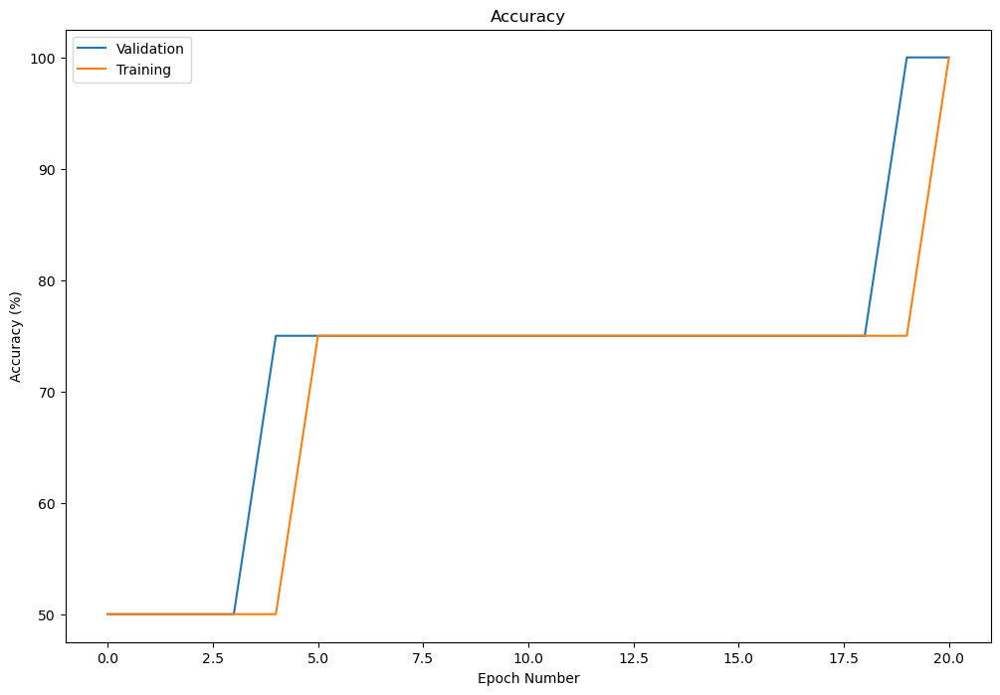

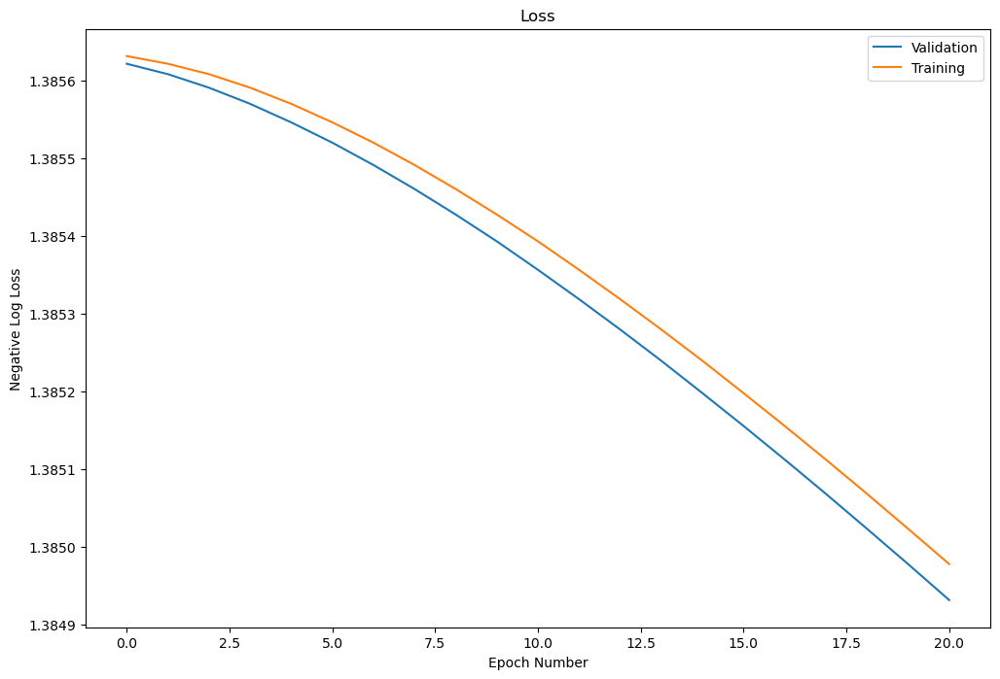


Peak Evaluation Accuracy: 100.0000%
Total Training Time: 0.6011s

Training and testing "debug-model/debug-dataset/0/1/2/3"...
The size of an example dataset entry size is torch.Size([1, 224, 224])
Weight initialisation complete.


Epoch: 1
	  > Mini-batch #0: 	Loss = 1.3864 	Accuracy = 16 / 64 (25.000%)

	[Train] Time: 0.0	| Average Loss: 1.3864	| Accuracy: 16/64 (25.000%)
	[Test]  Time: 0.01	| Average Loss: 1.3863	| Accuracy: 16/64 (25.000%)

Epoch: 2
	  > Mini-batch #0: 	Loss = 1.3863 	Accuracy = 16 / 64 (25.000%)

	[Train] Time: 0.0	| Average Loss: 1.3863	| Accuracy: 16/64 (25.000%)
	[Test]  Time: 0.00	| Average Loss: 1.3863	| Accuracy: 16/64 (25.000%)

Epoch: 3
	  > Mini-batch #0: 	Loss = 1.3863 	Accuracy = 16 / 64 (25.000%)

	[Train] Time: 0.0	| Average Loss: 1.3863	| Accuracy: 16/64 (25.000%)
	[Test]  Time: 0.00	| Average Loss: 1.3863	| Accuracy: 16/64 (25.000%)

Epoch: 4
	  > Mini-batch #0: 	Loss = 1.3863 	Accuracy = 16 / 64 (25.000%)

	[Train] Time: 0.0	| Average Loss: 1.3863	

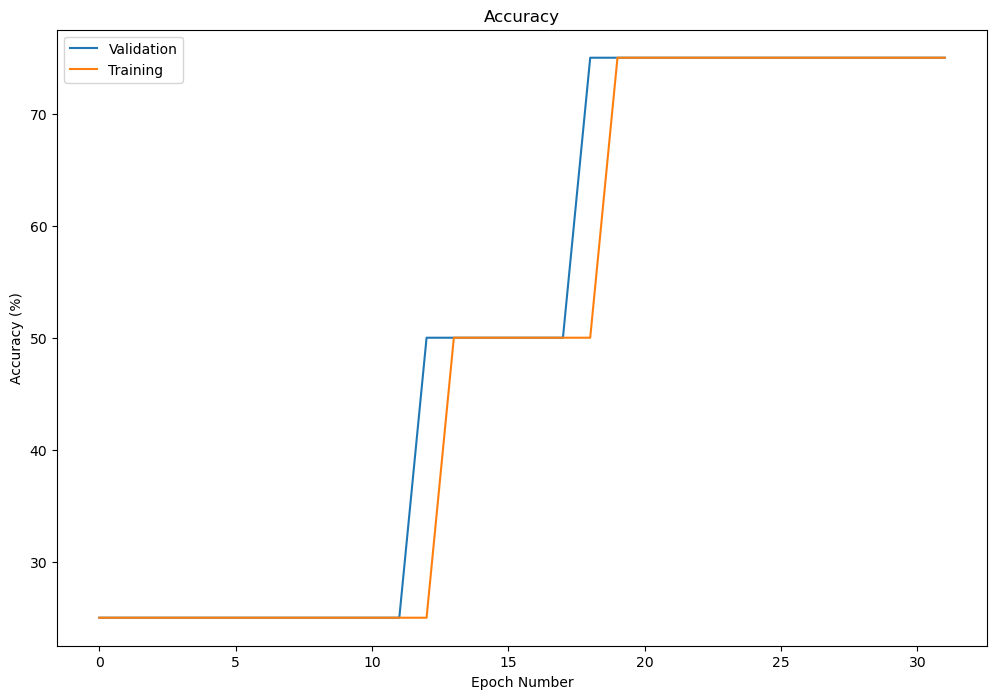

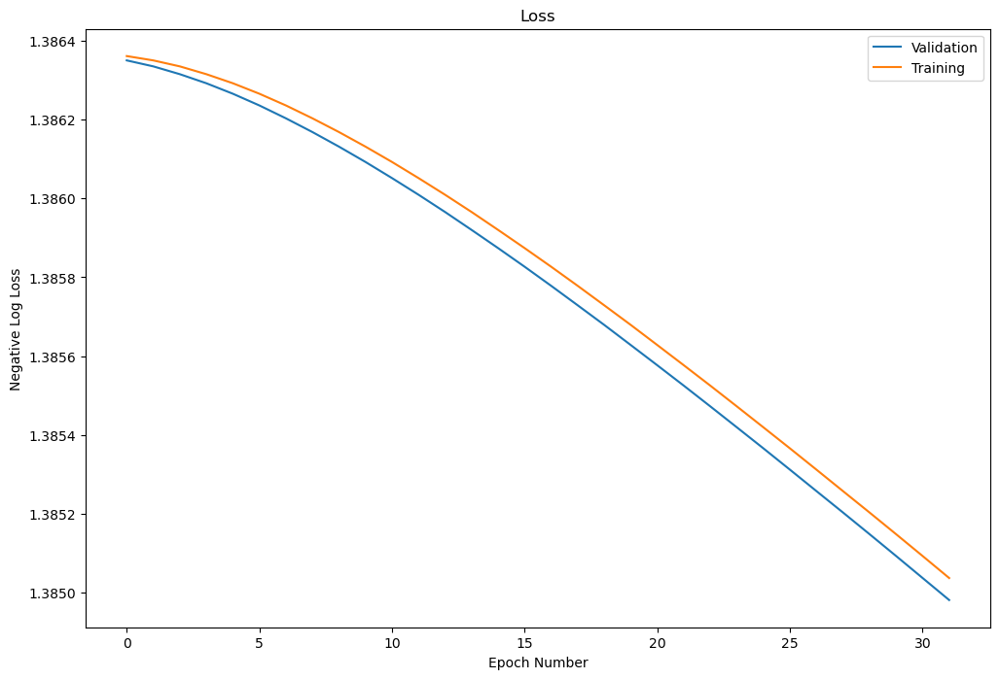


Peak Evaluation Accuracy: 75.0000%
Total Training Time: 0.6440s

Training and testing "debug-model/debug-dataset/0/1/2/3/4"...
The size of an example dataset entry size is torch.Size([1, 224, 224])
Weight initialisation complete.


Epoch: 1
	  > Mini-batch #0: 	Loss = 1.3863 	Accuracy = 16 / 64 (25.000%)

	[Train] Time: 0.0	| Average Loss: 1.3863	| Accuracy: 16/64 (25.000%)
	[Test]  Time: 0.01	| Average Loss: 1.3863	| Accuracy: 16/64 (25.000%)

Epoch: 2
	  > Mini-batch #0: 	Loss = 1.3863 	Accuracy = 16 / 64 (25.000%)

	[Train] Time: 0.0	| Average Loss: 1.3863	| Accuracy: 16/64 (25.000%)
	[Test]  Time: 0.00	| Average Loss: 1.3863	| Accuracy: 16/64 (25.000%)

Epoch: 3
	  > Mini-batch #0: 	Loss = 1.3863 	Accuracy = 16 / 64 (25.000%)

	[Train] Time: 0.0	| Average Loss: 1.3863	| Accuracy: 16/64 (25.000%)
	[Test]  Time: 0.01	| Average Loss: 1.3863	| Accuracy: 16/64 (25.000%)

Epoch: 4
	  > Mini-batch #0: 	Loss = 1.3863 	Accuracy = 16 / 64 (25.000%)

	[Train] Time: 0.0	| Average Loss: 1.3863

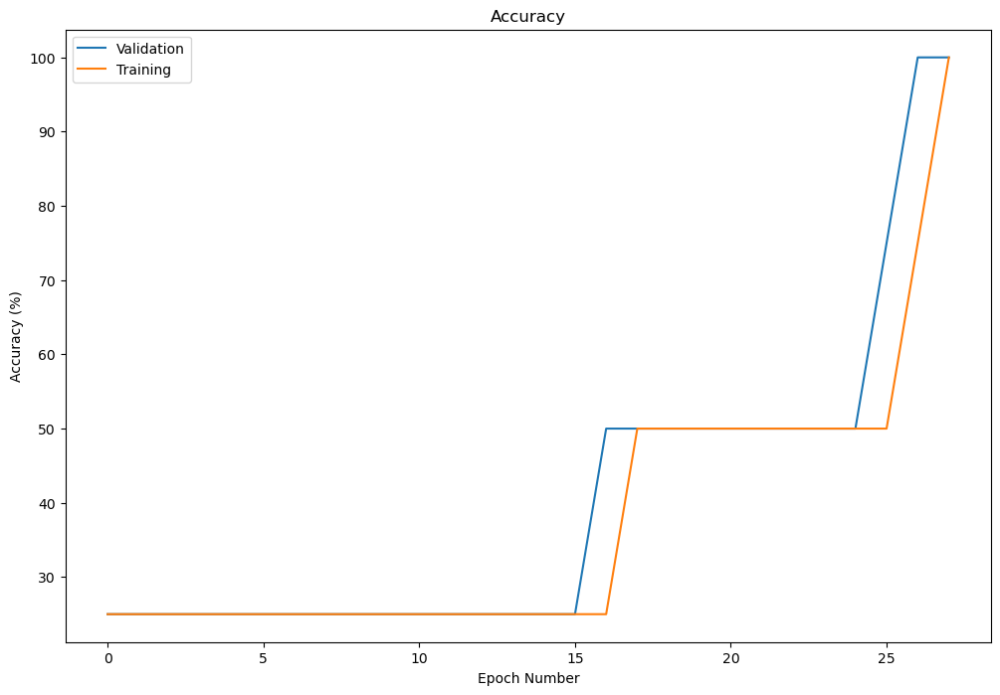

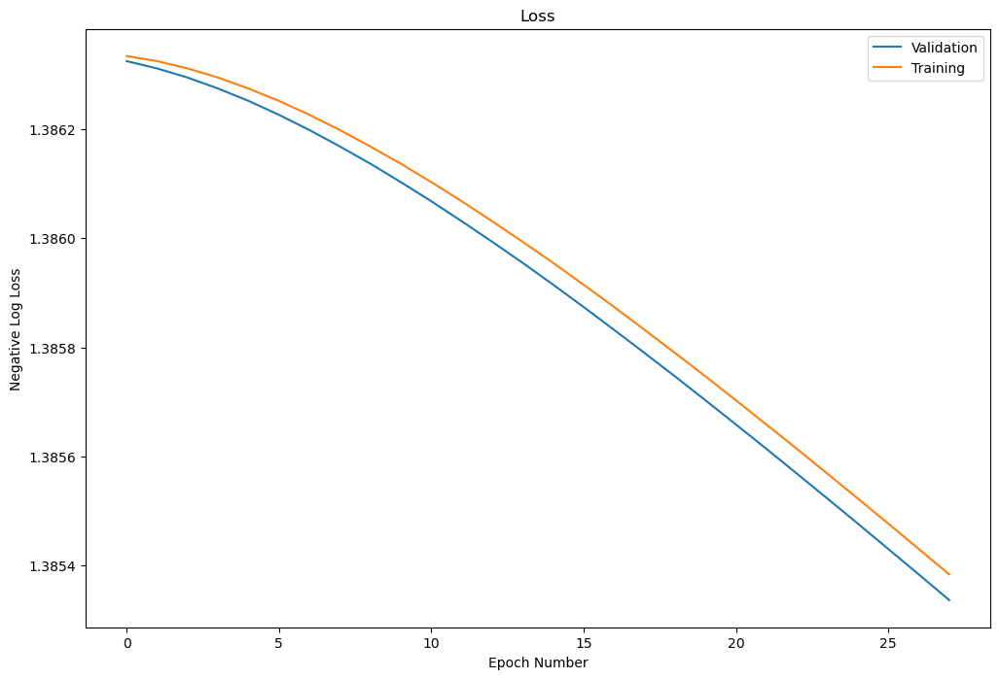


Peak Evaluation Accuracy: 100.0000%
Total Training Time: 0.6542s

Peak Accuracies: [100.  75. 100.  75. 100.]
Mean: 90.0
Std: 12.247449


In [105]:
# Example Only

with temporary_config():
    config.input_shape = (1, 224, 224)
    config.epochs = 32

    dataset = DebugDataset(4)

    model = DebugNet(dataset.get_class_count(), input_shape=config.input_shape)
    model = model.to(config.device)

    input_type: InputType = "simple"

    cross_validate(dataset, model, input_type, "debug-model/debug-dataset")


#### VGG-16 + Full Mel


ESC Dataset: Found cache for fold-0 at '.cache\esc10\mel\full\fold-0': sample count = 80
ESC Dataset: Found cache for fold-1 at '.cache\esc10\mel\full\fold-1': sample count = 80
ESC Dataset: Found cache for fold-2 at '.cache\esc10\mel\full\fold-2': sample count = 80
ESC Dataset: Found cache for fold-3 at '.cache\esc10\mel\full\fold-3': sample count = 80
ESC Dataset: Found cache for fold-4 at '.cache\esc10\mel\full\fold-4': sample count = 80
Training and testing "vgg-16/full-mel/0"...
The size of an example dataset entry size is torch.Size([1, 224, 224])
Weight initialisation complete.


Epoch: 1
	  > Mini-batch #0: 	Loss = 2.9486 	Accuracy = 1 / 32 (3.125%)
	  > Mini-batch #4: 	Loss = 2.7872 	Accuracy = 2 / 32 (6.250%)
	  > Mini-batch #8: 	Loss = 2.1594 	Accuracy = 6 / 32 (18.750%)

	[Train] Time: 12.9	| Average Loss: 2.7213	| Accuracy: 33/320 (10.312%)
	[Test]  Time: 0.77	| Average Loss: 2.0529	| Accuracy: 28/80 (35.000%)

Epoch: 2
	  > Mini-batch #0: 	Loss = 1.9168 	Accuracy = 9 / 32

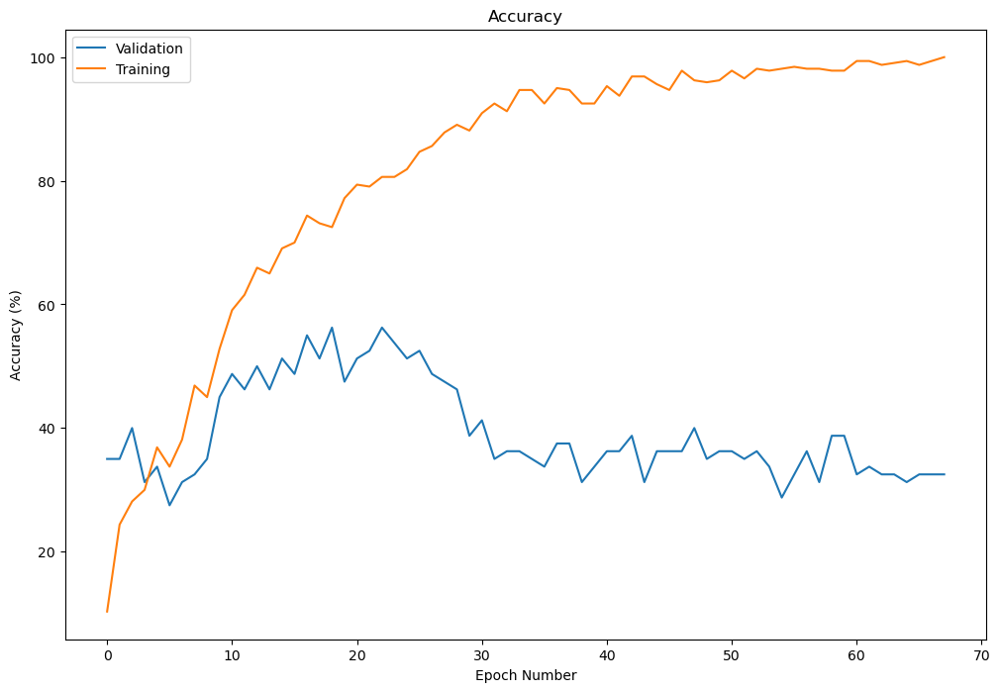

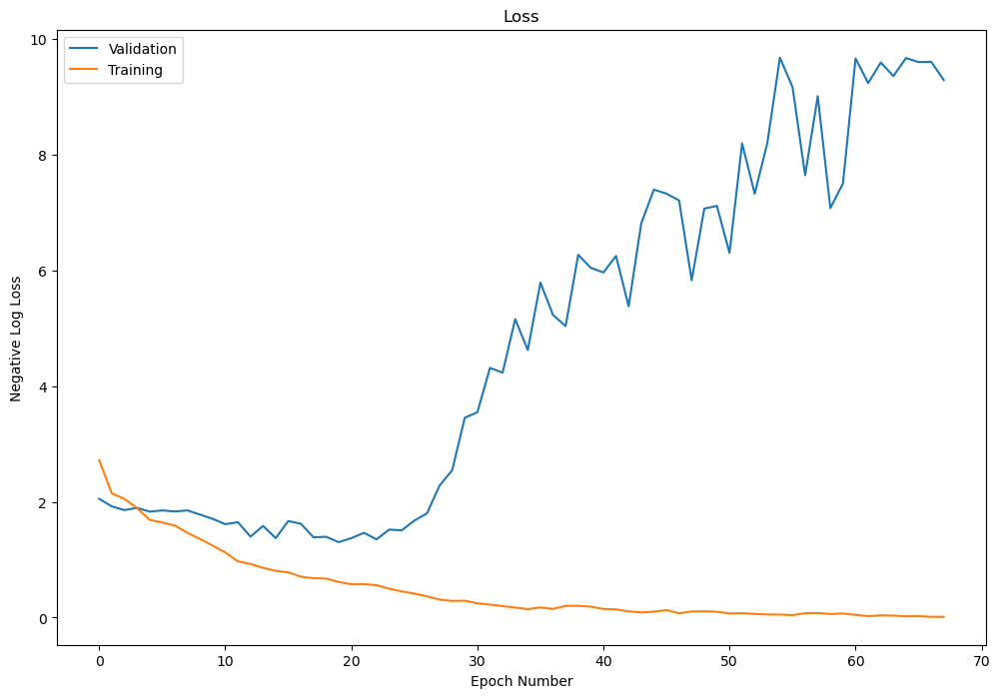


Peak Evaluation Accuracy: 56.2500%
Total Training Time: 489.8138s

Training and testing "vgg-16/full-mel/0/1"...
The size of an example dataset entry size is torch.Size([1, 224, 224])
Weight initialisation complete.


Epoch: 1
	  > Mini-batch #0: 	Loss = 2.4633 	Accuracy = 2 / 32 (6.250%)
	  > Mini-batch #4: 	Loss = 2.1401 	Accuracy = 5 / 32 (15.625%)
	  > Mini-batch #8: 	Loss = 2.2366 	Accuracy = 9 / 32 (28.125%)

	[Train] Time: 6.6	| Average Loss: 2.4755	| Accuracy: 38/320 (11.875%)
	[Test]  Time: 0.66	| Average Loss: 2.1281	| Accuracy: 11/80 (13.750%)

Epoch: 2
	  > Mini-batch #0: 	Loss = 2.4583 	Accuracy = 5 / 32 (15.625%)
	  > Mini-batch #4: 	Loss = 2.0874 	Accuracy = 6 / 32 (18.750%)
	  > Mini-batch #8: 	Loss = 1.8742 	Accuracy = 10 / 32 (31.250%)

	[Train] Time: 6.4	| Average Loss: 2.1248	| Accuracy: 73/320 (22.812%)
	[Test]  Time: 0.68	| Average Loss: 1.9541	| Accuracy: 24/80 (30.000%)

Epoch: 3
	  > Mini-batch #0: 	Loss = 2.3455 	Accuracy = 11 / 32 (34.375%)
	  > Mini-batch #

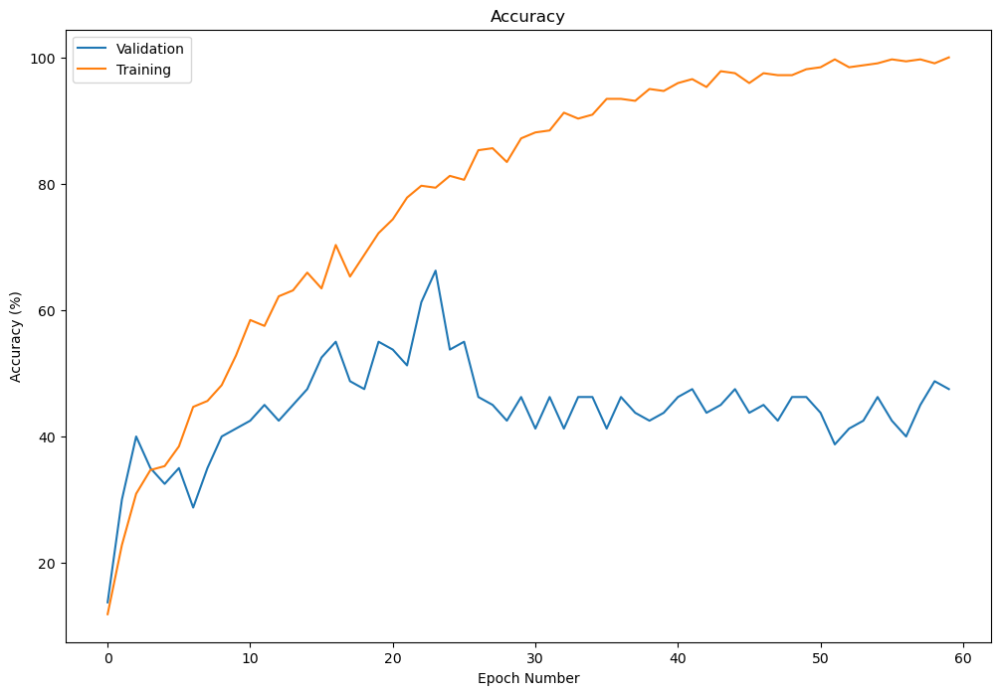

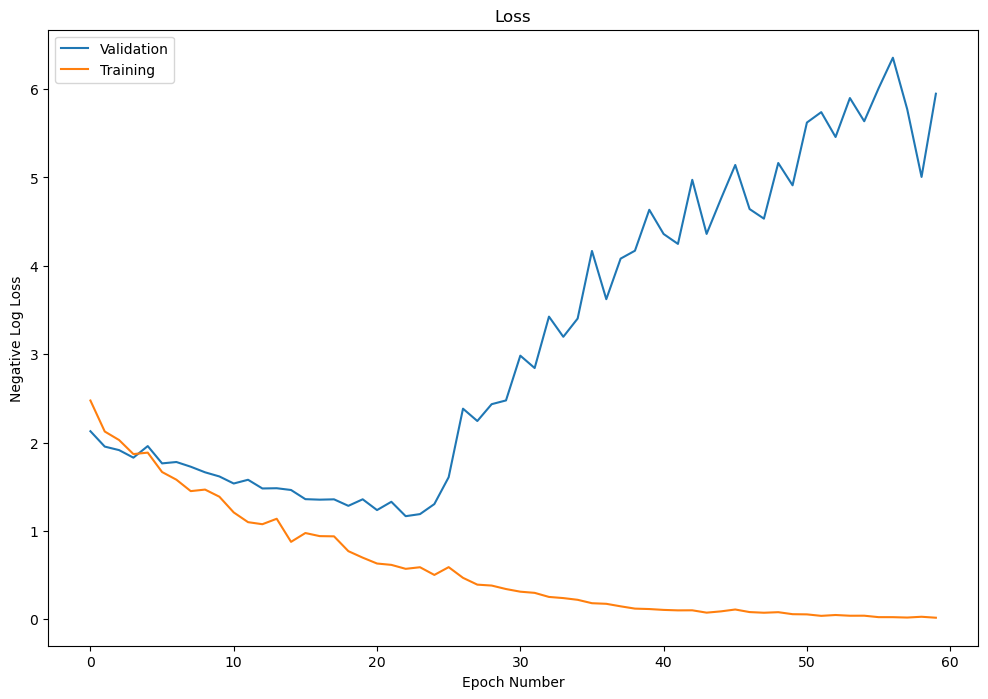


Peak Evaluation Accuracy: 66.2500%
Total Training Time: 428.6161s

Training and testing "vgg-16/full-mel/0/1/2"...
The size of an example dataset entry size is torch.Size([1, 224, 224])
Weight initialisation complete.


Epoch: 1
	  > Mini-batch #0: 	Loss = 2.6117 	Accuracy = 3 / 32 (9.375%)
	  > Mini-batch #4: 	Loss = 3.0744 	Accuracy = 3 / 32 (9.375%)
	  > Mini-batch #8: 	Loss = 2.4840 	Accuracy = 10 / 32 (31.250%)

	[Train] Time: 6.5	| Average Loss: 2.7747	| Accuracy: 35/320 (10.938%)
	[Test]  Time: 0.65	| Average Loss: 2.1670	| Accuracy: 16/80 (20.000%)

Epoch: 2
	  > Mini-batch #0: 	Loss = 2.0348 	Accuracy = 16 / 32 (50.000%)
	  > Mini-batch #4: 	Loss = 2.2437 	Accuracy = 8 / 32 (25.000%)
	  > Mini-batch #8: 	Loss = 1.8494 	Accuracy = 13 / 32 (40.625%)

	[Train] Time: 6.4	| Average Loss: 2.0304	| Accuracy: 86/320 (26.875%)
	[Test]  Time: 0.66	| Average Loss: 2.2141	| Accuracy: 24/80 (30.000%)

Epoch: 3
	  > Mini-batch #0: 	Loss = 1.9760 	Accuracy = 15 / 32 (46.875%)
	  > Mini-batc

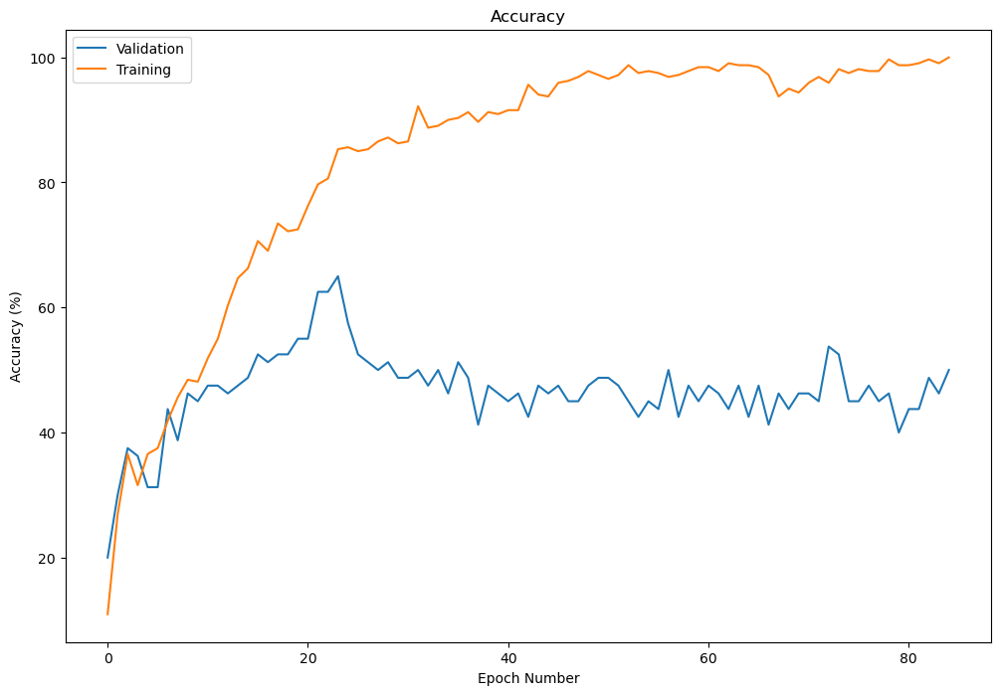

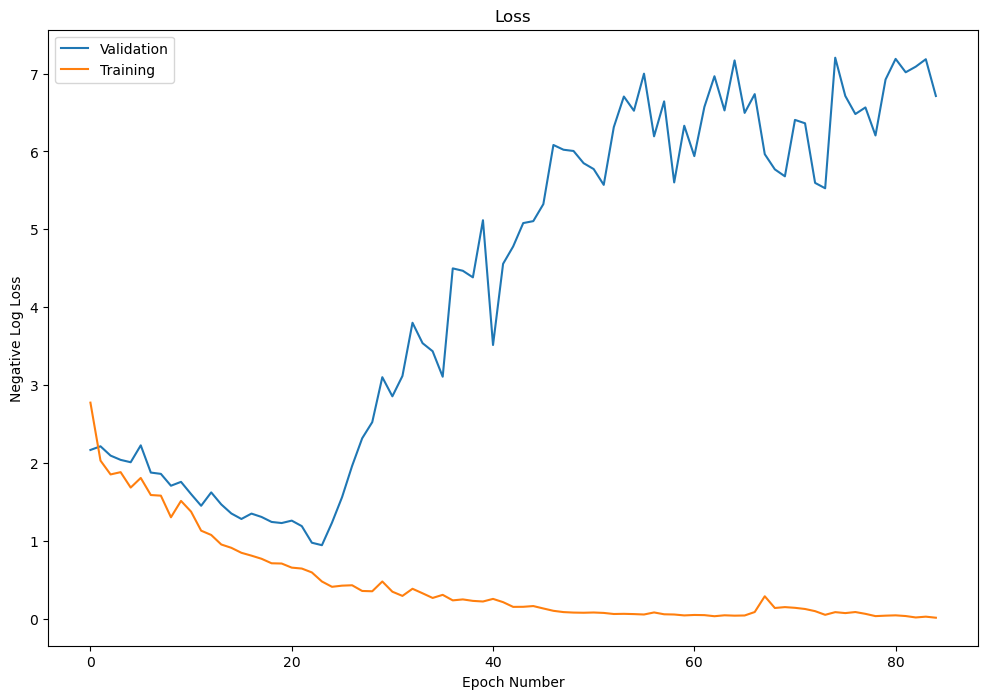


Peak Evaluation Accuracy: 65.0000%
Total Training Time: 597.0473s

Training and testing "vgg-16/full-mel/0/1/2/3"...
The size of an example dataset entry size is torch.Size([1, 224, 224])
Weight initialisation complete.


Epoch: 1
	  > Mini-batch #0: 	Loss = 2.4380 	Accuracy = 4 / 32 (12.500%)
	  > Mini-batch #4: 	Loss = 3.4343 	Accuracy = 1 / 32 (3.125%)
	  > Mini-batch #8: 	Loss = 1.9325 	Accuracy = 8 / 32 (25.000%)

	[Train] Time: 6.2	| Average Loss: 2.5763	| Accuracy: 33/320 (10.312%)
	[Test]  Time: 0.66	| Average Loss: 2.0545	| Accuracy: 11/80 (13.750%)

Epoch: 2
	  > Mini-batch #0: 	Loss = 2.1663 	Accuracy = 5 / 32 (15.625%)
	  > Mini-batch #4: 	Loss = 2.1515 	Accuracy = 3 / 32 (9.375%)
	  > Mini-batch #8: 	Loss = 2.0884 	Accuracy = 8 / 32 (25.000%)

	[Train] Time: 6.0	| Average Loss: 2.0634	| Accuracy: 69/320 (21.562%)
	[Test]  Time: 0.63	| Average Loss: 1.9533	| Accuracy: 24/80 (30.000%)

Epoch: 3
	  > Mini-batch #0: 	Loss = 1.9486 	Accuracy = 14 / 32 (43.750%)
	  > Mini-batch

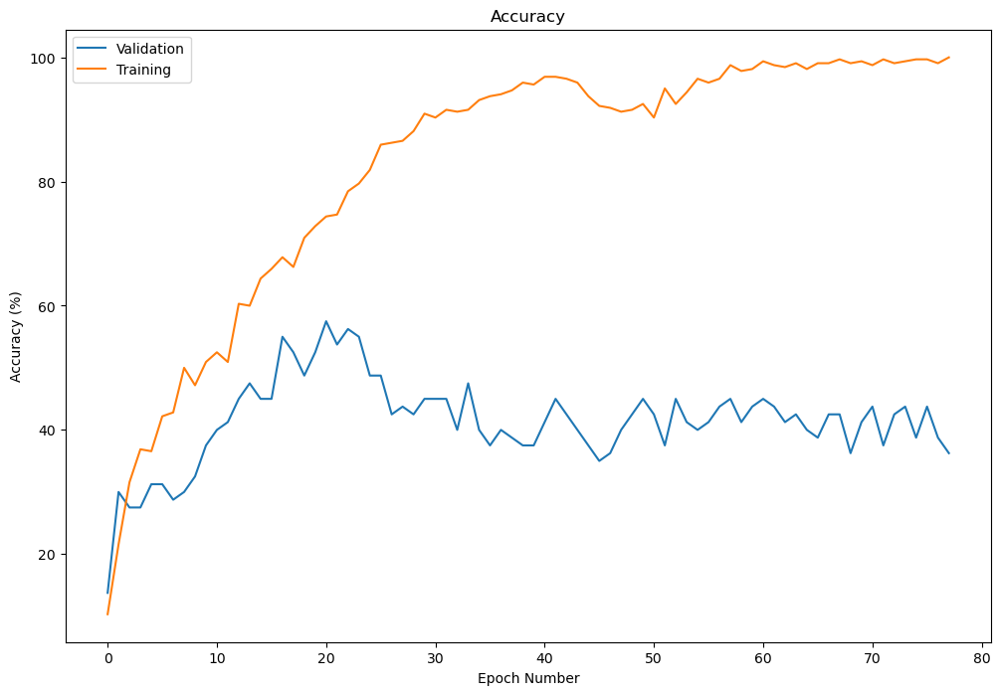

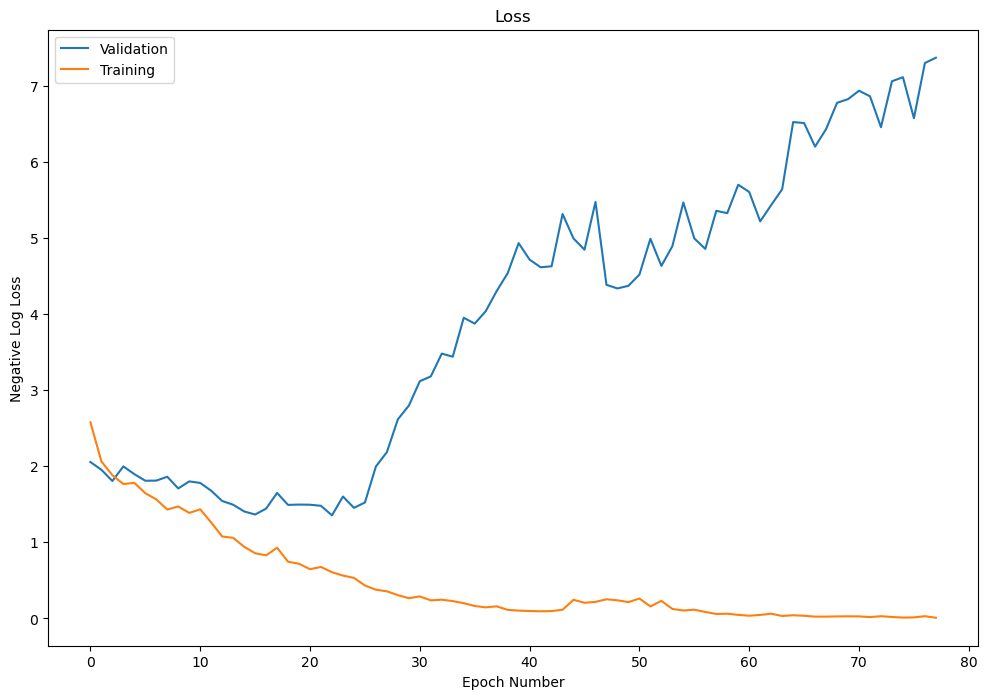


Peak Evaluation Accuracy: 57.5000%
Total Training Time: 551.9357s

Training and testing "vgg-16/full-mel/0/1/2/3/4"...
The size of an example dataset entry size is torch.Size([1, 224, 224])
Weight initialisation complete.


Epoch: 1
	  > Mini-batch #0: 	Loss = 2.2896 	Accuracy = 5 / 32 (15.625%)
	  > Mini-batch #4: 	Loss = 2.8314 	Accuracy = 0 / 32 (0.000%)
	  > Mini-batch #8: 	Loss = 2.0633 	Accuracy = 6 / 32 (18.750%)

	[Train] Time: 6.7	| Average Loss: 2.6499	| Accuracy: 36/320 (11.250%)
	[Test]  Time: 0.67	| Average Loss: 2.0699	| Accuracy: 17/80 (21.250%)

Epoch: 2
	  > Mini-batch #0: 	Loss = 1.7907 	Accuracy = 13 / 32 (40.625%)
	  > Mini-batch #4: 	Loss = 2.3171 	Accuracy = 6 / 32 (18.750%)
	  > Mini-batch #8: 	Loss = 2.0050 	Accuracy = 10 / 32 (31.250%)

	[Train] Time: 6.4	| Average Loss: 2.0576	| Accuracy: 77/320 (24.062%)
	[Test]  Time: 0.69	| Average Loss: 2.2813	| Accuracy: 34/80 (42.500%)

Epoch: 3
	  > Mini-batch #0: 	Loss = 2.0028 	Accuracy = 11 / 32 (34.375%)
	  > Mini-

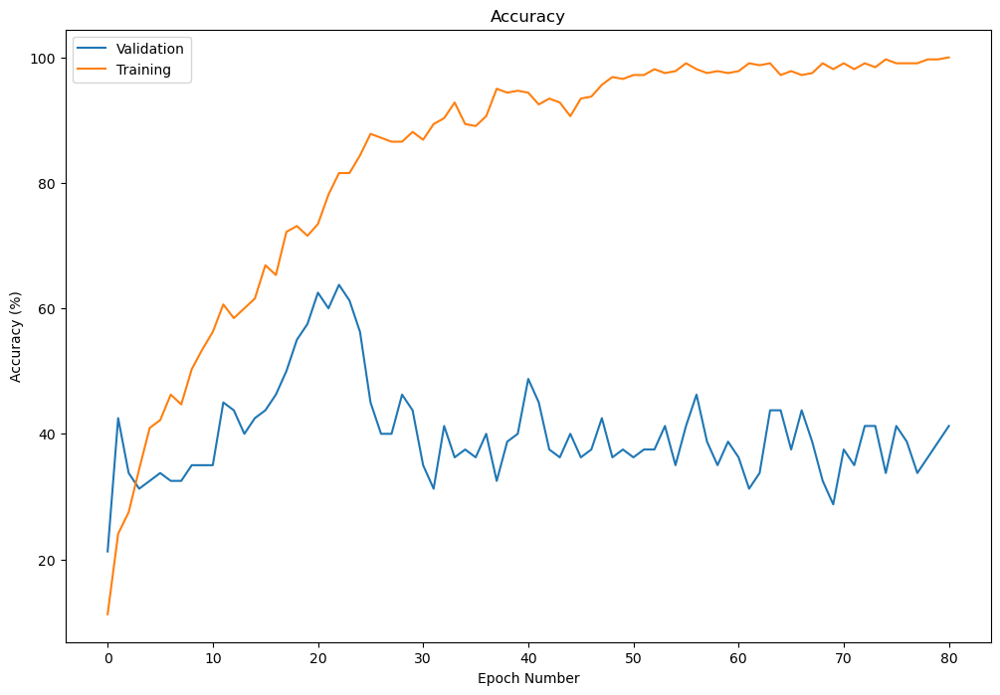

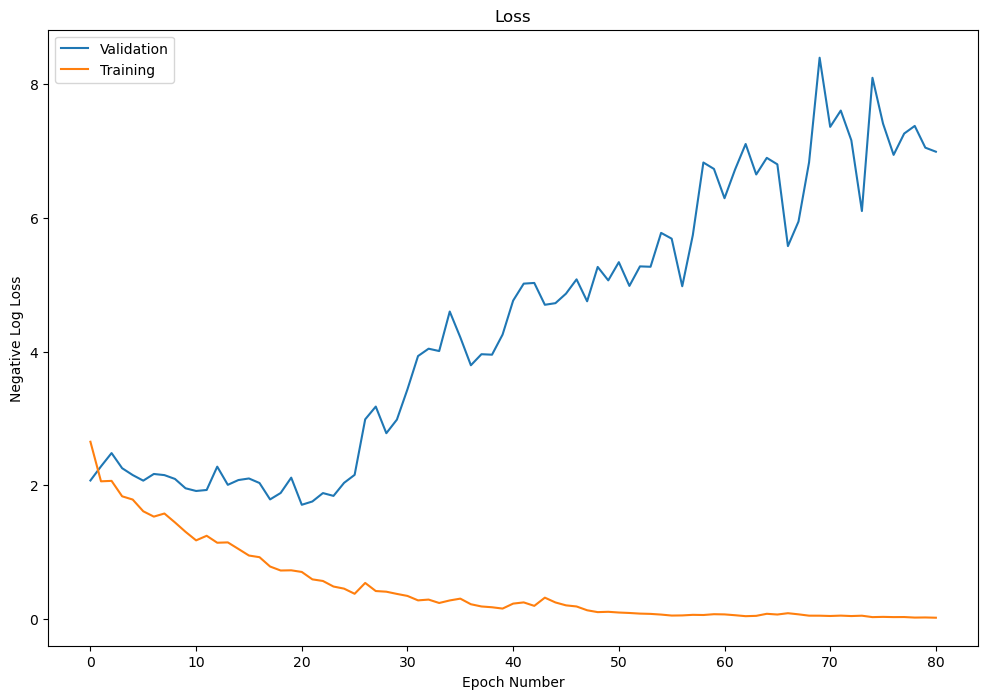


Peak Evaluation Accuracy: 63.7500%
Total Training Time: 564.3077s

Peak Accuracies: [56.25 66.25 65.   57.5  63.75]
Mean: 61.75
Std: 4.077377


In [39]:
with temporary_config():
    config.input_shape = (1, 224, 224) # VGG-16
    config.epochs = 100
    config.batch_size = 32

    dataset = EscFullMelDataset(esc10=True)

    model = VGG16(dataset.get_class_count())
    model = model.to(config.device)

    # input_type: InputType = "ensemble"
    # input_type: InputType = "no-batch"
    input_type: InputType = "simple"

    cross_validate(dataset, model, input_type, "vgg-16/full-mel")

#### Piczak Replication (Short)

ESC Dataset: Found cache for fold-0 at '.cache\esc10\log-mel\seg-short-test\fold-0': sample count = 80
ESC Dataset: Found cache for fold-1 at '.cache\esc10\log-mel\seg-short-test\fold-1': sample count = 80
ESC Dataset: Found cache for fold-2 at '.cache\esc10\log-mel\seg-short-test\fold-2': sample count = 80
ESC Dataset: Found cache for fold-3 at '.cache\esc10\log-mel\seg-short-test\fold-3': sample count = 80
ESC Dataset: Found cache for fold-4 at '.cache\esc10\log-mel\seg-short-test\fold-4': sample count = 80
ESC Dataset: Found cache for fold-0 at '.cache\esc10\log-mel\seg-short\fold-0': sample count = 628
ESC Dataset: Found cache for fold-1 at '.cache\esc10\log-mel\seg-short\fold-1': sample count = 649
ESC Dataset: Found cache for fold-2 at '.cache\esc10\log-mel\seg-short\fold-2': sample count = 647
ESC Dataset: Found cache for fold-3 at '.cache\esc10\log-mel\seg-short\fold-3': sample count = 641
ESC Dataset: Found cache for fold-4 at '.cache\esc10\log-mel\seg-short\fold-4': sample co

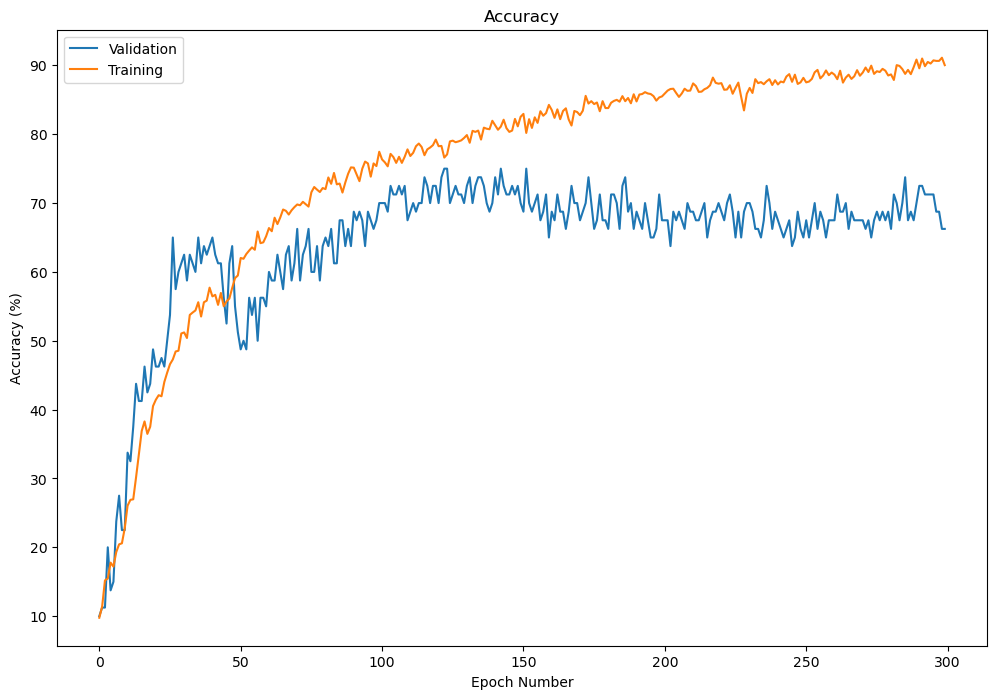

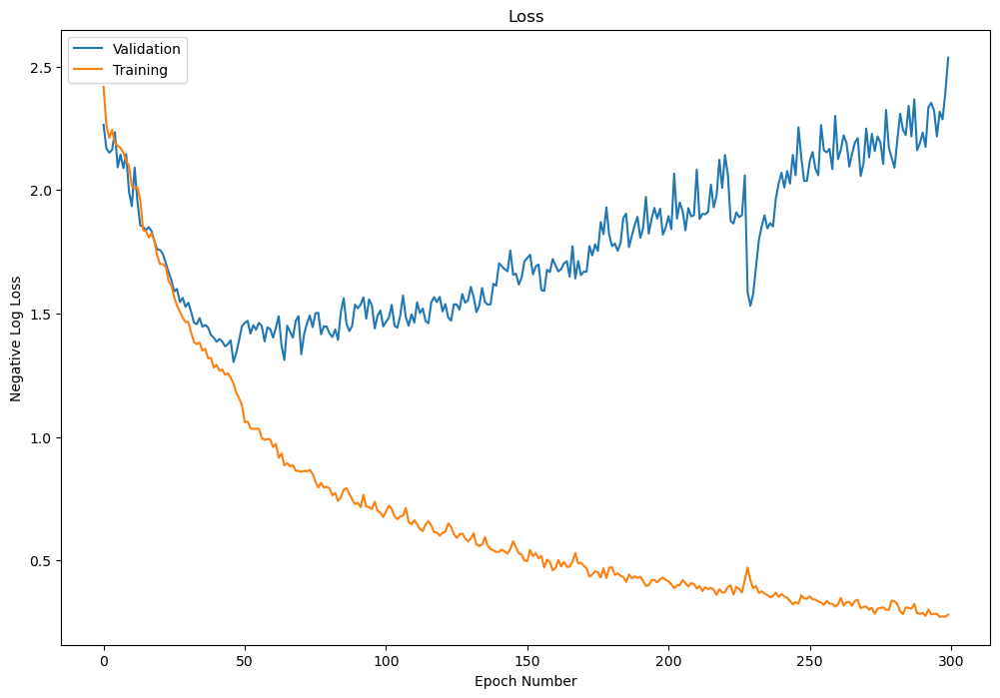


Peak Evaluation Accuracy: 75.0000%
Total Training Time: 5771.4162s

Training and testing "piczak/log-mel/short/0/1"...
The size of an example dataset entry size is torch.Size([9, 2, 60, 41])
Weight initialisation complete.


Epoch: 1
	  > Mini-batch #0: 	Loss = 2.4907 	Accuracy = 11 / 200 (5.500%)
	  > Mini-batch #4: 	Loss = 2.2654 	Accuracy = 31 / 200 (15.500%)
	  > Mini-batch #8: 	Loss = 2.1448 	Accuracy = 36 / 200 (18.000%)
	  > Mini-batch #12: 	Loss = 2.2774 	Accuracy = 17 / 178 (9.551%)

	[Train] Time: 15.1	| Average Loss: 2.3507	| Accuracy: 242/2578 (9.387%)
	[Test]  Time: 4.29	| Average Loss: 2.2305	| Accuracy: 11/80 (13.750%)

Epoch: 2
	  > Mini-batch #0: 	Loss = 2.2596 	Accuracy = 6 / 200 (3.000%)
	  > Mini-batch #4: 	Loss = 2.1339 	Accuracy = 39 / 200 (19.500%)
	  > Mini-batch #8: 	Loss = 2.0362 	Accuracy = 42 / 200 (21.000%)
	  > Mini-batch #12: 	Loss = 2.2923 	Accuracy = 21 / 178 (11.798%)

	[Train] Time: 15.0	| Average Loss: 2.2184	| Accuracy: 304/2578 (11.792%)
	[Test]  

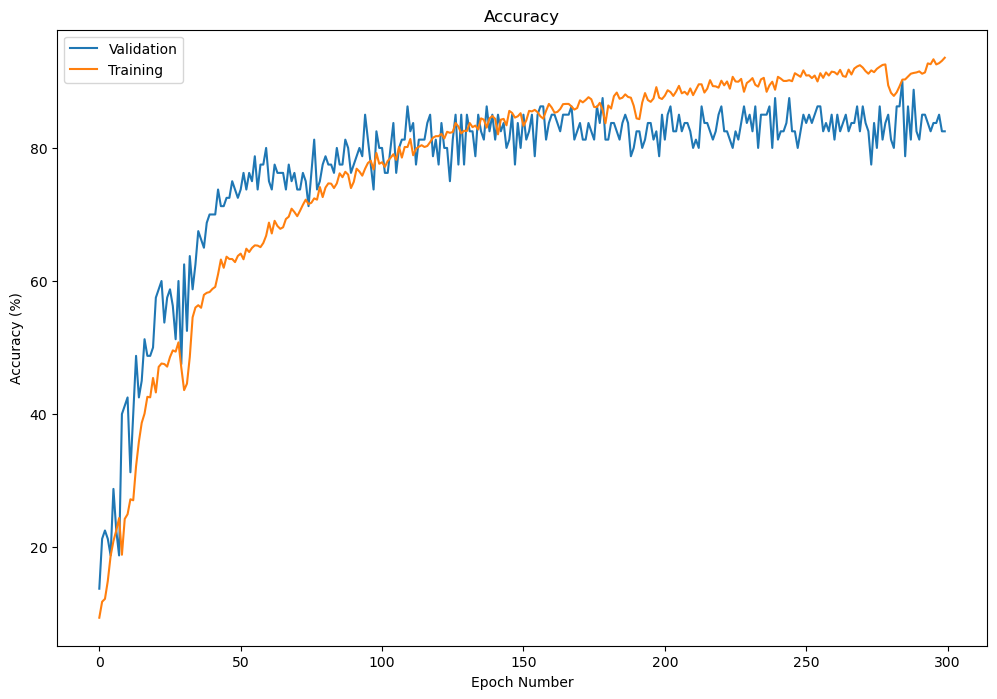

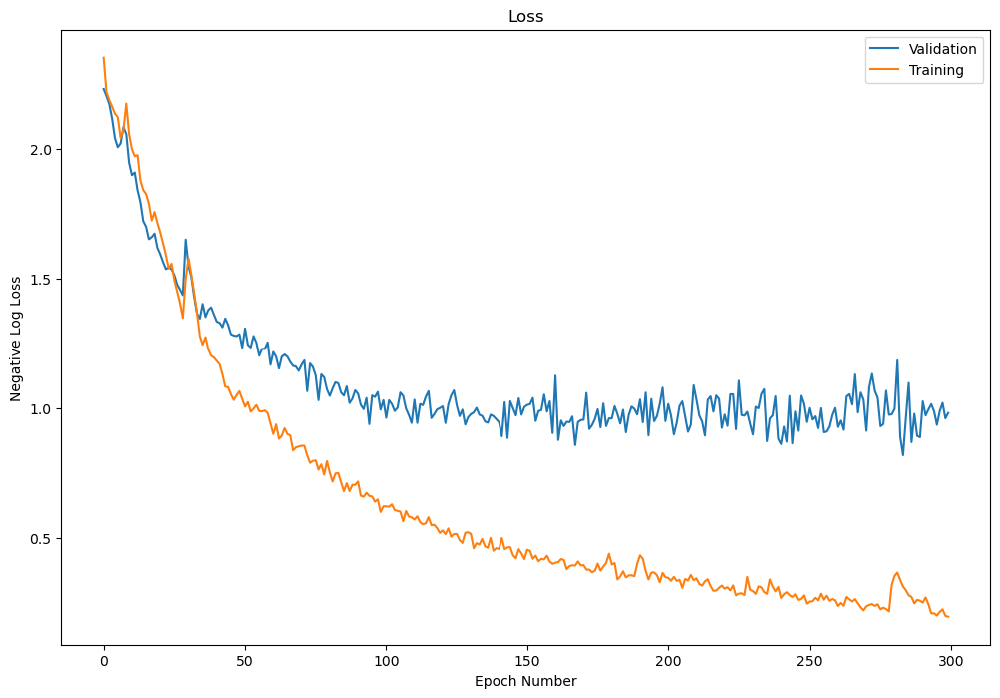


Peak Evaluation Accuracy: 90.0000%
Total Training Time: 5759.8764s

Training and testing "piczak/log-mel/short/0/1/2"...
The size of an example dataset entry size is torch.Size([9, 2, 60, 41])
Weight initialisation complete.


Epoch: 1
	  > Mini-batch #0: 	Loss = 2.4629 	Accuracy = 19 / 200 (9.500%)
	  > Mini-batch #4: 	Loss = 2.2543 	Accuracy = 18 / 200 (9.000%)
	  > Mini-batch #8: 	Loss = 2.2486 	Accuracy = 37 / 200 (18.500%)
	  > Mini-batch #12: 	Loss = 2.3095 	Accuracy = 14 / 180 (7.778%)

	[Train] Time: 15.1	| Average Loss: 2.3624	| Accuracy: 219/2580 (8.488%)
	[Test]  Time: 4.27	| Average Loss: 2.2438	| Accuracy: 8/80 (10.000%)

Epoch: 2
	  > Mini-batch #0: 	Loss = 2.2965 	Accuracy = 4 / 200 (2.000%)
	  > Mini-batch #4: 	Loss = 2.1709 	Accuracy = 27 / 200 (13.500%)
	  > Mini-batch #8: 	Loss = 2.1466 	Accuracy = 46 / 200 (23.000%)
	  > Mini-batch #12: 	Loss = 2.2656 	Accuracy = 27 / 180 (15.000%)

	[Train] Time: 15.0	| Average Loss: 2.2609	| Accuracy: 291/2580 (11.279%)
	[Test]  

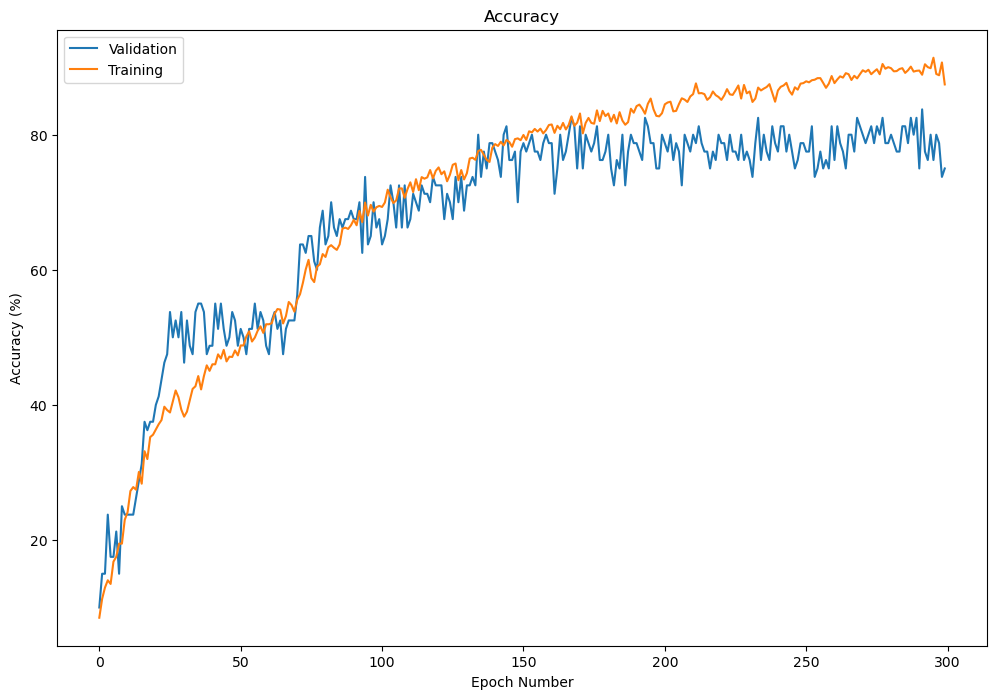

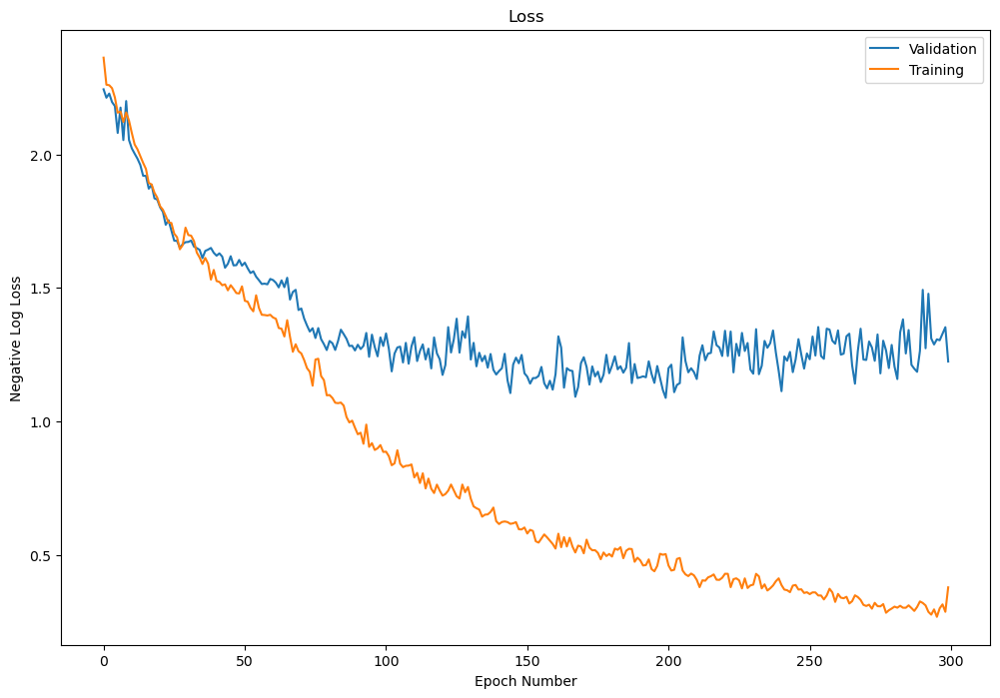


Peak Evaluation Accuracy: 83.7500%
Total Training Time: 5743.4708s

Training and testing "piczak/log-mel/short/0/1/2/3"...
The size of an example dataset entry size is torch.Size([9, 2, 60, 41])
Weight initialisation complete.


Epoch: 1
	  > Mini-batch #0: 	Loss = 2.3455 	Accuracy = 25 / 200 (12.500%)
	  > Mini-batch #4: 	Loss = 2.2649 	Accuracy = 15 / 200 (7.500%)
	  > Mini-batch #8: 	Loss = 2.1794 	Accuracy = 30 / 200 (15.000%)
	  > Mini-batch #12: 	Loss = 2.2864 	Accuracy = 17 / 186 (9.140%)

	[Train] Time: 15.0	| Average Loss: 2.3263	| Accuracy: 224/2586 (8.662%)
	[Test]  Time: 4.23	| Average Loss: 2.2372	| Accuracy: 8/80 (10.000%)

Epoch: 2
	  > Mini-batch #0: 	Loss = 2.2584 	Accuracy = 0 / 200 (0.000%)
	  > Mini-batch #4: 	Loss = 2.1347 	Accuracy = 27 / 200 (13.500%)
	  > Mini-batch #8: 	Loss = 2.1051 	Accuracy = 54 / 200 (27.000%)
	  > Mini-batch #12: 	Loss = 2.2053 	Accuracy = 19 / 186 (10.215%)

	[Train] Time: 14.9	| Average Loss: 2.2213	| Accuracy: 295/2586 (11.408%)
	[Test

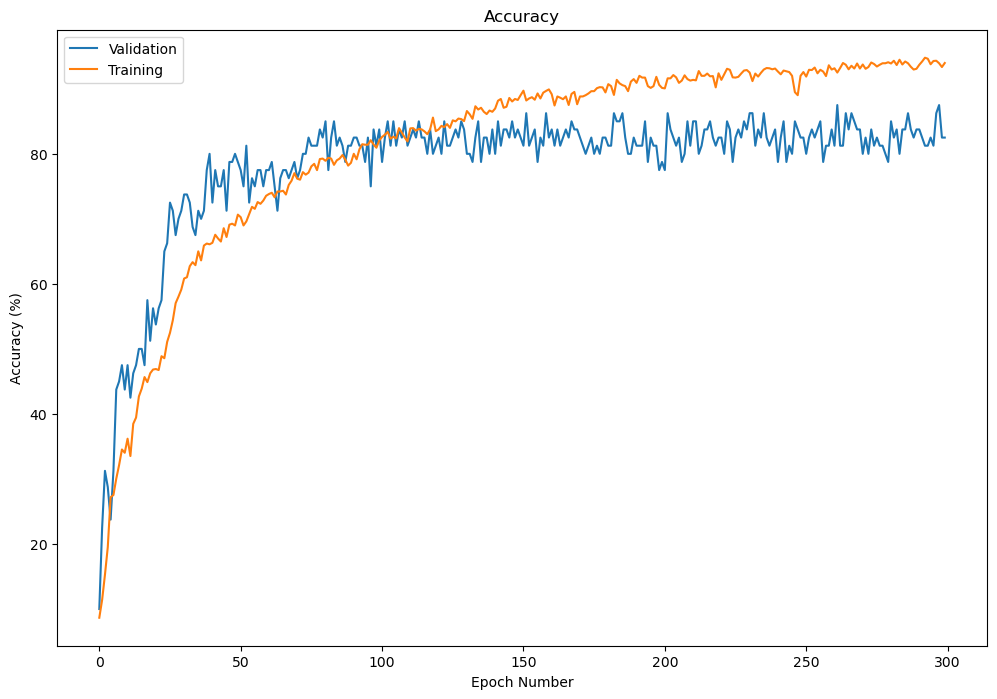

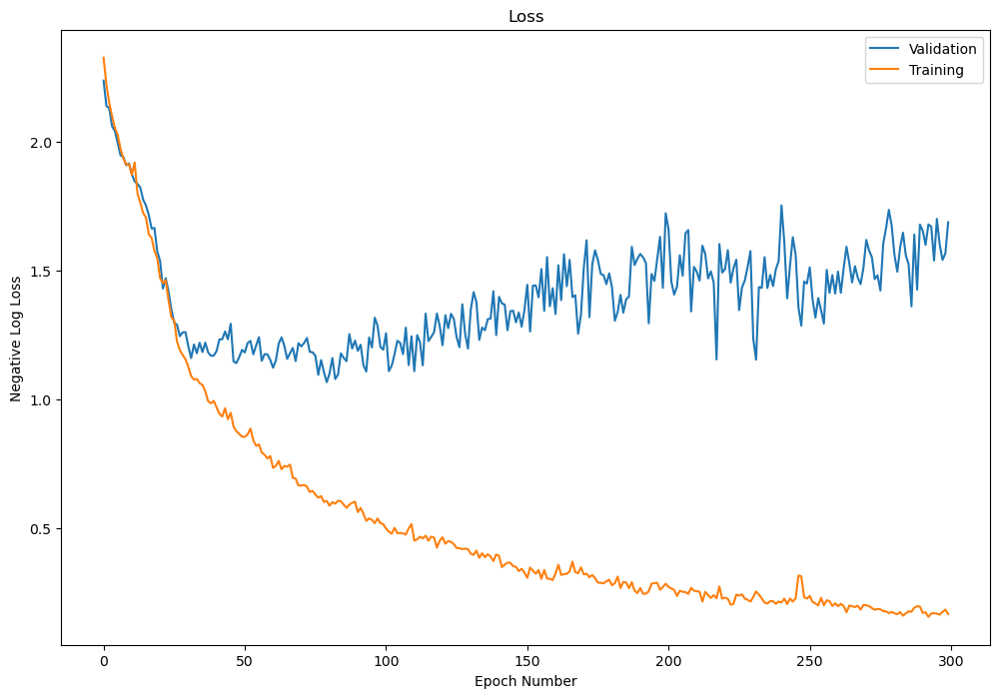


Peak Evaluation Accuracy: 87.5000%
Total Training Time: 5753.1214s

Training and testing "piczak/log-mel/short/0/1/2/3/4"...
The size of an example dataset entry size is torch.Size([9, 2, 60, 41])
Weight initialisation complete.


Epoch: 1
	  > Mini-batch #0: 	Loss = 2.5410 	Accuracy = 12 / 200 (6.000%)
	  > Mini-batch #4: 	Loss = 2.2799 	Accuracy = 22 / 200 (11.000%)
	  > Mini-batch #8: 	Loss = 2.1755 	Accuracy = 36 / 200 (18.000%)
	  > Mini-batch #12: 	Loss = 2.0909 	Accuracy = 35 / 165 (21.212%)

	[Train] Time: 14.9	| Average Loss: 2.3371	| Accuracy: 218/2565 (8.499%)
	[Test]  Time: 4.36	| Average Loss: 2.2537	| Accuracy: 8/80 (10.000%)

Epoch: 2
	  > Mini-batch #0: 	Loss = 2.5000 	Accuracy = 14 / 200 (7.000%)
	  > Mini-batch #4: 	Loss = 2.1045 	Accuracy = 41 / 200 (20.500%)
	  > Mini-batch #8: 	Loss = 2.2096 	Accuracy = 75 / 200 (37.500%)
	  > Mini-batch #12: 	Loss = 2.1503 	Accuracy = 17 / 165 (10.303%)

	[Train] Time: 15.0	| Average Loss: 2.2571	| Accuracy: 351/2565 (13.684%)
	[

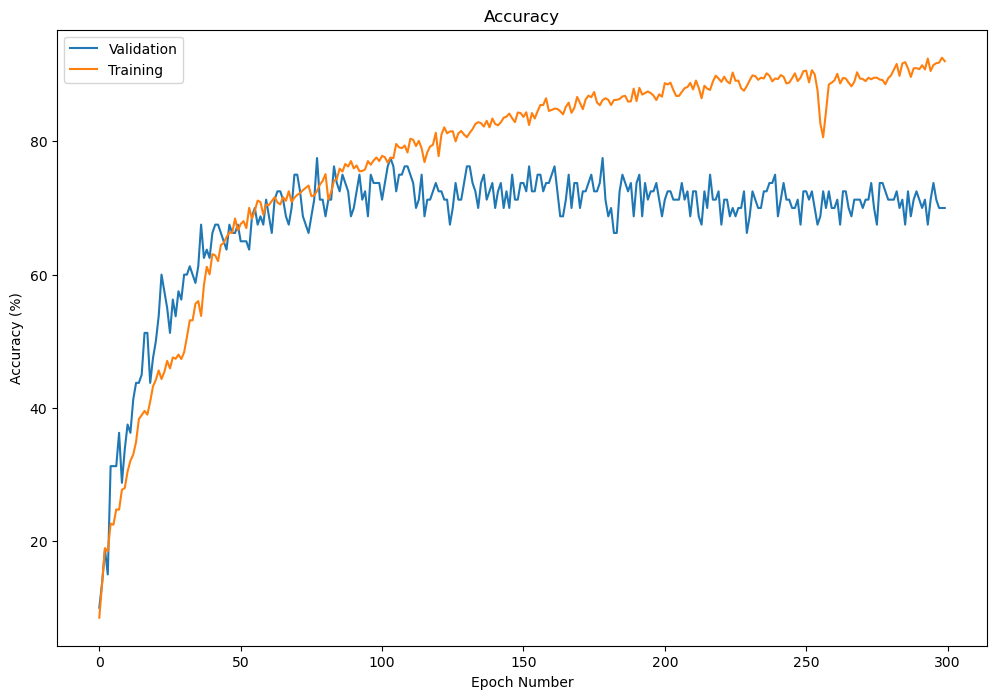

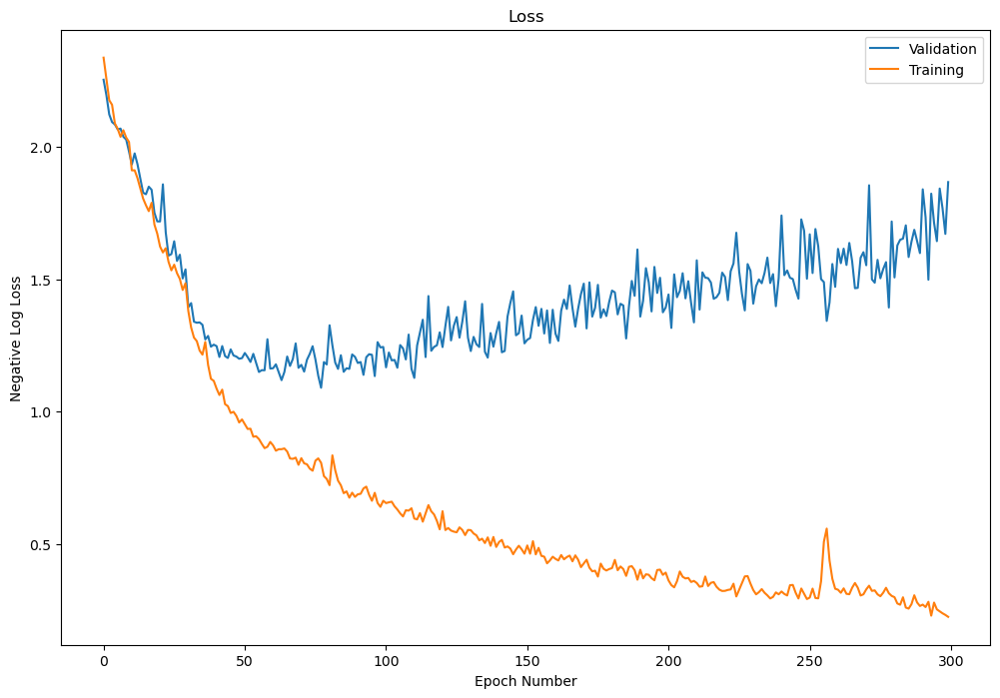


Peak Evaluation Accuracy: 77.5000%
Total Training Time: 5915.0618s

Peak Accuracies: [75.   90.   83.75 87.5  77.5 ]
Mean: 82.75
Std: 5.7227616


In [31]:
with temporary_config():
    config.input_shape = (2, 60, 41)  # Piczak CNN, Short Segments

    dataset = EscLogMelSegmentDataset(esc10=True, long=False, augment_count=0)

    model = PiczakCNNBaseline(dataset.get_class_count(), long=False)
    model = model.to(config.device)

    input_type: InputType = "ensemble"

    cross_validate(dataset, model, input_type, "piczak/log-mel/short")

#### TEO CNN + TEO-GTSC


ESC Dataset: Found cache for fold-0 at '.cache\esc10\teo-gtsc\seg-short-test\fold-0': sample count = 80
ESC Dataset: Found cache for fold-1 at '.cache\esc10\teo-gtsc\seg-short-test\fold-1': sample count = 80
ESC Dataset: Found cache for fold-2 at '.cache\esc10\teo-gtsc\seg-short-test\fold-2': sample count = 80
ESC Dataset: Found cache for fold-3 at '.cache\esc10\teo-gtsc\seg-short-test\fold-3': sample count = 80
ESC Dataset: Found cache for fold-4 at '.cache\esc10\teo-gtsc\seg-short-test\fold-4': sample count = 80
ESC Dataset: Found cache for fold-0 at '.cache\esc10\teo-gtsc\seg-short\fold-0': sample count = 629
ESC Dataset: Found cache for fold-1 at '.cache\esc10\teo-gtsc\seg-short\fold-1': sample count = 641
ESC Dataset: Found cache for fold-2 at '.cache\esc10\teo-gtsc\seg-short\fold-2': sample count = 648
ESC Dataset: Found cache for fold-3 at '.cache\esc10\teo-gtsc\seg-short\fold-3': sample count = 636
ESC Dataset: Found cache for fold-4 at '.cache\esc10\teo-gtsc\seg-short\fold-4':

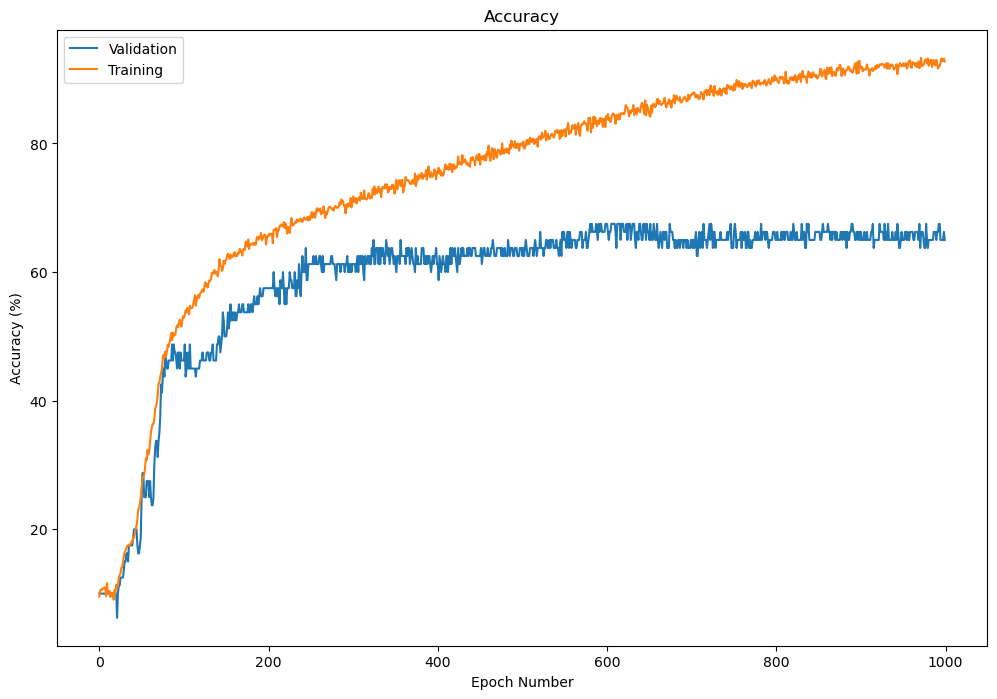

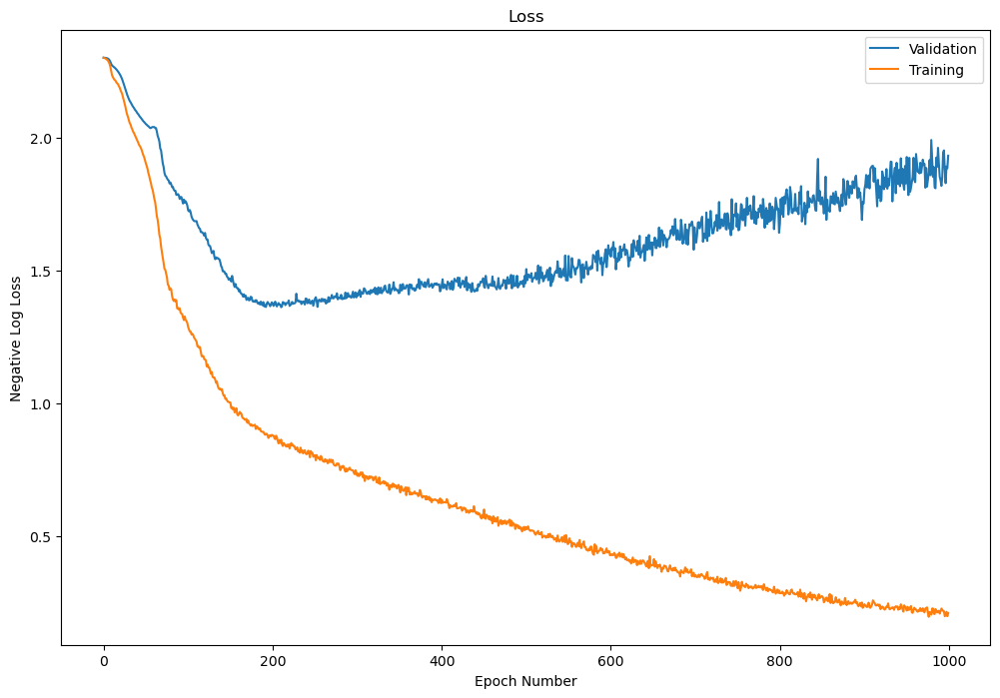


Peak Evaluation Accuracy: 67.5000%
Total Training Time: 5378.2827s

Training and testing "teo-cnn/teo-gtsc/pure/0/1"...
The size of an example dataset entry size is torch.Size([9, 2, 60, 41])
Weight initialisation complete.


Epoch: 1
	  > Mini-batch #0: 	Loss = 2.3028 	Accuracy = 11 / 200 (5.500%)
	  > Mini-batch #4: 	Loss = 2.3041 	Accuracy = 12 / 200 (6.000%)
	  > Mini-batch #8: 	Loss = 2.3024 	Accuracy = 21 / 200 (10.500%)
	  > Mini-batch #12: 	Loss = 2.3032 	Accuracy = 6 / 170 (3.529%)

	[Train] Time: 4.4	| Average Loss: 2.3026	| Accuracy: 237/2570 (9.222%)
	[Test]  Time: 1.15	| Average Loss: 2.3025	| Accuracy: 8/80 (10.000%)

Epoch: 2
	  > Mini-batch #0: 	Loss = 2.2997 	Accuracy = 30 / 200 (15.000%)
	  > Mini-batch #4: 	Loss = 2.3033 	Accuracy = 10 / 200 (5.000%)
	  > Mini-batch #8: 	Loss = 2.3014 	Accuracy = 23 / 200 (11.500%)
	  > Mini-batch #12: 	Loss = 2.3028 	Accuracy = 5 / 170 (2.941%)

	[Train] Time: 4.4	| Average Loss: 2.3011	| Accuracy: 281/2570 (10.934%)
	[Test]  Time:

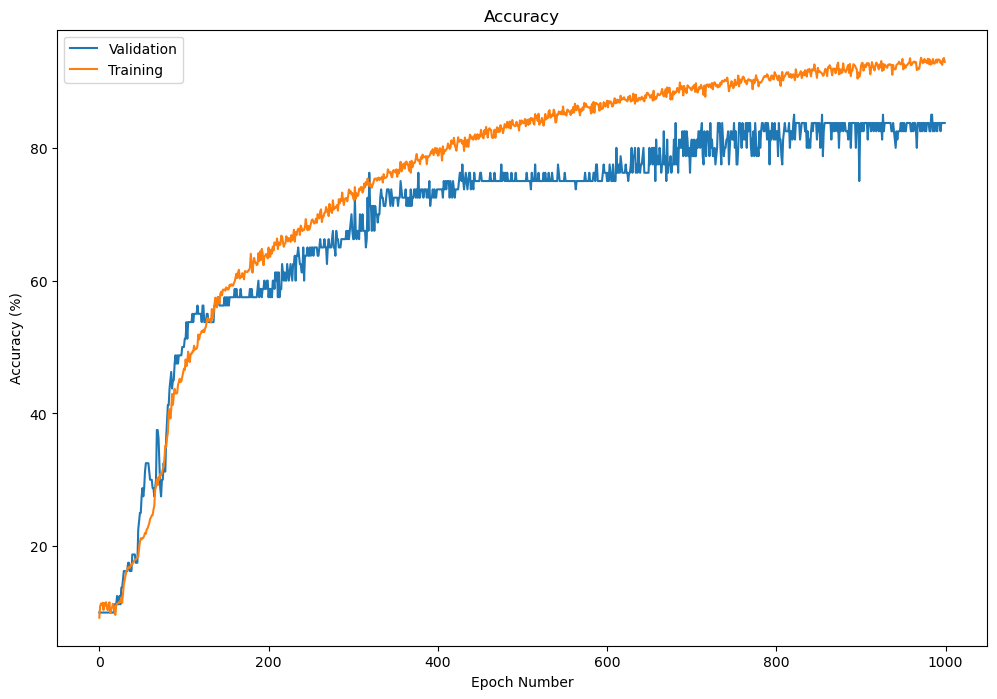

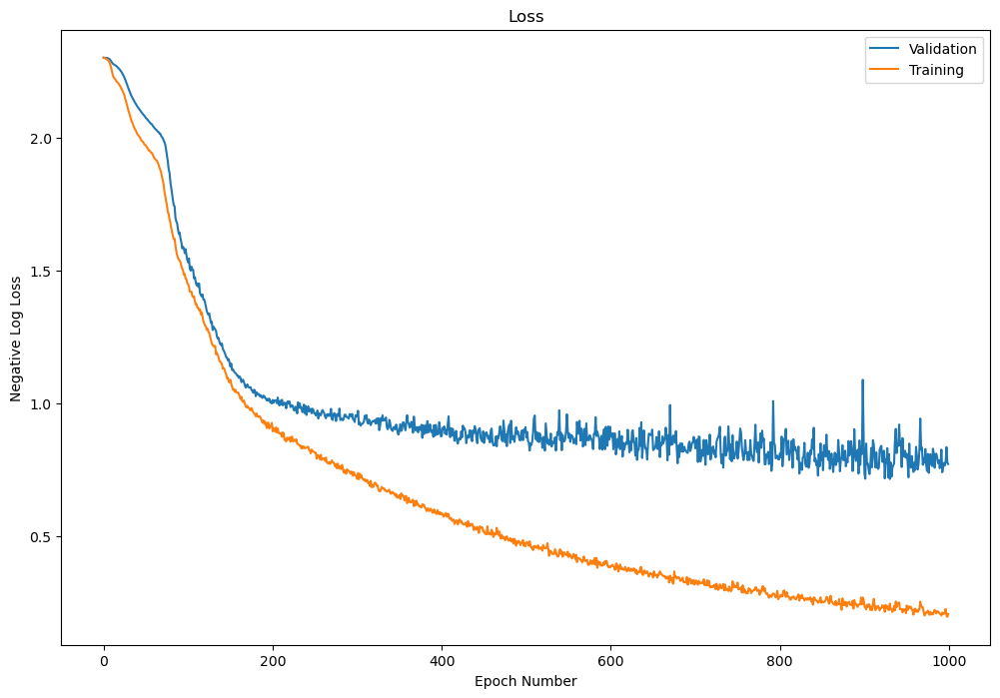


Peak Evaluation Accuracy: 85.0000%
Total Training Time: 5400.3416s

Training and testing "teo-cnn/teo-gtsc/pure/0/1/2"...
The size of an example dataset entry size is torch.Size([9, 2, 60, 41])
Weight initialisation complete.


Epoch: 1
	  > Mini-batch #0: 	Loss = 2.3016 	Accuracy = 30 / 200 (15.000%)
	  > Mini-batch #4: 	Loss = 2.2993 	Accuracy = 33 / 200 (16.500%)
	  > Mini-batch #8: 	Loss = 2.3024 	Accuracy = 13 / 200 (6.500%)
	  > Mini-batch #12: 	Loss = 2.3018 	Accuracy = 15 / 163 (9.202%)

	[Train] Time: 4.3	| Average Loss: 2.3022	| Accuracy: 261/2563 (10.183%)
	[Test]  Time: 1.16	| Average Loss: 2.3023	| Accuracy: 8/80 (10.000%)

Epoch: 2
	  > Mini-batch #0: 	Loss = 2.2980 	Accuracy = 43 / 200 (21.500%)
	  > Mini-batch #4: 	Loss = 2.2961 	Accuracy = 49 / 200 (24.500%)
	  > Mini-batch #8: 	Loss = 2.3012 	Accuracy = 9 / 200 (4.500%)
	  > Mini-batch #12: 	Loss = 2.3015 	Accuracy = 19 / 163 (11.656%)

	[Train] Time: 4.4	| Average Loss: 2.3007	| Accuracy: 287/2563 (11.198%)
	[Test] 

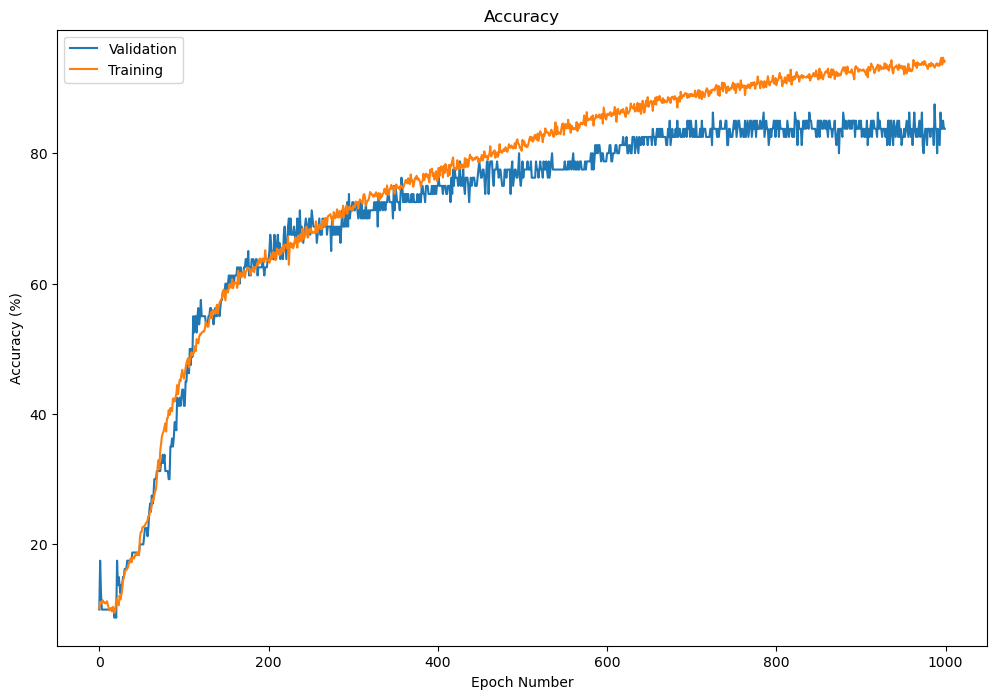

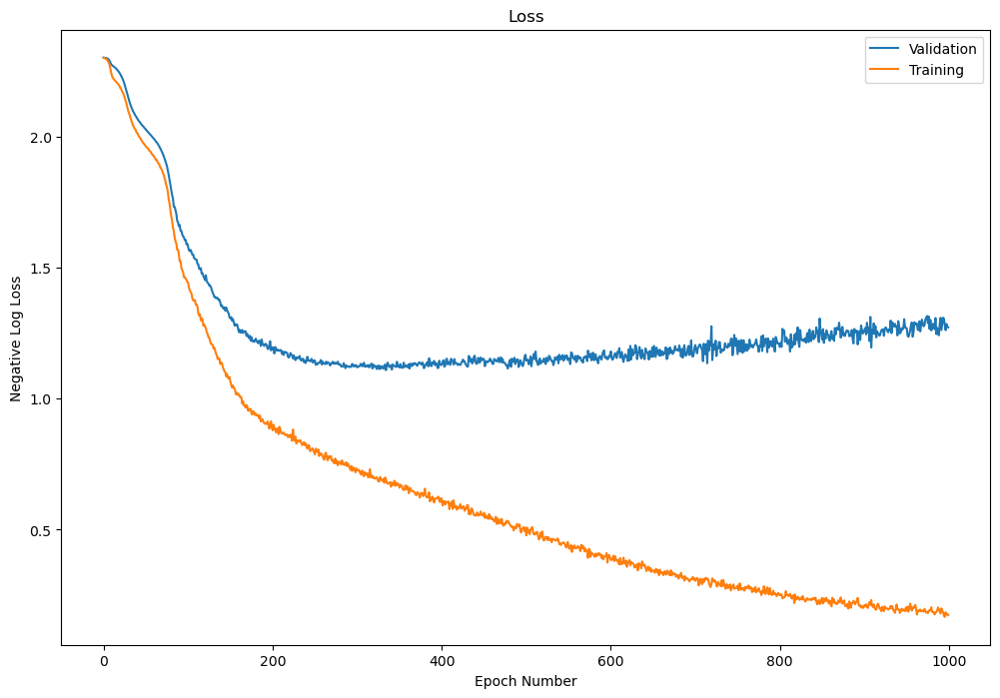


Peak Evaluation Accuracy: 87.5000%
Total Training Time: 5370.1169s

Training and testing "teo-cnn/teo-gtsc/pure/0/1/2/3"...
The size of an example dataset entry size is torch.Size([9, 2, 60, 41])
Weight initialisation complete.


Epoch: 1
	  > Mini-batch #0: 	Loss = 2.3020 	Accuracy = 23 / 200 (11.500%)
	  > Mini-batch #4: 	Loss = 2.3028 	Accuracy = 19 / 200 (9.500%)
	  > Mini-batch #8: 	Loss = 2.3019 	Accuracy = 23 / 200 (11.500%)
	  > Mini-batch #12: 	Loss = 2.3033 	Accuracy = 8 / 175 (4.571%)

	[Train] Time: 4.4	| Average Loss: 2.3026	| Accuracy: 221/2575 (8.583%)
	[Test]  Time: 1.14	| Average Loss: 2.3024	| Accuracy: 15/80 (18.750%)

Epoch: 2
	  > Mini-batch #0: 	Loss = 2.2988 	Accuracy = 45 / 200 (22.500%)
	  > Mini-batch #4: 	Loss = 2.3003 	Accuracy = 21 / 200 (10.500%)
	  > Mini-batch #8: 	Loss = 2.2997 	Accuracy = 25 / 200 (12.500%)
	  > Mini-batch #12: 	Loss = 2.3033 	Accuracy = 9 / 175 (5.143%)

	[Train] Time: 4.4	| Average Loss: 2.3011	| Accuracy: 271/2575 (10.524%)
	[Test]

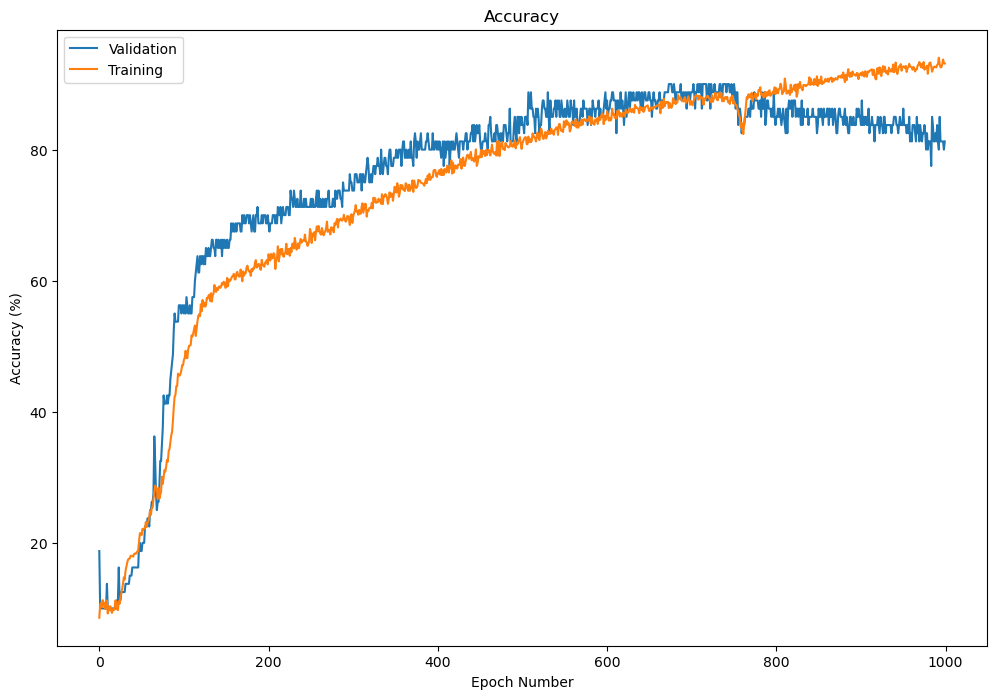

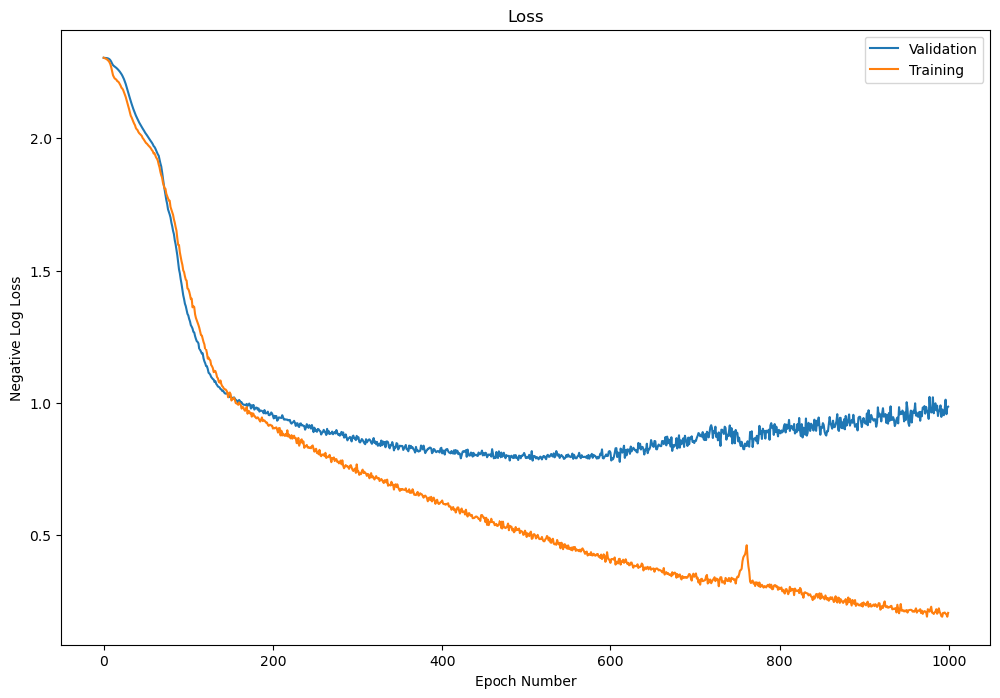


Peak Evaluation Accuracy: 90.0000%
Total Training Time: 5391.8130s

Training and testing "teo-cnn/teo-gtsc/pure/0/1/2/3/4"...
The size of an example dataset entry size is torch.Size([9, 2, 60, 41])
Weight initialisation complete.


Epoch: 1
	  > Mini-batch #0: 	Loss = 2.3032 	Accuracy = 22 / 200 (11.000%)
	  > Mini-batch #4: 	Loss = 2.3017 	Accuracy = 26 / 200 (13.000%)
	  > Mini-batch #8: 	Loss = 2.3012 	Accuracy = 31 / 200 (15.500%)
	  > Mini-batch #12: 	Loss = 2.3034 	Accuracy = 9 / 154 (5.844%)

	[Train] Time: 4.3	| Average Loss: 2.3028	| Accuracy: 259/2554 (10.141%)
	[Test]  Time: 1.17	| Average Loss: 2.3023	| Accuracy: 13/80 (16.250%)

Epoch: 2
	  > Mini-batch #0: 	Loss = 2.3006 	Accuracy = 34 / 200 (17.000%)
	  > Mini-batch #4: 	Loss = 2.2991 	Accuracy = 35 / 200 (17.500%)
	  > Mini-batch #8: 	Loss = 2.3004 	Accuracy = 30 / 200 (15.000%)
	  > Mini-batch #12: 	Loss = 2.3017 	Accuracy = 19 / 154 (12.338%)

	[Train] Time: 4.3	| Average Loss: 2.3014	| Accuracy: 284/2554 (11.120%)
	

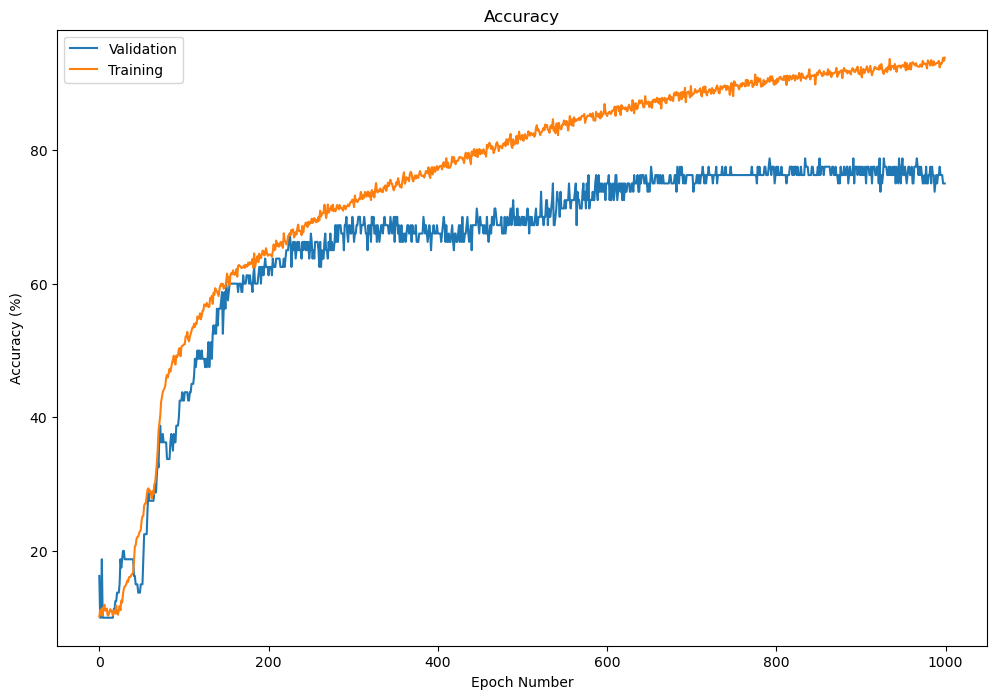

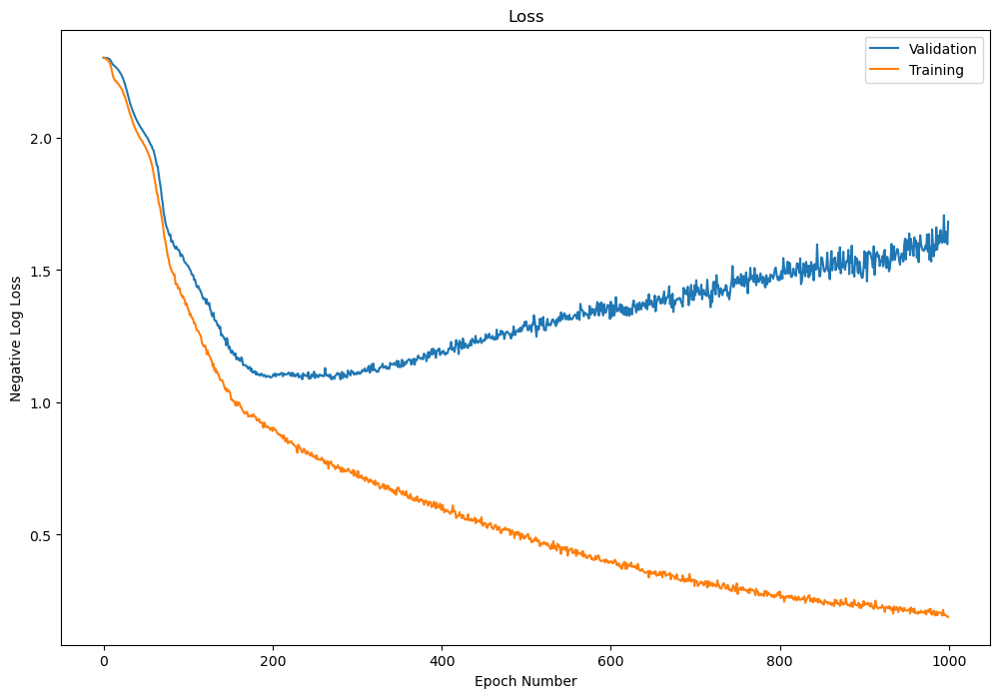


Peak Evaluation Accuracy: 78.7500%
Total Training Time: 5389.7290s

Peak Accuracies: [67.5  85.   87.5  90.   78.75]
Mean: 81.75
Std: 8.046739


In [38]:
with temporary_config():
    config.input_shape = (2, 60, 41)  # Piczak Short Segments
    config.epochs = 1000
    
    dataset = EscPureTeoGtscDataset(esc10=True, long=False)

    model = TEOGammmatoneCNN(dataset.get_class_count())
    model = model.to(config.device)

    input_type: InputType = "ensemble"

    cross_validate(dataset, model, input_type, "teo-cnn/teo-gtsc/pure")

#### Piczak CNN + TEO-GTSC



ESC Dataset: Found cache for fold-0 at '.cache/esc10/teo-gtsc/seg-short-test/fold-0': sample count = 80
ESC Dataset: Found cache for fold-1 at '.cache/esc10/teo-gtsc/seg-short-test/fold-1': sample count = 80
ESC Dataset: Found cache for fold-2 at '.cache/esc10/teo-gtsc/seg-short-test/fold-2': sample count = 80
ESC Dataset: Found cache for fold-3 at '.cache/esc10/teo-gtsc/seg-short-test/fold-3': sample count = 80
ESC Dataset: Found cache for fold-4 at '.cache/esc10/teo-gtsc/seg-short-test/fold-4': sample count = 80
ESC Dataset: Found cache for fold-0 at '.cache/esc10/teo-gtsc/seg-short/fold-0': sample count = 634
ESC Dataset: Found cache for fold-1 at '.cache/esc10/teo-gtsc/seg-short/fold-1': sample count = 650
ESC Dataset: Found cache for fold-2 at '.cache/esc10/teo-gtsc/seg-short/fold-2': sample count = 651
ESC Dataset: Found cache for fold-3 at '.cache/esc10/teo-gtsc/seg-short/fold-3': sample count = 643
ESC Dataset: Found cache for fold-4 at '.cache/esc10/teo-gtsc/seg-short/fold-4':

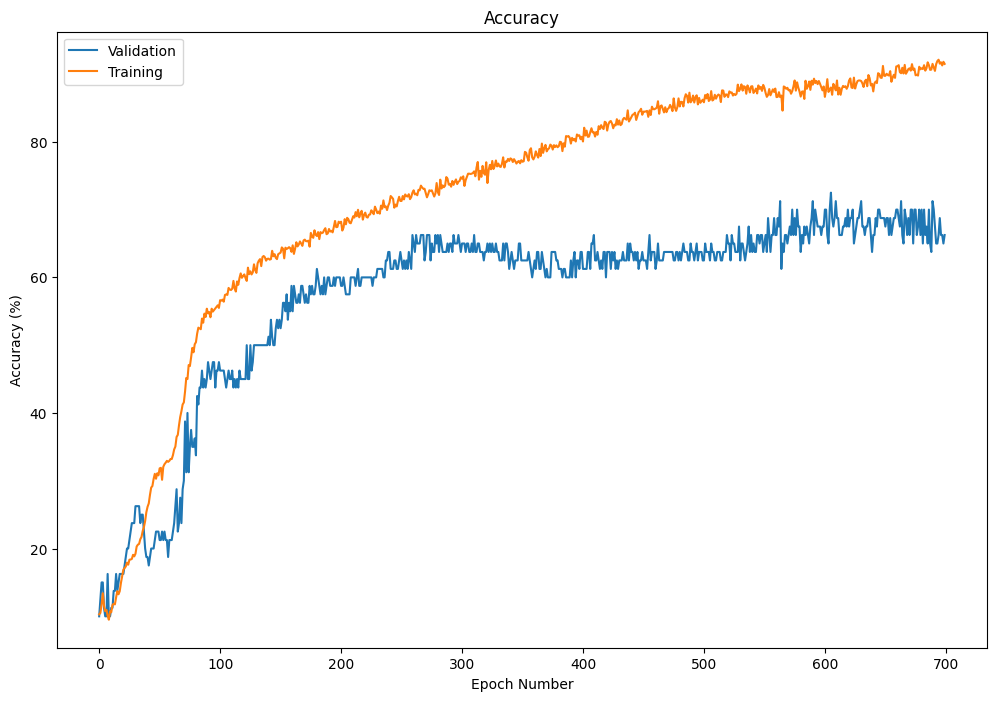

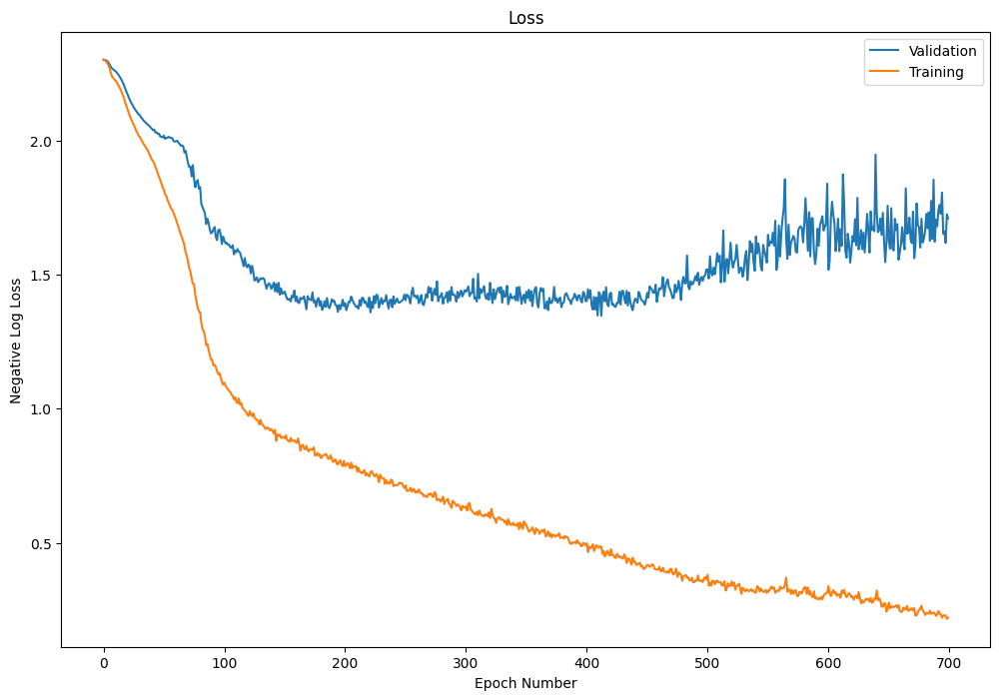


Peak Evaluation Accuracy: 72.5000%
Total Training Time: 1914.3765s

Training and testing "piczak/teo-gtsc/pure/0/1"...
The size of an example dataset entry size is torch.Size([9, 2, 60, 41])
Weight initialisation complete.


Epoch: 1
	  > Mini-batch #0: 	Loss = 2.3052 	Accuracy = 19 / 200 (9.500%)
	  > Mini-batch #4: 	Loss = 2.3030 	Accuracy = 20 / 200 (10.000%)
	  > Mini-batch #8: 	Loss = 2.3016 	Accuracy = 15 / 200 (7.500%)
	  > Mini-batch #12: 	Loss = 2.3004 	Accuracy = 22 / 195 (11.282%)

	[Train] Time: 2.2	| Average Loss: 2.3012	| Accuracy: 267/2595 (10.289%)
	[Test]  Time: 0.59	| Average Loss: 2.3019	| Accuracy: 8/80 (10.000%)

Epoch: 2
	  > Mini-batch #0: 	Loss = 2.2984 	Accuracy = 30 / 200 (15.000%)
	  > Mini-batch #4: 	Loss = 2.3035 	Accuracy = 9 / 200 (4.500%)
	  > Mini-batch #8: 	Loss = 2.2950 	Accuracy = 21 / 200 (10.500%)
	  > Mini-batch #12: 	Loss = 2.2994 	Accuracy = 18 / 195 (9.231%)

	[Train] Time: 2.1	| Average Loss: 2.2972	| Accuracy: 294/2595 (11.329%)
	[Test]  Tim

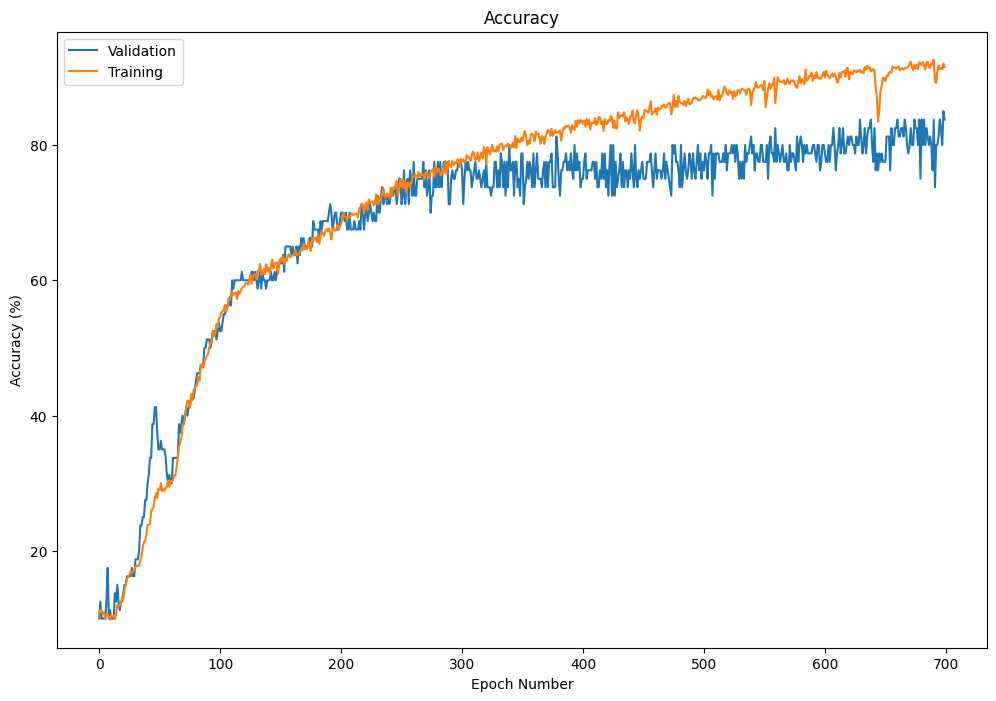

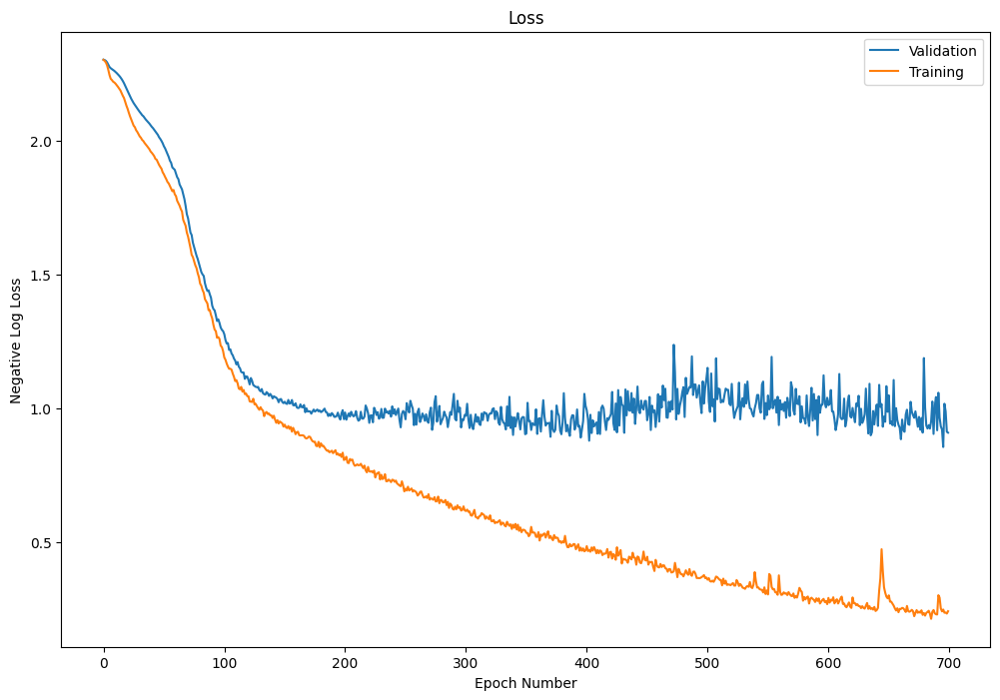


Peak Evaluation Accuracy: 85.0000%
Total Training Time: 1961.6196s

Training and testing "piczak/teo-gtsc/pure/0/1/2"...
The size of an example dataset entry size is torch.Size([9, 2, 60, 41])
Weight initialisation complete.


Epoch: 1
	  > Mini-batch #0: 	Loss = 2.2993 	Accuracy = 27 / 200 (13.500%)
	  > Mini-batch #4: 	Loss = 2.3052 	Accuracy = 19 / 200 (9.500%)
	  > Mini-batch #8: 	Loss = 2.3015 	Accuracy = 21 / 200 (10.500%)
	  > Mini-batch #12: 	Loss = 2.3080 	Accuracy = 4 / 194 (2.062%)

	[Train] Time: 2.2	| Average Loss: 2.3023	| Accuracy: 267/2594 (10.293%)
	[Test]  Time: 0.58	| Average Loss: 2.3017	| Accuracy: 7/80 (8.750%)

Epoch: 2
	  > Mini-batch #0: 	Loss = 2.2956 	Accuracy = 36 / 200 (18.000%)
	  > Mini-batch #4: 	Loss = 2.2996 	Accuracy = 18 / 200 (9.000%)
	  > Mini-batch #8: 	Loss = 2.2993 	Accuracy = 24 / 200 (12.000%)
	  > Mini-batch #12: 	Loss = 2.3068 	Accuracy = 3 / 194 (1.546%)

	[Train] Time: 2.3	| Average Loss: 2.2990	| Accuracy: 293/2594 (11.295%)
	[Test]  Tim

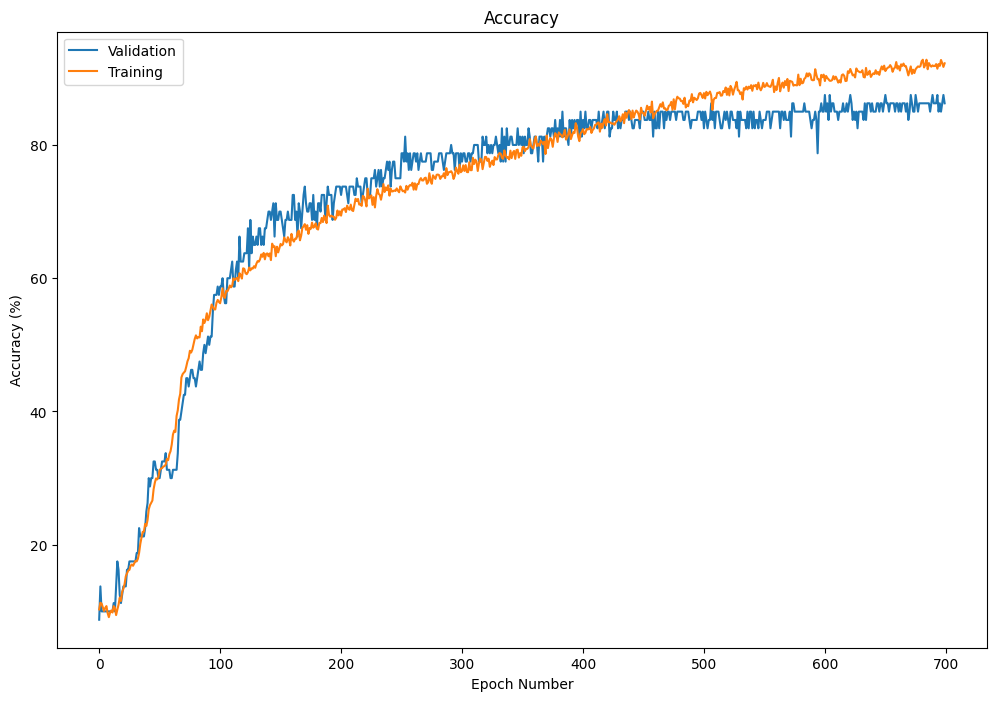

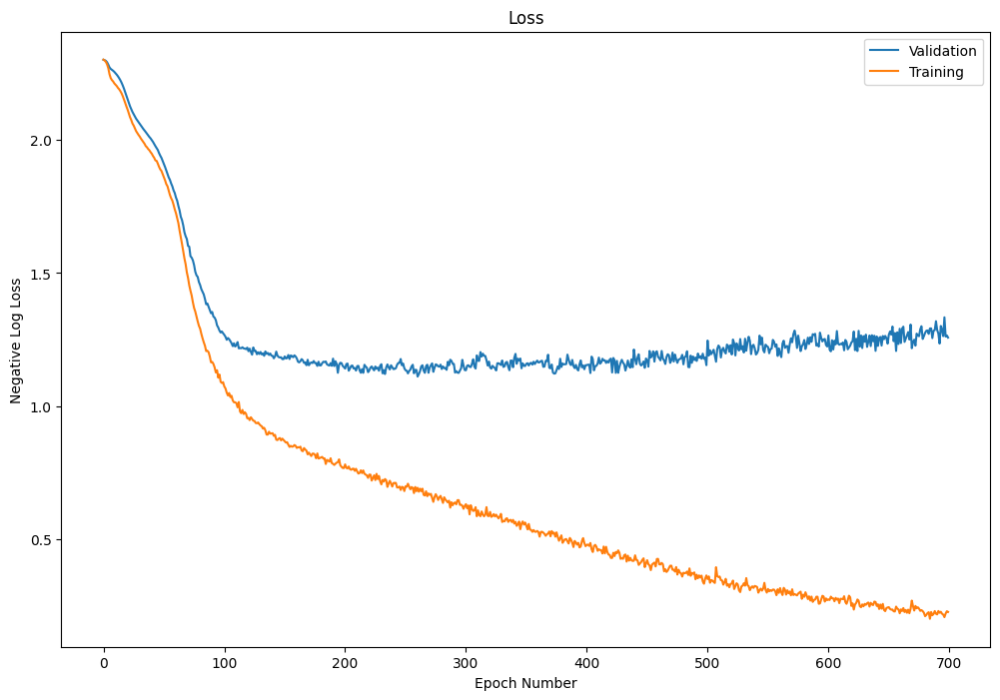


Peak Evaluation Accuracy: 87.5000%
Total Training Time: 1936.7667s

Training and testing "piczak/teo-gtsc/pure/0/1/2/3"...
The size of an example dataset entry size is torch.Size([9, 2, 60, 41])
Weight initialisation complete.


Epoch: 1
	  > Mini-batch #0: 	Loss = 2.2995 	Accuracy = 30 / 200 (15.000%)
	  > Mini-batch #4: 	Loss = 2.3009 	Accuracy = 25 / 200 (12.500%)
	  > Mini-batch #8: 	Loss = 2.3027 	Accuracy = 21 / 200 (10.500%)
	  > Mini-batch #12: 	Loss = 2.3031 	Accuracy = 15 / 200 (7.500%)

	[Train] Time: 2.2	| Average Loss: 2.3028	| Accuracy: 267/2602 (10.261%)
	[Test]  Time: 0.57	| Average Loss: 2.3020	| Accuracy: 5/80 (6.250%)

Epoch: 2
	  > Mini-batch #0: 	Loss = 2.2940 	Accuracy = 43 / 200 (21.500%)
	  > Mini-batch #4: 	Loss = 2.2991 	Accuracy = 17 / 200 (8.500%)
	  > Mini-batch #8: 	Loss = 2.2988 	Accuracy = 14 / 200 (7.000%)
	  > Mini-batch #12: 	Loss = 2.3004 	Accuracy = 15 / 200 (7.500%)

	[Train] Time: 2.2	| Average Loss: 2.2992	| Accuracy: 277/2602 (10.646%)
	[Test] 

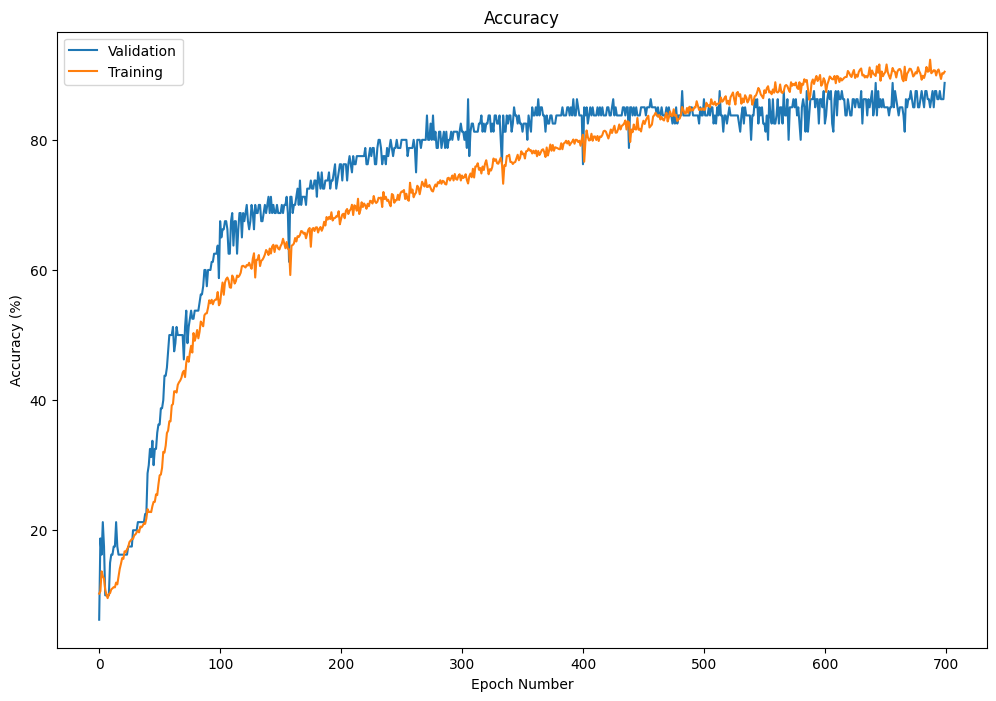

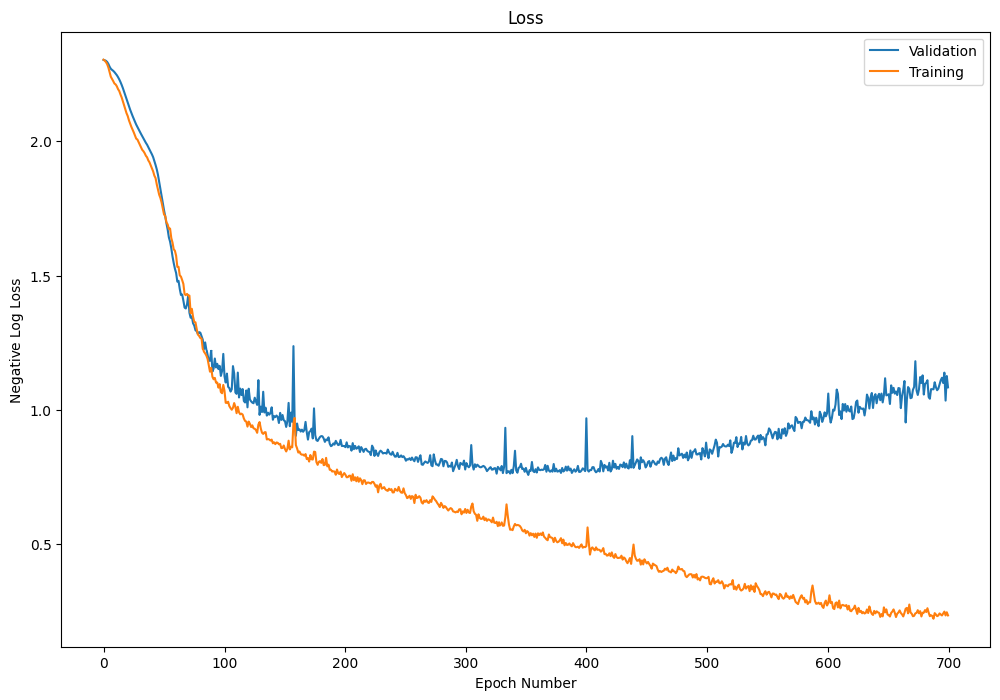


Peak Evaluation Accuracy: 88.7500%
Total Training Time: 1947.6275s

Training and testing "piczak/teo-gtsc/pure/0/1/2/3/4"...
The size of an example dataset entry size is torch.Size([9, 2, 60, 41])
Weight initialisation complete.


Epoch: 1
	  > Mini-batch #0: 	Loss = 2.3082 	Accuracy = 3 / 200 (1.500%)
	  > Mini-batch #4: 	Loss = 2.3006 	Accuracy = 28 / 200 (14.000%)
	  > Mini-batch #8: 	Loss = 2.2996 	Accuracy = 29 / 200 (14.500%)
	  > Mini-batch #12: 	Loss = 2.3020 	Accuracy = 21 / 178 (11.798%)

	[Train] Time: 2.2	| Average Loss: 2.3021	| Accuracy: 266/2578 (10.318%)
	[Test]  Time: 0.59	| Average Loss: 2.3021	| Accuracy: 8/80 (10.000%)

Epoch: 2
	  > Mini-batch #0: 	Loss = 2.3032 	Accuracy = 9 / 200 (4.500%)
	  > Mini-batch #4: 	Loss = 2.2959 	Accuracy = 42 / 200 (21.000%)
	  > Mini-batch #8: 	Loss = 2.2972 	Accuracy = 24 / 200 (12.000%)
	  > Mini-batch #12: 	Loss = 2.3012 	Accuracy = 20 / 178 (11.236%)

	[Train] Time: 2.2	| Average Loss: 2.2993	| Accuracy: 286/2578 (11.094%)
	[Tes

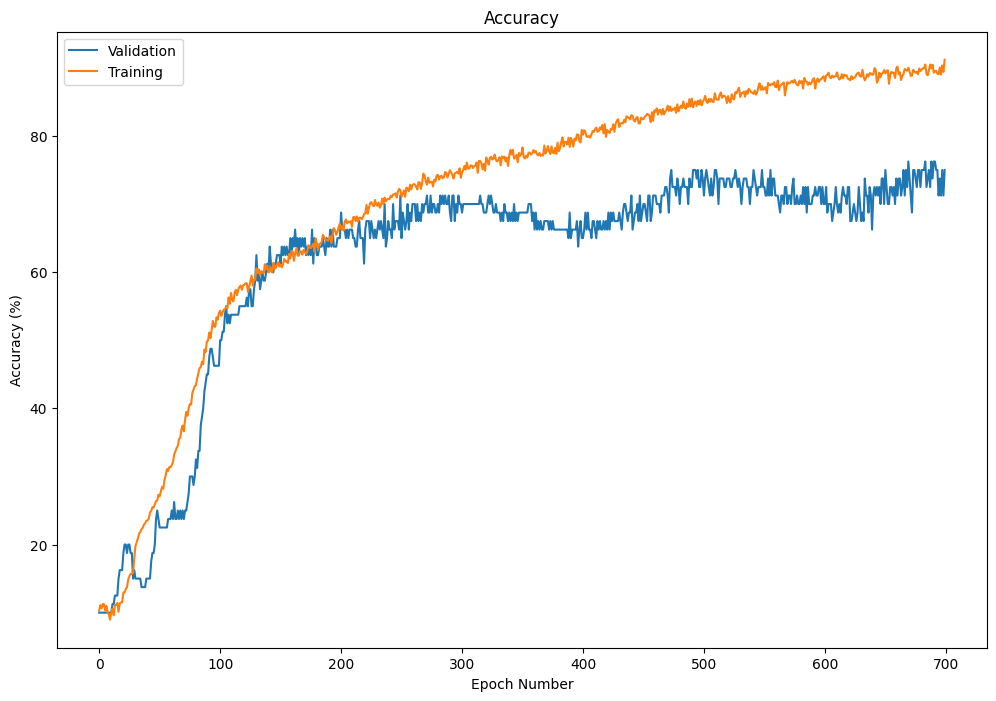

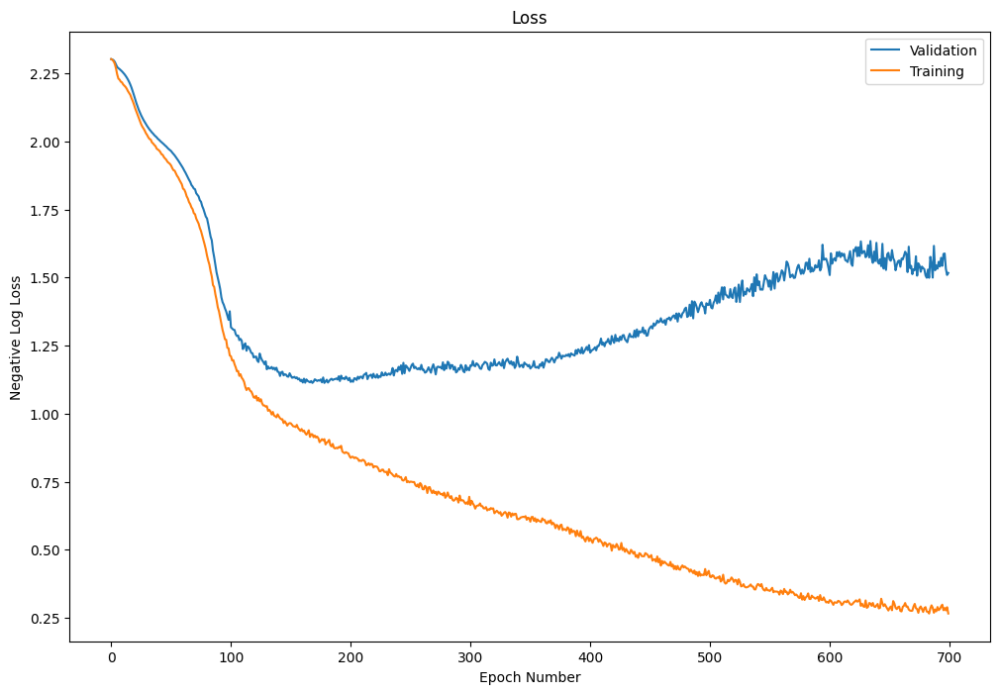


Peak Evaluation Accuracy: 76.2500%
Total Training Time: 1940.1559s

Peak Accuracies: [72.5  85.   87.5  88.75 76.25]
Mean: 82.0
Std: 6.451744


In [38]:
with temporary_config():
    config.input_shape = (2, 60, 41)  # Piczak CNN, Short Segments
    config.epochs = 700
    dataset = EscPureTeoGtscDataset(esc10=True, long=False)

    model = PiczakCNNBaseline(dataset.get_class_count(), long=False)
    model = model.to(config.device)

    input_type: InputType = "ensemble"

    cross_validate(dataset, model, input_type, "piczak/teo-gtsc/pure")

#### Piczak CNN + Fused TEO-GTSC

ESC Dataset: Found cache for fold-0 at '.cache/esc10/gtsc/seg-short-test/fold-0': sample count = 80
ESC Dataset: Found cache for fold-1 at '.cache/esc10/gtsc/seg-short-test/fold-1': sample count = 80
ESC Dataset: Found cache for fold-2 at '.cache/esc10/gtsc/seg-short-test/fold-2': sample count = 80
ESC Dataset: Found cache for fold-3 at '.cache/esc10/gtsc/seg-short-test/fold-3': sample count = 80
ESC Dataset: Found cache for fold-4 at '.cache/esc10/gtsc/seg-short-test/fold-4': sample count = 80
ESC Dataset: Found cache for fold-0 at '.cache/esc10/gtsc/seg-short/fold-0': sample count = 641
ESC Dataset: Found cache for fold-1 at '.cache/esc10/gtsc/seg-short/fold-1': sample count = 660
ESC Dataset: Found cache for fold-2 at '.cache/esc10/gtsc/seg-short/fold-2': sample count = 662
ESC Dataset: Found cache for fold-3 at '.cache/esc10/gtsc/seg-short/fold-3': sample count = 658
ESC Dataset: Found cache for fold-4 at '.cache/esc10/gtsc/seg-short/fold-4': sample count = 675
Training and testing

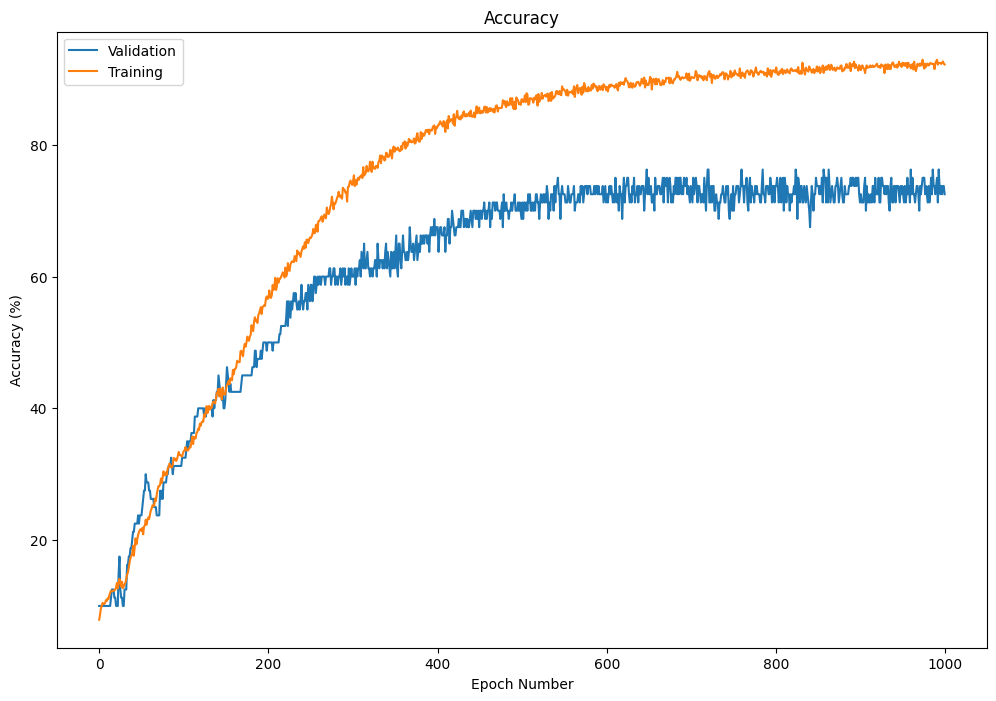

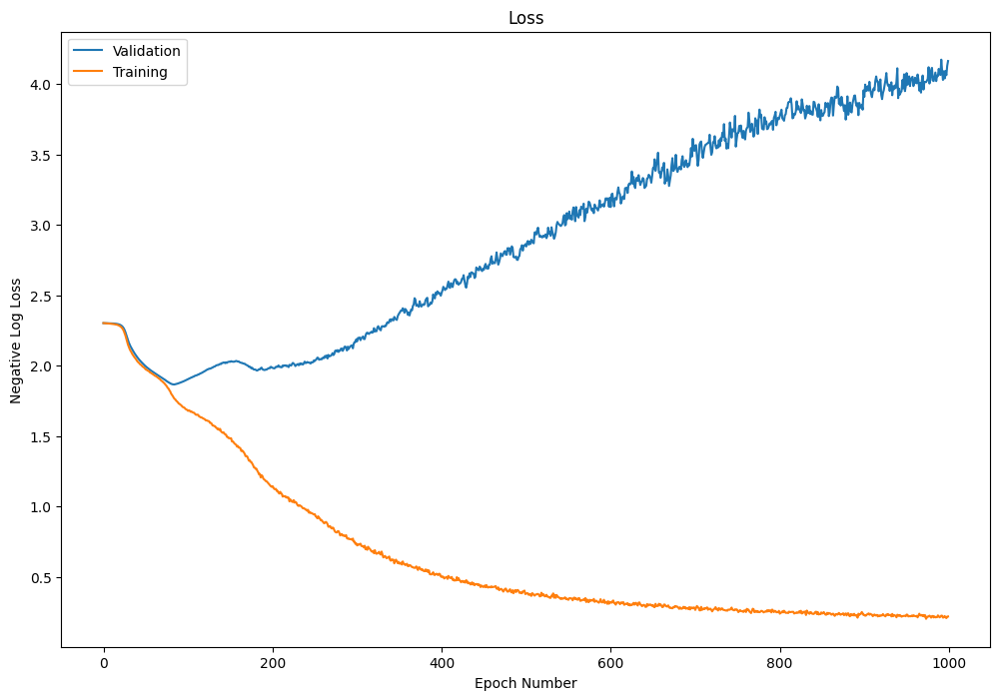


Peak Evaluation Accuracy: 76.2500%
Total Training Time: 2864.1307s

Training and testing "piczak/teo-gtsc/fused/0/1"...
The size of an example dataset entry size is torch.Size([9, 2, 60, 41])
Weight initialisation complete.


Epoch: 1
	  > Mini-batch #0: 	Loss = 2.3022 	Accuracy = 25 / 200 (12.500%)
	  > Mini-batch #4: 	Loss = 2.3027 	Accuracy = 10 / 200 (5.000%)
	  > Mini-batch #8: 	Loss = 2.3026 	Accuracy = 11 / 200 (5.500%)
	  > Mini-batch #12: 	Loss = 2.3024 	Accuracy = 12 / 200 (6.000%)

	[Train] Time: 2.3	| Average Loss: 2.3027	| Accuracy: 214/2636 (8.118%)
	[Test]  Time: 0.60	| Average Loss: 2.3024	| Accuracy: 7/80 (8.750%)

Epoch: 2
	  > Mini-batch #0: 	Loss = 2.3008 	Accuracy = 19 / 200 (9.500%)
	  > Mini-batch #4: 	Loss = 2.3034 	Accuracy = 10 / 200 (5.000%)
	  > Mini-batch #8: 	Loss = 2.3018 	Accuracy = 14 / 200 (7.000%)
	  > Mini-batch #12: 	Loss = 2.3019 	Accuracy = 16 / 200 (8.000%)

	[Train] Time: 2.3	| Average Loss: 2.3020	| Accuracy: 242/2636 (9.181%)
	[Test]  Time: 0

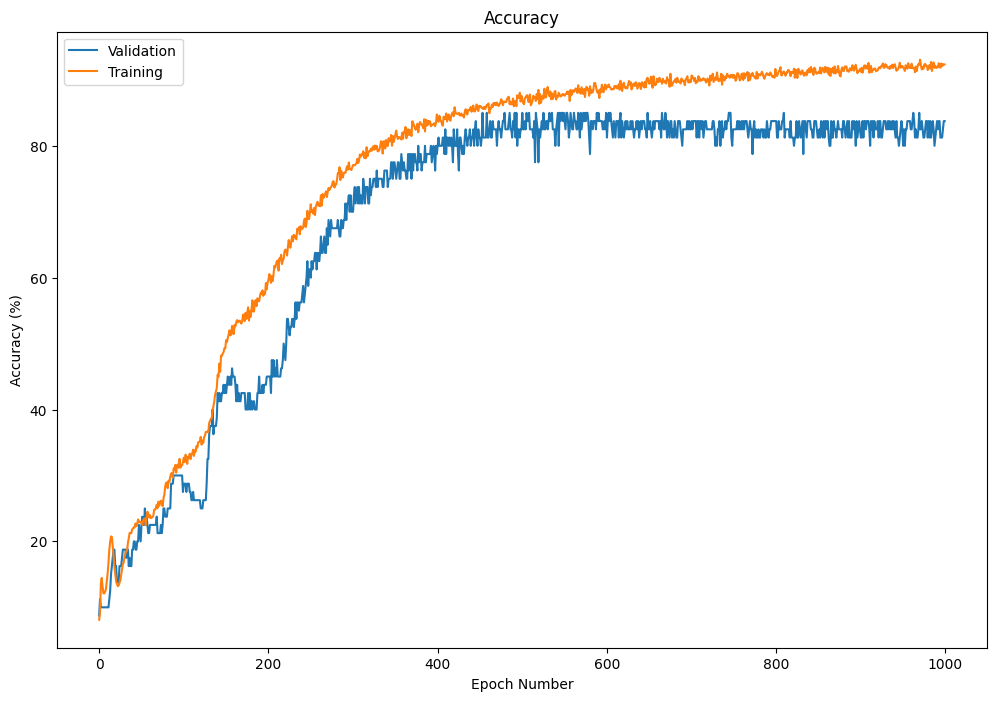

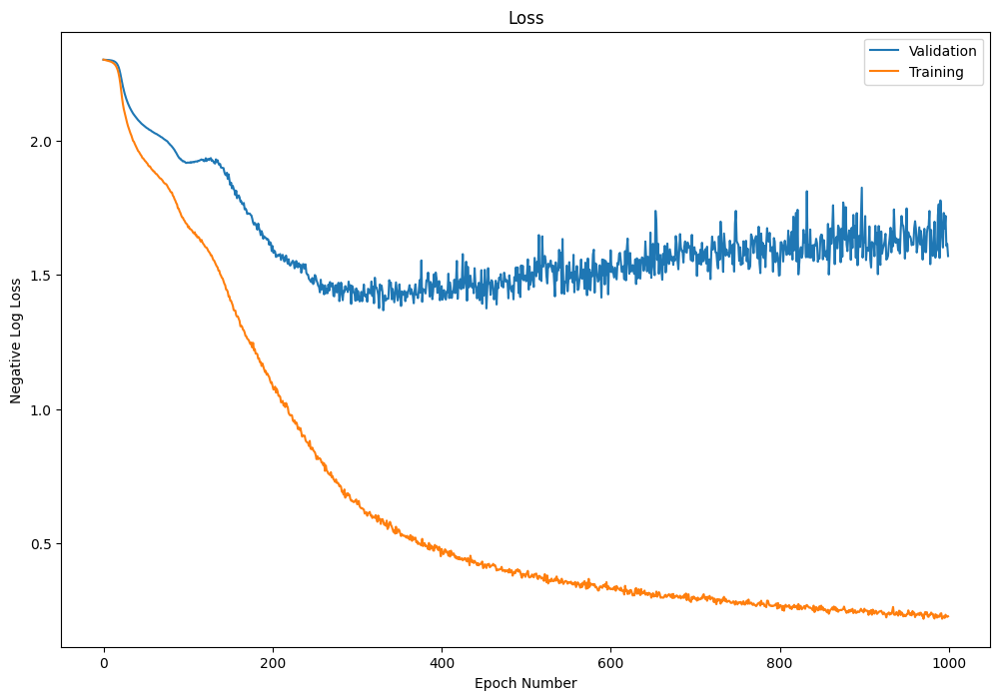


Peak Evaluation Accuracy: 85.0000%
Total Training Time: 2910.4824s

Training and testing "piczak/teo-gtsc/fused/0/1/2"...
The size of an example dataset entry size is torch.Size([9, 2, 60, 41])
Weight initialisation complete.


Epoch: 1
	  > Mini-batch #0: 	Loss = 2.3029 	Accuracy = 12 / 200 (6.000%)
	  > Mini-batch #4: 	Loss = 2.3027 	Accuracy = 4 / 200 (2.000%)
	  > Mini-batch #8: 	Loss = 2.3024 	Accuracy = 17 / 200 (8.500%)
	  > Mini-batch #12: 	Loss = 2.3022 	Accuracy = 18 / 200 (9.000%)

	[Train] Time: 2.3	| Average Loss: 2.3029	| Accuracy: 200/2634 (7.593%)
	[Test]  Time: 0.59	| Average Loss: 2.3026	| Accuracy: 8/80 (10.000%)

Epoch: 2
	  > Mini-batch #0: 	Loss = 2.3012 	Accuracy = 30 / 200 (15.000%)
	  > Mini-batch #4: 	Loss = 2.3014 	Accuracy = 30 / 200 (15.000%)
	  > Mini-batch #8: 	Loss = 2.3017 	Accuracy = 29 / 200 (14.500%)
	  > Mini-batch #12: 	Loss = 2.3014 	Accuracy = 35 / 200 (17.500%)

	[Train] Time: 2.3	| Average Loss: 2.3023	| Accuracy: 247/2634 (9.377%)
	[Test]  Ti

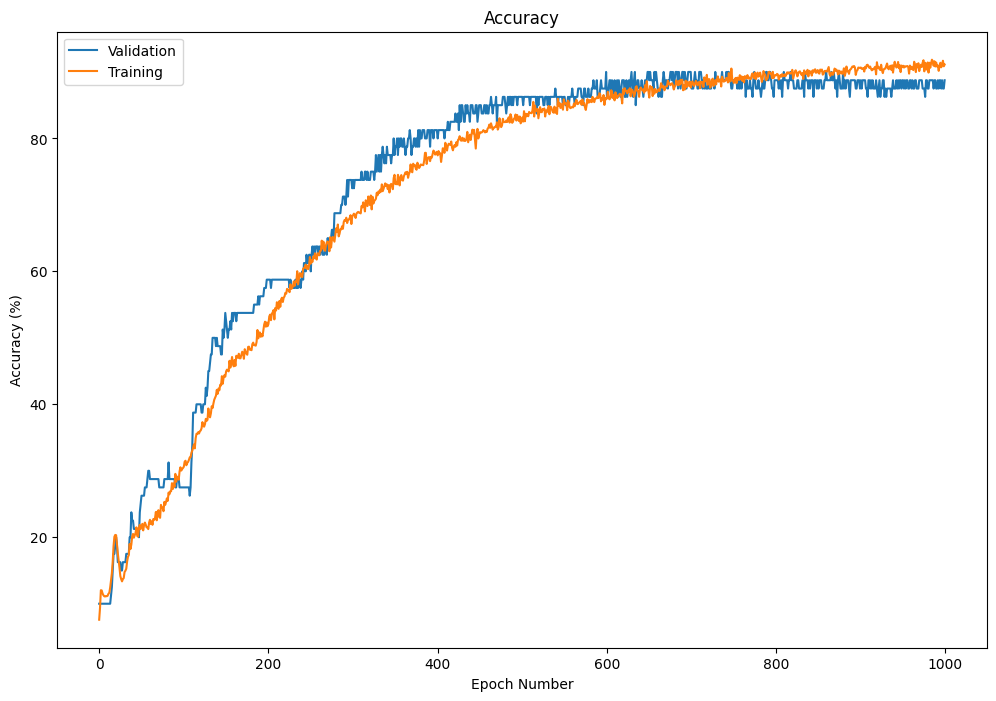

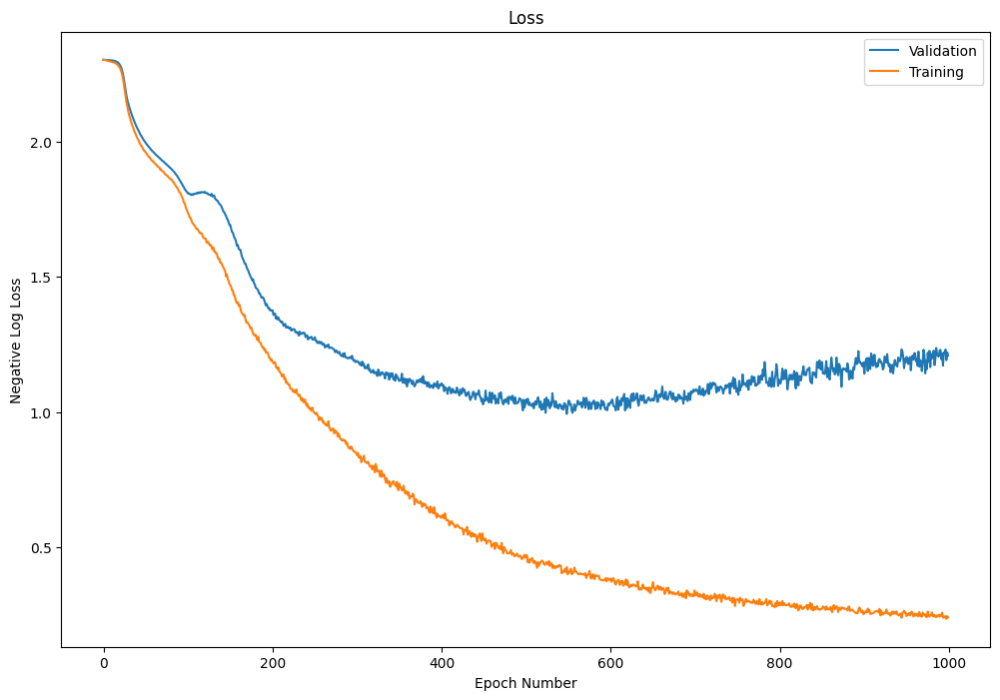


Peak Evaluation Accuracy: 90.0000%
Total Training Time: 2846.1993s

Training and testing "piczak/teo-gtsc/fused/0/1/2/3"...
The size of an example dataset entry size is torch.Size([9, 2, 60, 41])
Weight initialisation complete.


Epoch: 1
	  > Mini-batch #0: 	Loss = 2.3019 	Accuracy = 37 / 200 (18.500%)
	  > Mini-batch #4: 	Loss = 2.3018 	Accuracy = 20 / 200 (10.000%)
	  > Mini-batch #8: 	Loss = 2.3025 	Accuracy = 24 / 200 (12.000%)
	  > Mini-batch #12: 	Loss = 2.3026 	Accuracy = 9 / 200 (4.500%)

	[Train] Time: 2.2	| Average Loss: 2.3028	| Accuracy: 225/2638 (8.529%)
	[Test]  Time: 0.57	| Average Loss: 2.3026	| Accuracy: 10/80 (12.500%)

Epoch: 2
	  > Mini-batch #0: 	Loss = 2.3002 	Accuracy = 41 / 200 (20.500%)
	  > Mini-batch #4: 	Loss = 2.3012 	Accuracy = 34 / 200 (17.000%)
	  > Mini-batch #8: 	Loss = 2.3015 	Accuracy = 16 / 200 (8.000%)
	  > Mini-batch #12: 	Loss = 2.3019 	Accuracy = 27 / 200 (13.500%)

	[Train] Time: 2.2	| Average Loss: 2.3022	| Accuracy: 274/2638 (10.387%)
	[Tes

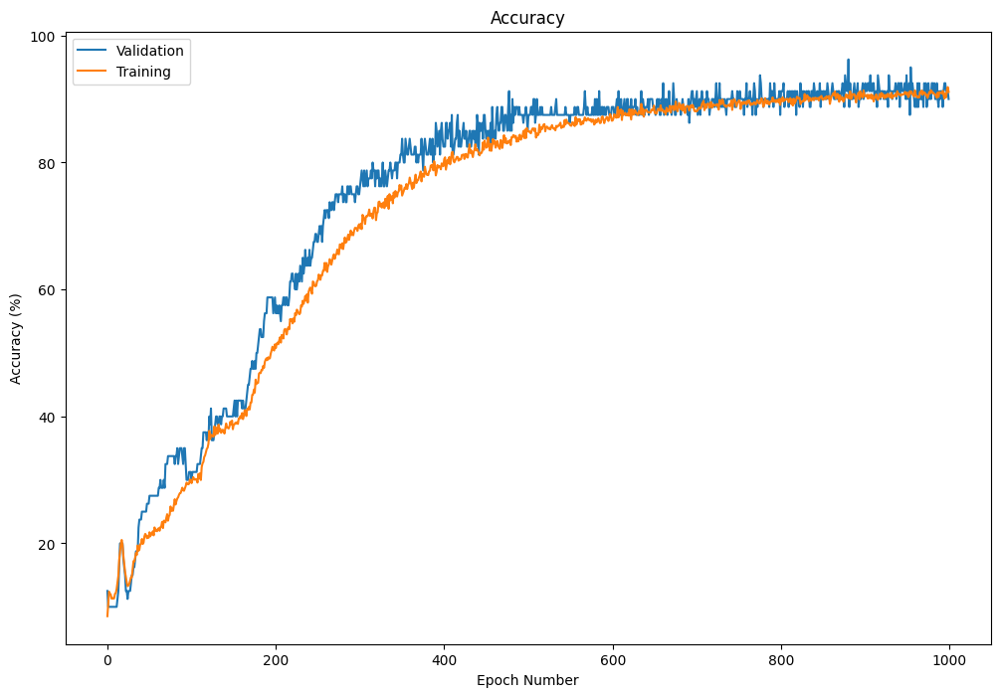

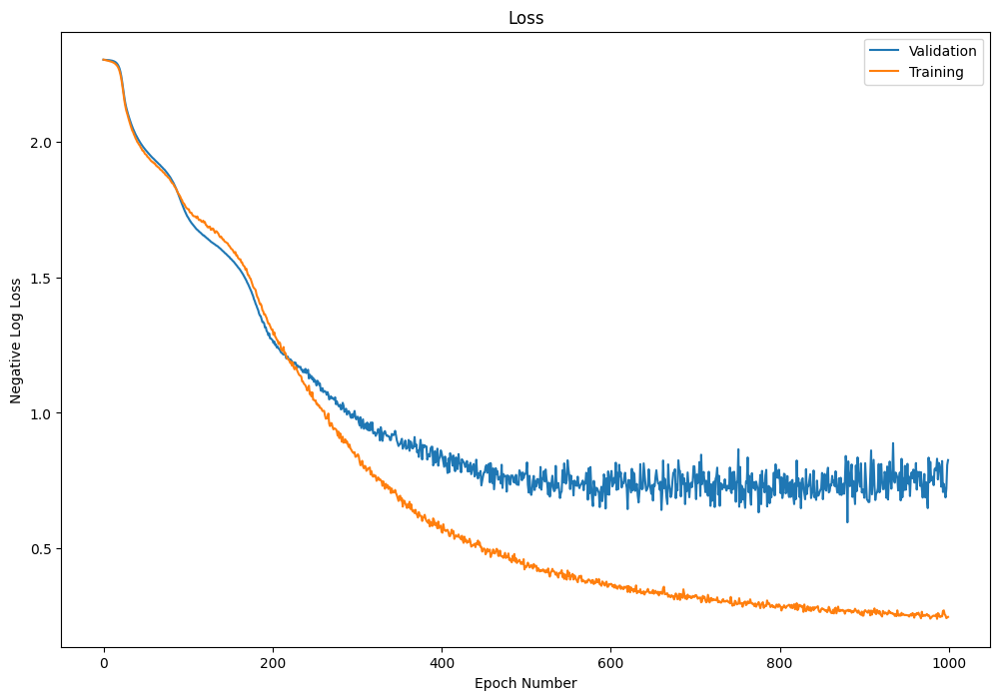


Peak Evaluation Accuracy: 96.2500%
Total Training Time: 2818.9292s

Training and testing "piczak/teo-gtsc/fused/0/1/2/3/4"...
The size of an example dataset entry size is torch.Size([9, 2, 60, 41])
Weight initialisation complete.


Epoch: 1
	  > Mini-batch #0: 	Loss = 2.3022 	Accuracy = 23 / 200 (11.500%)
	  > Mini-batch #4: 	Loss = 2.3024 	Accuracy = 18 / 200 (9.000%)
	  > Mini-batch #8: 	Loss = 2.3019 	Accuracy = 29 / 200 (14.500%)
	  > Mini-batch #12: 	Loss = 2.3035 	Accuracy = 3 / 200 (1.500%)

	[Train] Time: 2.2	| Average Loss: 2.3027	| Accuracy: 213/2621 (8.127%)
	[Test]  Time: 0.58	| Average Loss: 2.3025	| Accuracy: 8/80 (10.000%)

Epoch: 2
	  > Mini-batch #0: 	Loss = 2.3001 	Accuracy = 37 / 200 (18.500%)
	  > Mini-batch #4: 	Loss = 2.3018 	Accuracy = 11 / 200 (5.500%)
	  > Mini-batch #8: 	Loss = 2.2982 	Accuracy = 73 / 200 (36.500%)
	  > Mini-batch #12: 	Loss = 2.3037 	Accuracy = 26 / 200 (13.000%)

	[Train] Time: 2.2	| Average Loss: 2.3015	| Accuracy: 290/2621 (11.064%)
	[Tes

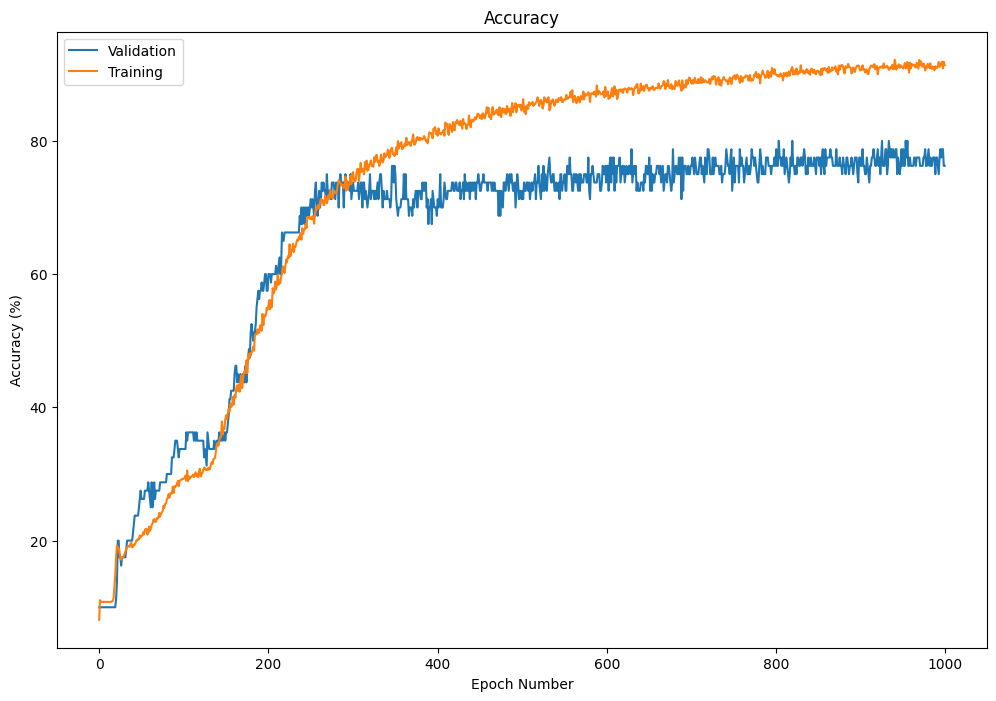

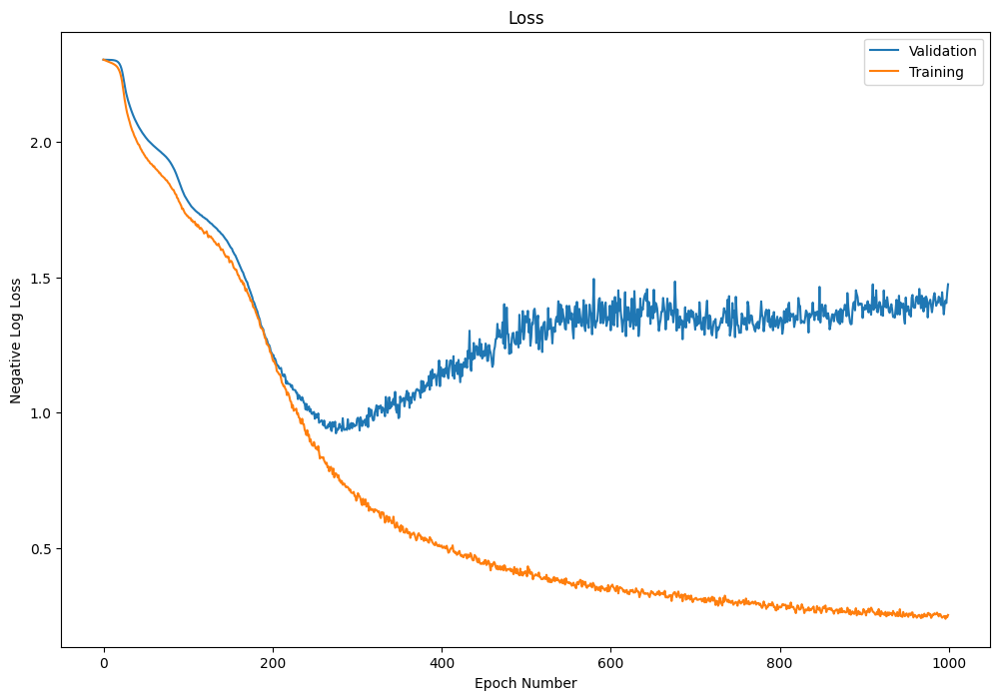


Peak Evaluation Accuracy: 80.0000%
Total Training Time: 2787.8395s

Peak Accuracies: [76.25 85.   90.   96.25 80.  ]
Mean: 85.5
Std: 7.0975347


In [147]:
with temporary_config():
    config.input_shape = (2, 60, 41)  # Piczak CNN, Short Segments
    config.epochs = 1000

    dataset = EscFusedTeoGtscDataset(esc10=True)

    model = PiczakCNNBaseline(dataset.get_class_count(), long=False)
    model = model.to(config.device)

    input_type: InputType = "ensemble"

    cross_validate(dataset, model, input_type, "piczak/teo-gtsc/fused")

#### OurNet + Log-Mel

ESC Dataset: Found cache for fold-0 at '.cache/esc10/log-mel/seg-short-test/fold-0': sample count = 80
ESC Dataset: Found cache for fold-1 at '.cache/esc10/log-mel/seg-short-test/fold-1': sample count = 80
ESC Dataset: Found cache for fold-2 at '.cache/esc10/log-mel/seg-short-test/fold-2': sample count = 80
ESC Dataset: Found cache for fold-3 at '.cache/esc10/log-mel/seg-short-test/fold-3': sample count = 80
ESC Dataset: Found cache for fold-4 at '.cache/esc10/log-mel/seg-short-test/fold-4': sample count = 80
ESC Dataset: Found cache for fold-0 at '.cache/esc10/log-mel/seg-short/fold-0': sample count = 628
ESC Dataset: Found cache for fold-1 at '.cache/esc10/log-mel/seg-short/fold-1': sample count = 649
ESC Dataset: Found cache for fold-2 at '.cache/esc10/log-mel/seg-short/fold-2': sample count = 647
ESC Dataset: Found cache for fold-3 at '.cache/esc10/log-mel/seg-short/fold-3': sample count = 641
ESC Dataset: Found cache for fold-4 at '.cache/esc10/log-mel/seg-short/fold-4': sample co

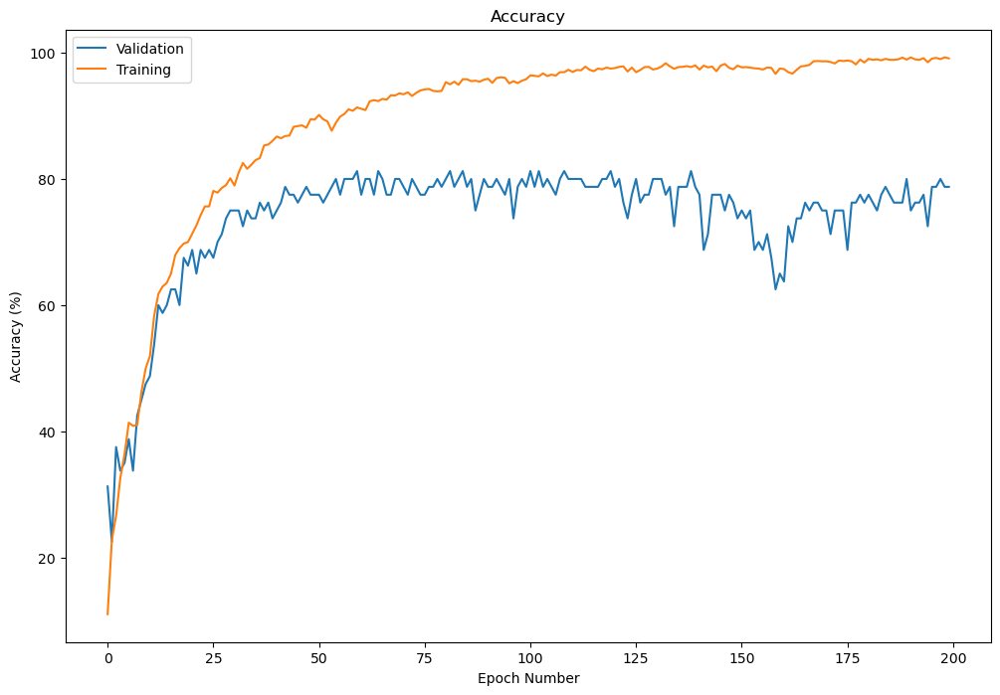

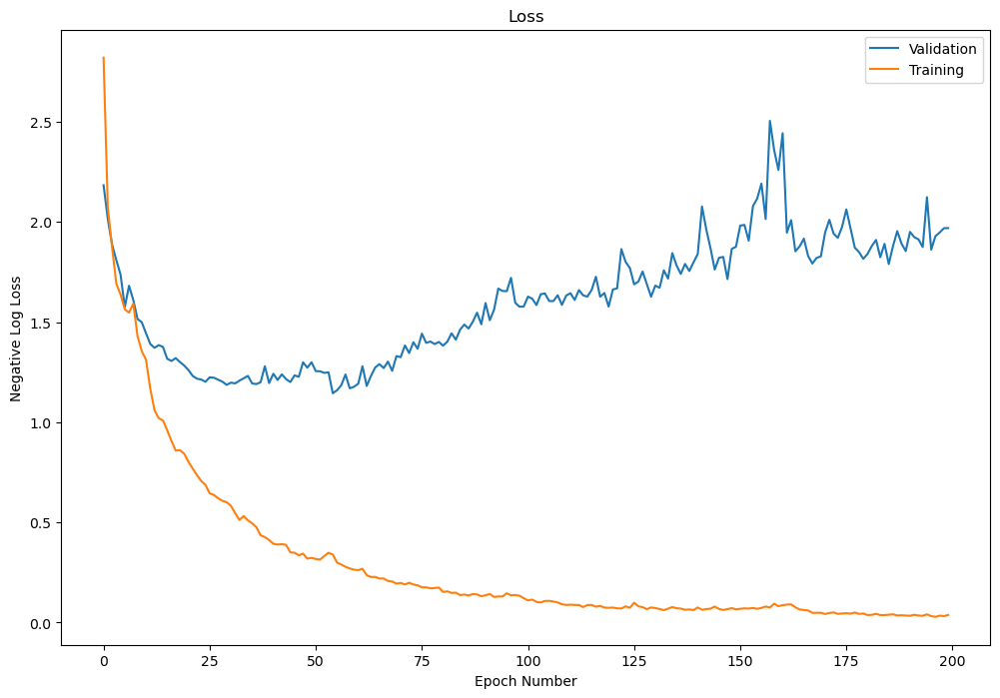


Peak Evaluation Accuracy: 81.2500%
Total Training Time: 555.7472s

Training and testing "our-net/log-mel/0/1"...
The size of an example dataset entry size is torch.Size([9, 2, 60, 41])
Weight initialisation complete.


Epoch: 1
	  > Mini-batch #0: 	Loss = 3.0753 	Accuracy = 6 / 200 (3.000%)
	  > Mini-batch #4: 	Loss = 2.6015 	Accuracy = 10 / 200 (5.000%)
	  > Mini-batch #8: 	Loss = 1.9997 	Accuracy = 59 / 200 (29.500%)
	  > Mini-batch #12: 	Loss = 2.1167 	Accuracy = 27 / 178 (15.169%)

	[Train] Time: 2.3	| Average Loss: 2.4361	| Accuracy: 338/2578 (13.111%)
	[Test]  Time: 0.57	| Average Loss: 2.1495	| Accuracy: 22/80 (27.500%)

Epoch: 2
	  > Mini-batch #0: 	Loss = 2.0011 	Accuracy = 36 / 200 (18.000%)
	  > Mini-batch #4: 	Loss = 2.1683 	Accuracy = 24 / 200 (12.000%)
	  > Mini-batch #8: 	Loss = 1.8625 	Accuracy = 54 / 200 (27.000%)
	  > Mini-batch #12: 	Loss = 2.1395 	Accuracy = 33 / 178 (18.539%)

	[Train] Time: 2.2	| Average Loss: 2.0663	| Accuracy: 501/2578 (19.434%)
	[Test]  Time: 

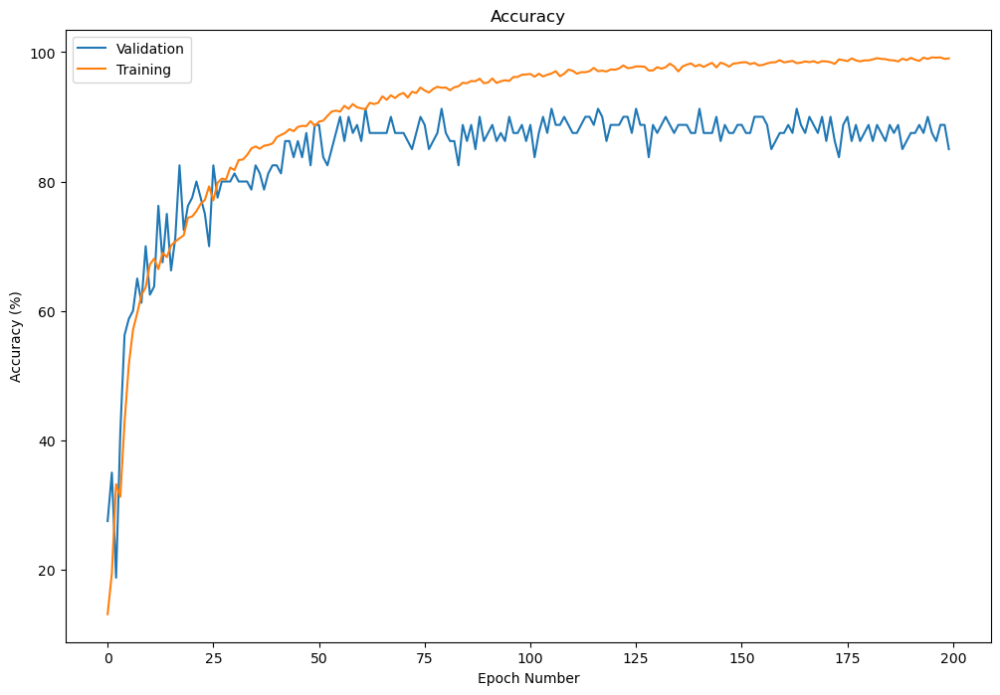

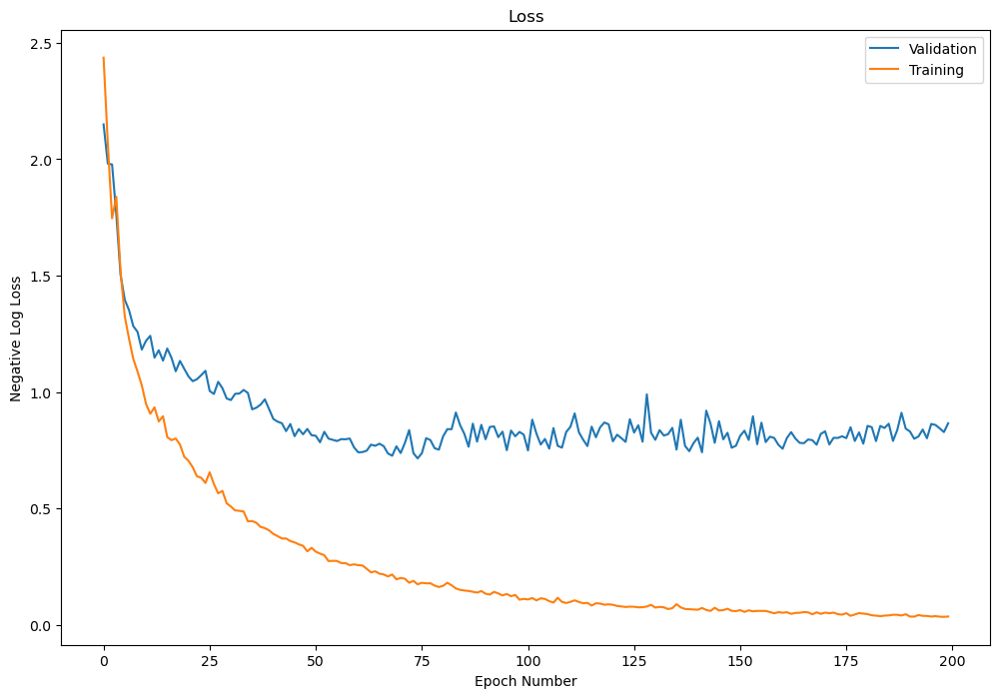


Peak Evaluation Accuracy: 91.2500%
Total Training Time: 565.9673s

Training and testing "our-net/log-mel/0/1/2"...
The size of an example dataset entry size is torch.Size([9, 2, 60, 41])
Weight initialisation complete.


Epoch: 1
	  > Mini-batch #0: 	Loss = 2.6740 	Accuracy = 13 / 200 (6.500%)
	  > Mini-batch #4: 	Loss = 3.2628 	Accuracy = 1 / 200 (0.500%)
	  > Mini-batch #8: 	Loss = 2.3547 	Accuracy = 24 / 200 (12.000%)
	  > Mini-batch #12: 	Loss = 2.1438 	Accuracy = 29 / 180 (16.111%)

	[Train] Time: 2.3	| Average Loss: 2.6977	| Accuracy: 248/2580 (9.612%)
	[Test]  Time: 0.55	| Average Loss: 2.2388	| Accuracy: 12/80 (15.000%)

Epoch: 2
	  > Mini-batch #0: 	Loss = 2.4645 	Accuracy = 12 / 200 (6.000%)
	  > Mini-batch #4: 	Loss = 4.8904 	Accuracy = 12 / 200 (6.000%)
	  > Mini-batch #8: 	Loss = 2.3665 	Accuracy = 35 / 200 (17.500%)
	  > Mini-batch #12: 	Loss = 2.2232 	Accuracy = 35 / 180 (19.444%)

	[Train] Time: 2.2	| Average Loss: 2.3242	| Accuracy: 596/2580 (23.101%)
	[Test]  Time: 0

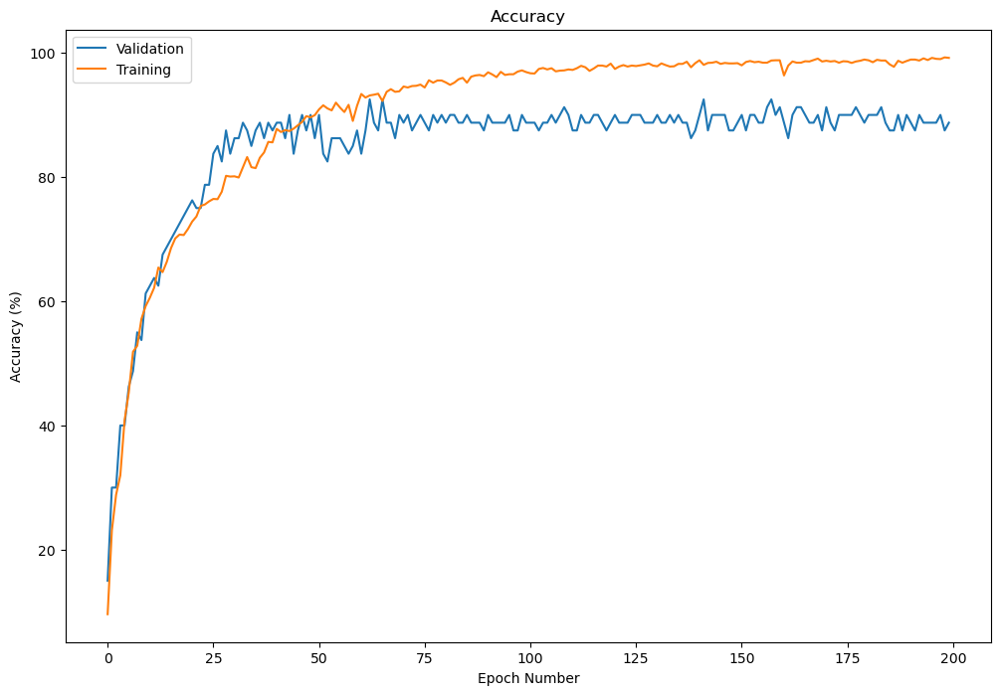

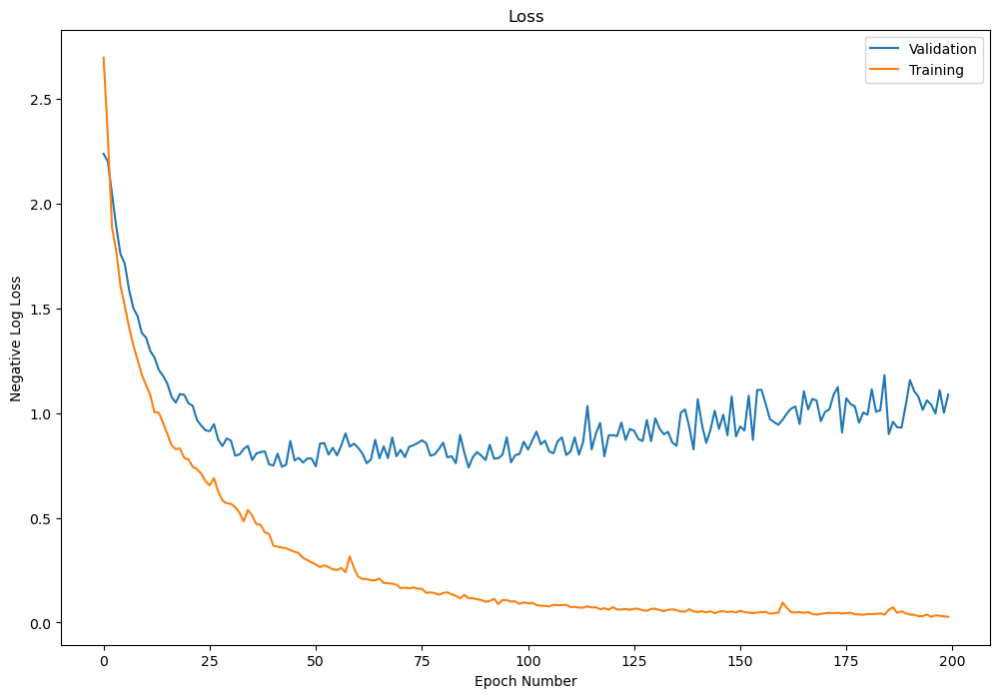


Peak Evaluation Accuracy: 92.5000%
Total Training Time: 559.3047s

Training and testing "our-net/log-mel/0/1/2/3"...
The size of an example dataset entry size is torch.Size([9, 2, 60, 41])
Weight initialisation complete.


Epoch: 1
	  > Mini-batch #0: 	Loss = 2.5734 	Accuracy = 31 / 200 (15.500%)
	  > Mini-batch #4: 	Loss = 4.1049 	Accuracy = 0 / 200 (0.000%)
	  > Mini-batch #8: 	Loss = 2.3300 	Accuracy = 18 / 200 (9.000%)
	  > Mini-batch #12: 	Loss = 2.2646 	Accuracy = 19 / 186 (10.215%)

	[Train] Time: 2.3	| Average Loss: 2.7432	| Accuracy: 224/2586 (8.662%)
	[Test]  Time: 0.57	| Average Loss: 2.2485	| Accuracy: 10/80 (12.500%)

Epoch: 2
	  > Mini-batch #0: 	Loss = 2.1390 	Accuracy = 35 / 200 (17.500%)
	  > Mini-batch #4: 	Loss = 2.7703 	Accuracy = 35 / 200 (17.500%)
	  > Mini-batch #8: 	Loss = 2.0036 	Accuracy = 61 / 200 (30.500%)
	  > Mini-batch #12: 	Loss = 1.9105 	Accuracy = 62 / 186 (33.333%)

	[Train] Time: 2.3	| Average Loss: 2.1268	| Accuracy: 587/2586 (22.699%)
	[Test]  Tim

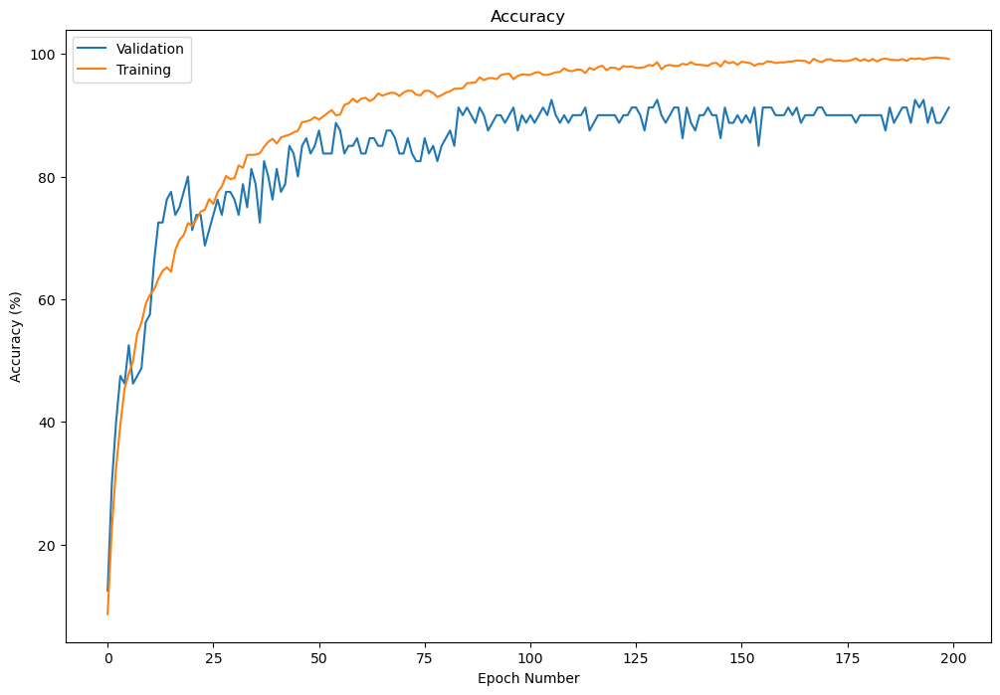

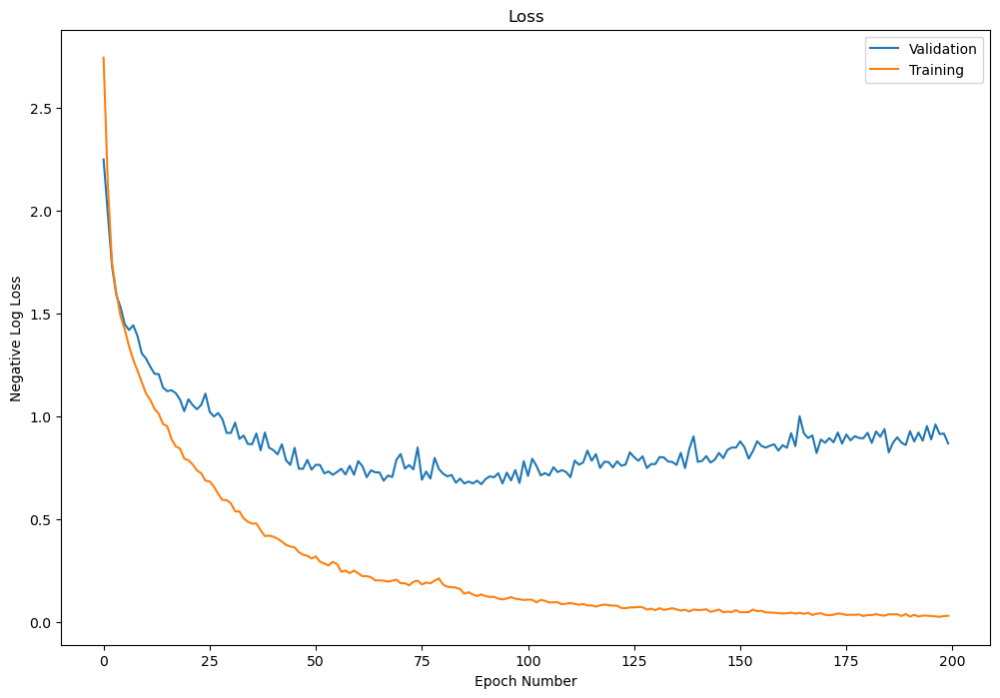


Peak Evaluation Accuracy: 92.5000%
Total Training Time: 567.8393s

Training and testing "our-net/log-mel/0/1/2/3/4"...
The size of an example dataset entry size is torch.Size([9, 2, 60, 41])
Weight initialisation complete.


Epoch: 1
	  > Mini-batch #0: 	Loss = 2.7420 	Accuracy = 17 / 200 (8.500%)
	  > Mini-batch #4: 	Loss = 3.5018 	Accuracy = 4 / 200 (2.000%)
	  > Mini-batch #8: 	Loss = 2.3296 	Accuracy = 25 / 200 (12.500%)
	  > Mini-batch #12: 	Loss = 2.1382 	Accuracy = 33 / 165 (20.000%)

	[Train] Time: 2.3	| Average Loss: 2.6795	| Accuracy: 301/2565 (11.735%)
	[Test]  Time: 0.60	| Average Loss: 2.4630	| Accuracy: 8/80 (10.000%)

Epoch: 2
	  > Mini-batch #0: 	Loss = 3.3694 	Accuracy = 4 / 200 (2.000%)
	  > Mini-batch #4: 	Loss = 1.8912 	Accuracy = 89 / 200 (44.500%)
	  > Mini-batch #8: 	Loss = 1.8991 	Accuracy = 56 / 200 (28.000%)
	  > Mini-batch #12: 	Loss = 2.0581 	Accuracy = 32 / 165 (19.394%)

	[Train] Time: 2.3	| Average Loss: 2.2166	| Accuracy: 548/2565 (21.365%)
	[Test]  Tim

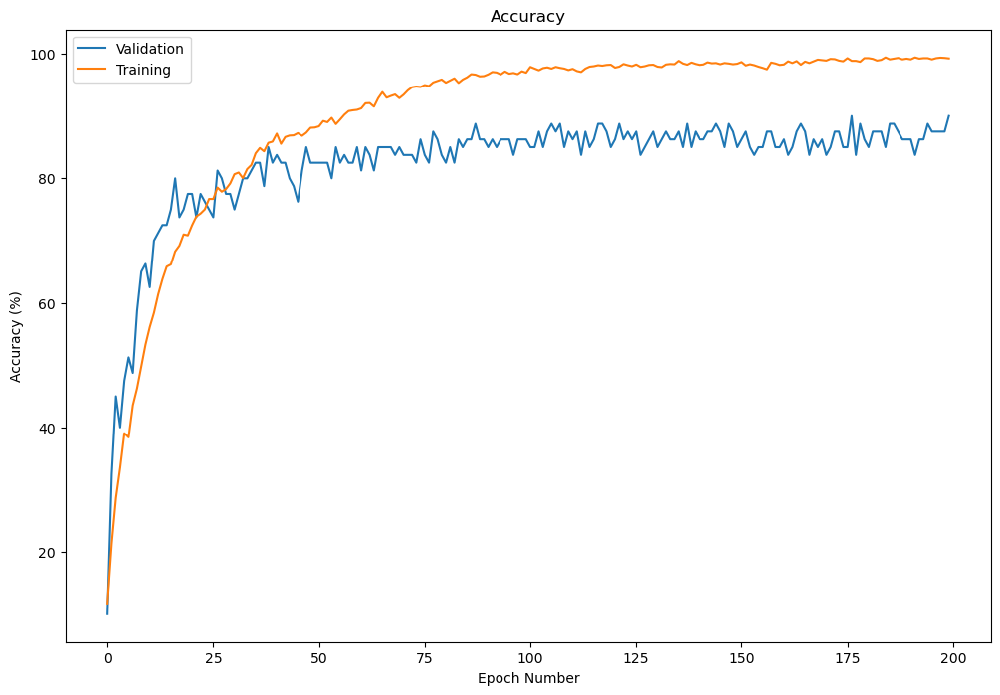

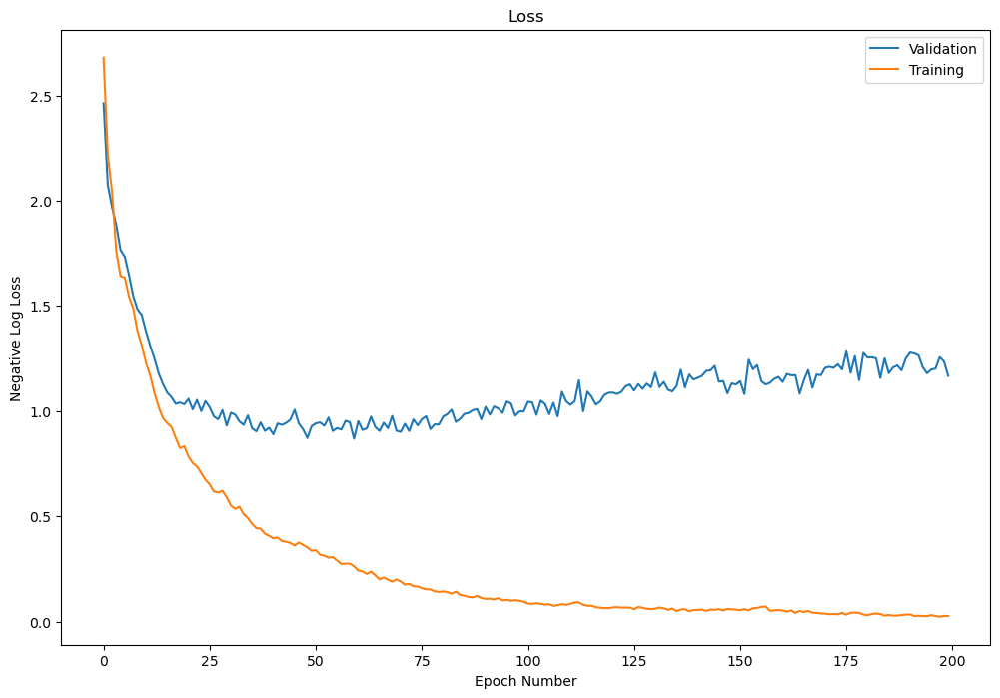


Peak Evaluation Accuracy: 90.0000%
Total Training Time: 561.3769s

Peak Accuracies: [81.25 91.25 92.5  92.5  90.  ]
Mean: 89.5
Std: 4.227884


In [73]:
with temporary_config():
    config.input_shape = (2, 60, 41)  # Piczak Short Segments
    config.epochs = 200

    dataset = EscLogMelSegmentDataset(esc10=True, long=False)

    model = OurNet(dataset.get_class_count())
    model = model.to(config.device)

    input_type: InputType = "ensemble"

    cross_validate(dataset, model, input_type, "our-net/log-mel")

#### OurNet + TEO-GTSC

ESC Dataset: Found cache for fold-0 at '.cache\esc10\teo-gtsc\seg-short-test\fold-0': sample count = 80
ESC Dataset: Found cache for fold-1 at '.cache\esc10\teo-gtsc\seg-short-test\fold-1': sample count = 80
ESC Dataset: Found cache for fold-2 at '.cache\esc10\teo-gtsc\seg-short-test\fold-2': sample count = 80
ESC Dataset: Found cache for fold-3 at '.cache\esc10\teo-gtsc\seg-short-test\fold-3': sample count = 80
ESC Dataset: Found cache for fold-4 at '.cache\esc10\teo-gtsc\seg-short-test\fold-4': sample count = 80
ESC Dataset: Found cache for fold-0 at '.cache\esc10\teo-gtsc\seg-short\fold-0': sample count = 629
ESC Dataset: Found cache for fold-1 at '.cache\esc10\teo-gtsc\seg-short\fold-1': sample count = 641
ESC Dataset: Found cache for fold-2 at '.cache\esc10\teo-gtsc\seg-short\fold-2': sample count = 648
ESC Dataset: Found cache for fold-3 at '.cache\esc10\teo-gtsc\seg-short\fold-3': sample count = 636
ESC Dataset: Found cache for fold-4 at '.cache\esc10\teo-gtsc\seg-short\fold-4':

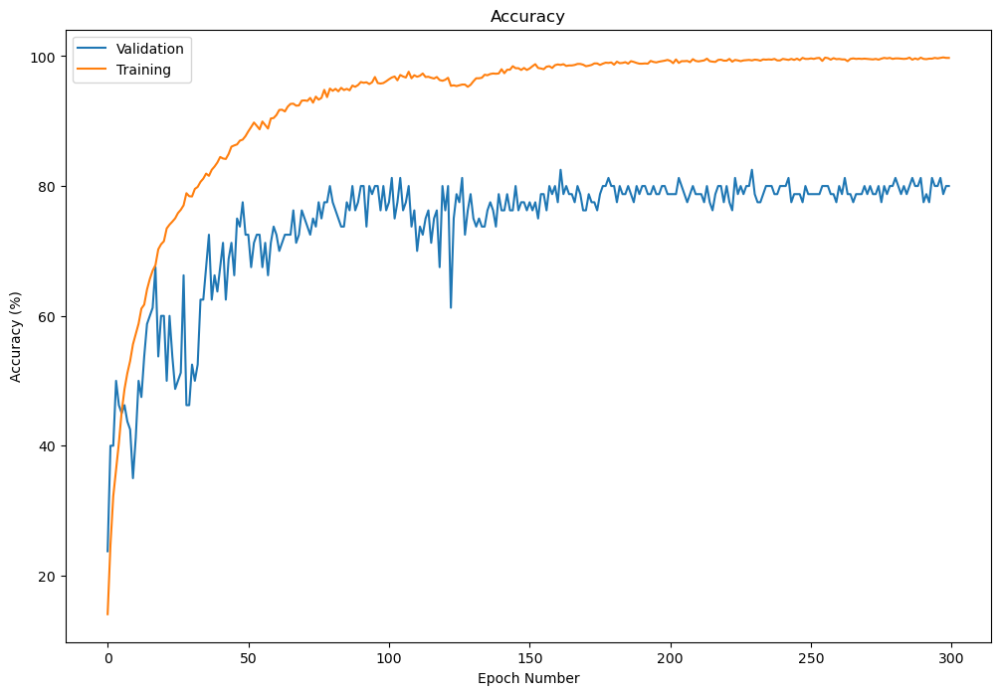

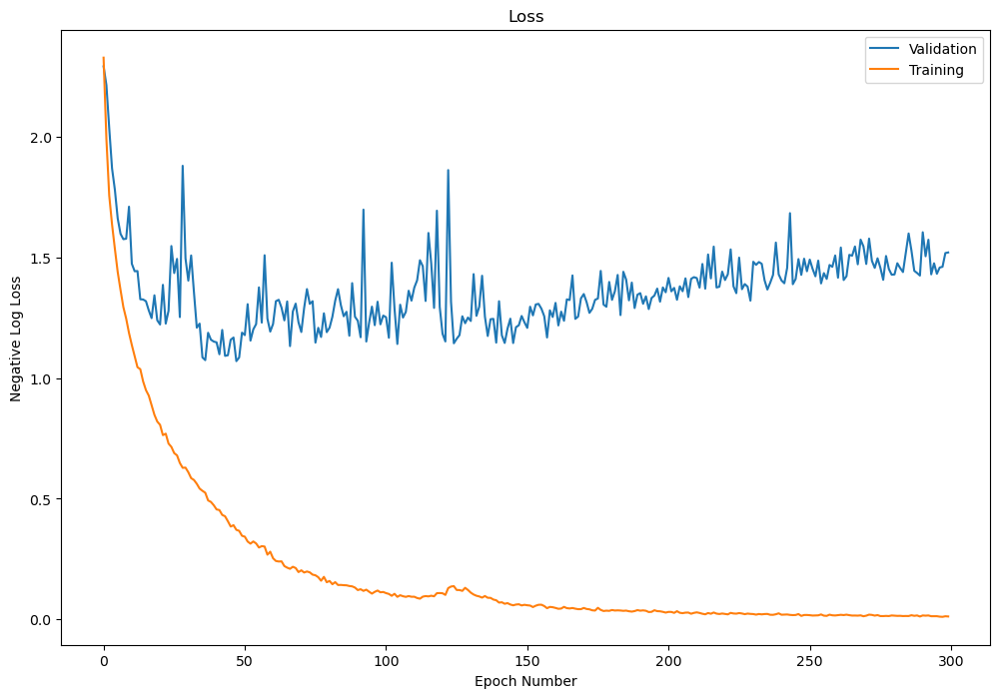


Peak Evaluation Accuracy: 82.5000%
Total Training Time: 1778.1603s

Training and testing "our-net/teo-gtsc/pure/0/1"...
The size of an example dataset entry size is torch.Size([9, 2, 60, 41])
Weight initialisation complete.


Epoch: 1
	  > Mini-batch #0: 	Loss = 2.3037 	Accuracy = 25 / 200 (12.500%)
	  > Mini-batch #4: 	Loss = 2.5070 	Accuracy = 18 / 200 (9.000%)
	  > Mini-batch #8: 	Loss = 2.0636 	Accuracy = 53 / 200 (26.500%)
	  > Mini-batch #12: 	Loss = 2.1069 	Accuracy = 41 / 170 (24.118%)

	[Train] Time: 4.8	| Average Loss: 2.2815	| Accuracy: 406/2570 (15.798%)
	[Test]  Time: 1.05	| Average Loss: 2.1855	| Accuracy: 12/80 (15.000%)

Epoch: 2
	  > Mini-batch #0: 	Loss = 2.0255 	Accuracy = 22 / 200 (11.000%)
	  > Mini-batch #4: 	Loss = 1.9869 	Accuracy = 52 / 200 (26.000%)
	  > Mini-batch #8: 	Loss = 1.8754 	Accuracy = 59 / 200 (29.500%)
	  > Mini-batch #12: 	Loss = 1.8241 	Accuracy = 53 / 170 (31.176%)

	[Train] Time: 5.1	| Average Loss: 1.8741	| Accuracy: 684/2570 (26.615%)
	[Test

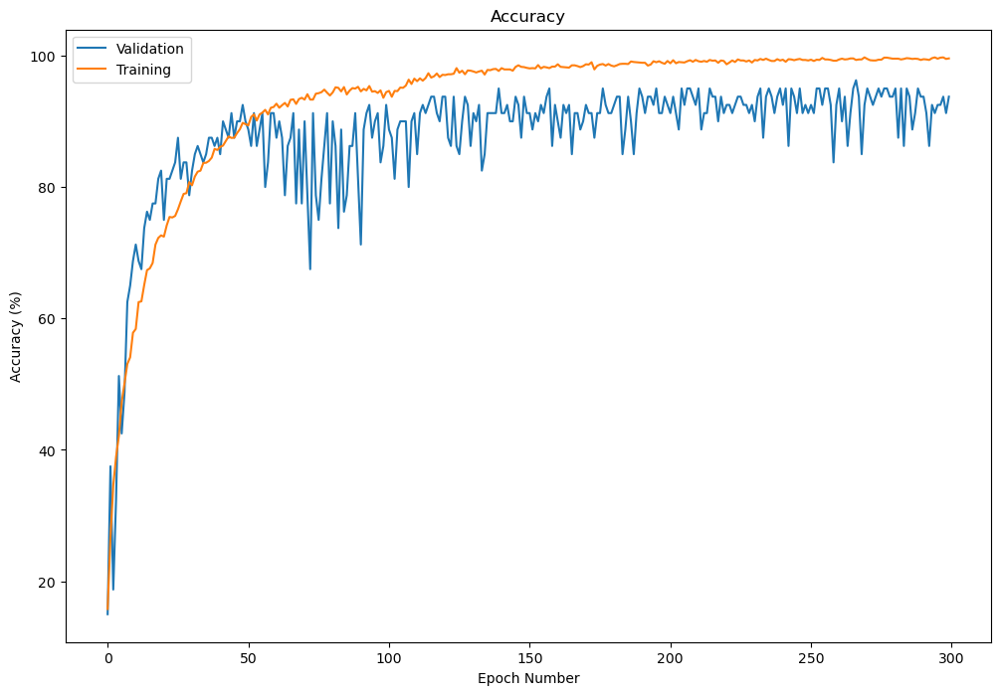

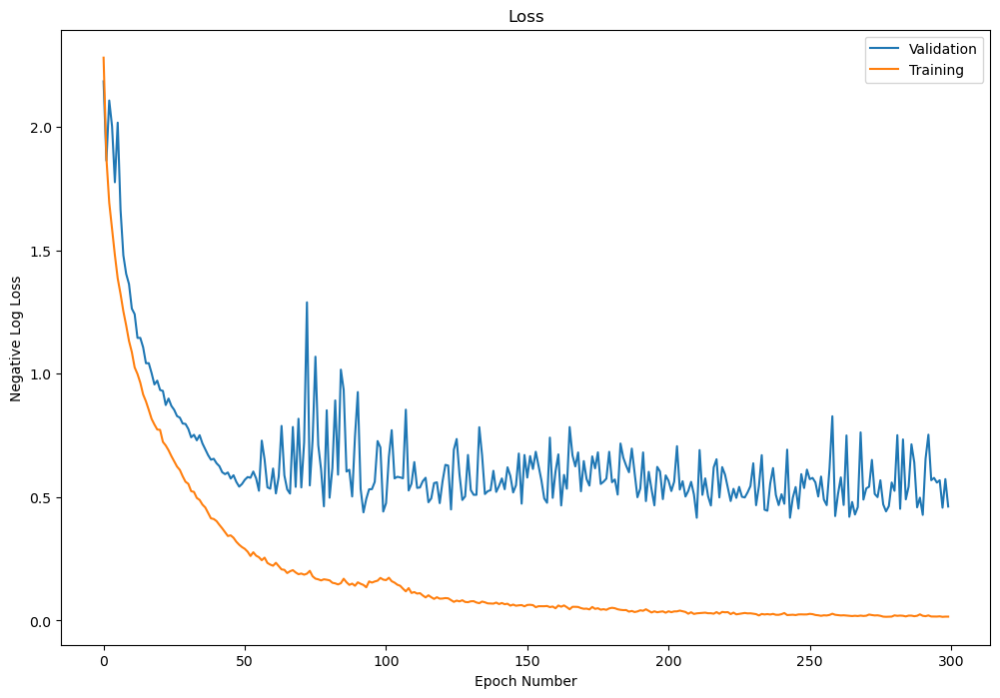


Peak Evaluation Accuracy: 96.2500%
Total Training Time: 1789.7247s

Training and testing "our-net/teo-gtsc/pure/0/1/2"...
The size of an example dataset entry size is torch.Size([9, 2, 60, 41])
Weight initialisation complete.


Epoch: 1
	  > Mini-batch #0: 	Loss = 2.3317 	Accuracy = 15 / 200 (7.500%)
	  > Mini-batch #4: 	Loss = 2.3173 	Accuracy = 18 / 200 (9.000%)
	  > Mini-batch #8: 	Loss = 2.3149 	Accuracy = 18 / 200 (9.000%)
	  > Mini-batch #12: 	Loss = 2.1771 	Accuracy = 12 / 163 (7.362%)

	[Train] Time: 4.6	| Average Loss: 2.3512	| Accuracy: 254/2563 (9.910%)
	[Test]  Time: 1.19	| Average Loss: 2.2023	| Accuracy: 17/80 (21.250%)

Epoch: 2
	  > Mini-batch #0: 	Loss = 2.0326 	Accuracy = 39 / 200 (19.500%)
	  > Mini-batch #4: 	Loss = 1.8225 	Accuracy = 69 / 200 (34.500%)
	  > Mini-batch #8: 	Loss = 1.9118 	Accuracy = 57 / 200 (28.500%)
	  > Mini-batch #12: 	Loss = 1.9013 	Accuracy = 27 / 163 (16.564%)

	[Train] Time: 4.8	| Average Loss: 1.9470	| Accuracy: 638/2563 (24.893%)
	[Test] 

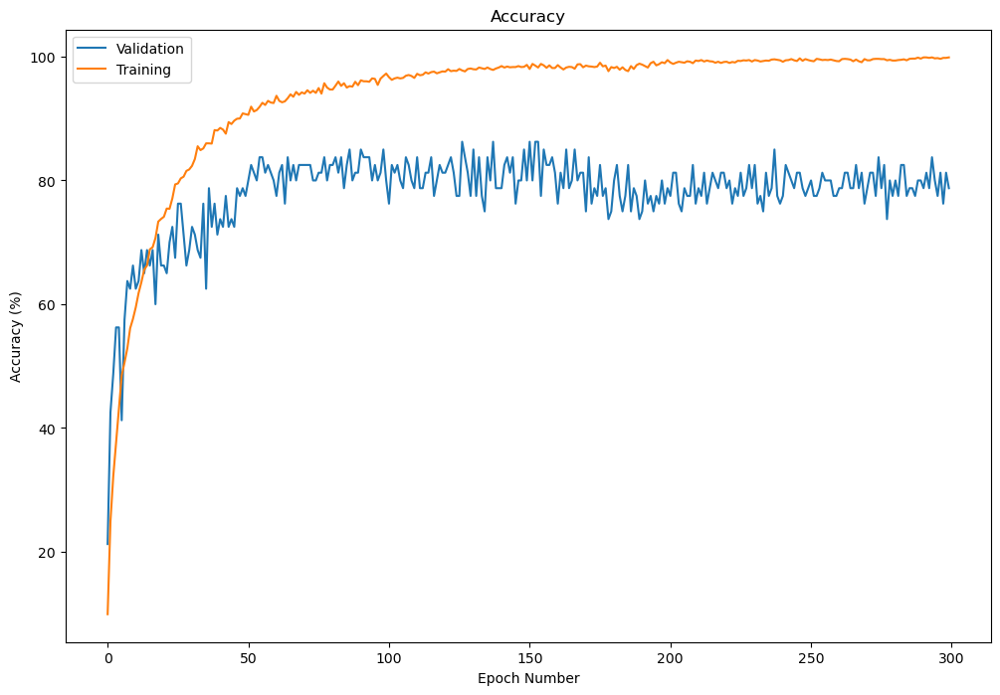

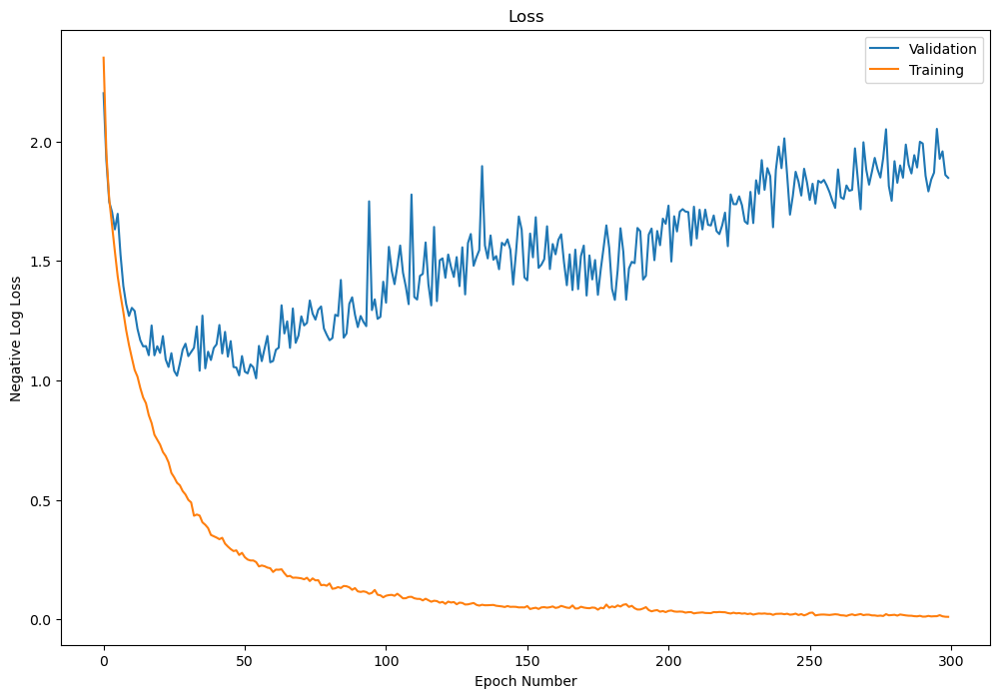


Peak Evaluation Accuracy: 86.2500%
Total Training Time: 1766.1624s

Training and testing "our-net/teo-gtsc/pure/0/1/2/3"...
The size of an example dataset entry size is torch.Size([9, 2, 60, 41])
Weight initialisation complete.


Epoch: 1
	  > Mini-batch #0: 	Loss = 2.2167 	Accuracy = 36 / 200 (18.000%)
	  > Mini-batch #4: 	Loss = 2.3348 	Accuracy = 39 / 200 (19.500%)
	  > Mini-batch #8: 	Loss = 2.2271 	Accuracy = 30 / 200 (15.000%)
	  > Mini-batch #12: 	Loss = 2.1719 	Accuracy = 18 / 175 (10.286%)

	[Train] Time: 4.8	| Average Loss: 2.3404	| Accuracy: 329/2575 (12.777%)
	[Test]  Time: 1.14	| Average Loss: 2.1601	| Accuracy: 14/80 (17.500%)

Epoch: 2
	  > Mini-batch #0: 	Loss = 1.9630 	Accuracy = 54 / 200 (27.000%)
	  > Mini-batch #4: 	Loss = 1.6779 	Accuracy = 80 / 200 (40.000%)
	  > Mini-batch #8: 	Loss = 1.7906 	Accuracy = 67 / 200 (33.500%)
	  > Mini-batch #12: 	Loss = 1.8711 	Accuracy = 34 / 175 (19.429%)

	[Train] Time: 4.6	| Average Loss: 1.9027	| Accuracy: 724/2575 (28.117%)
	

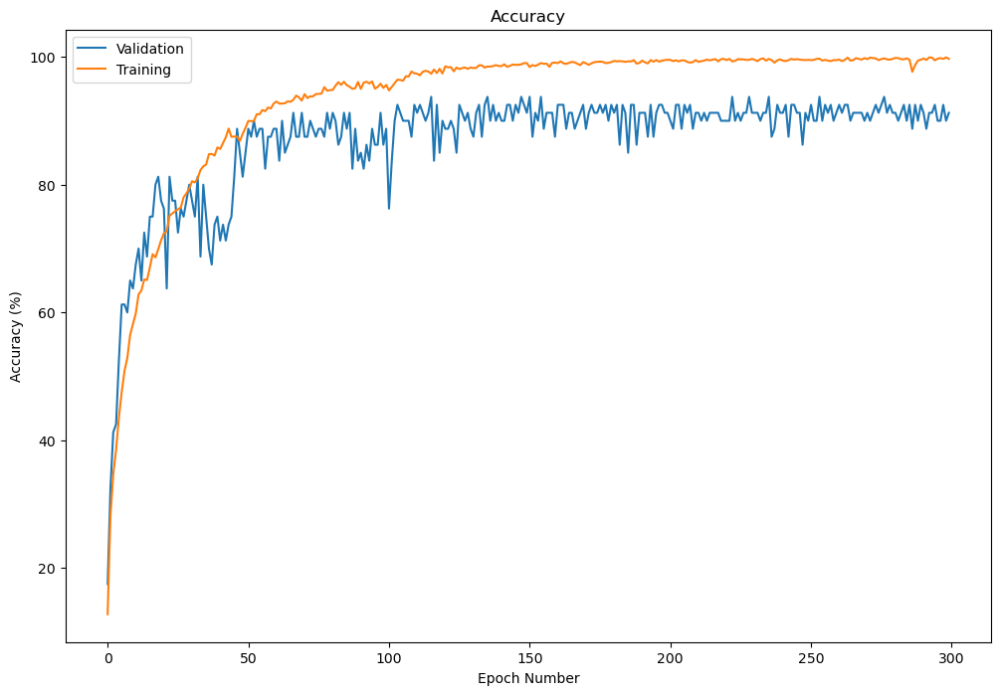

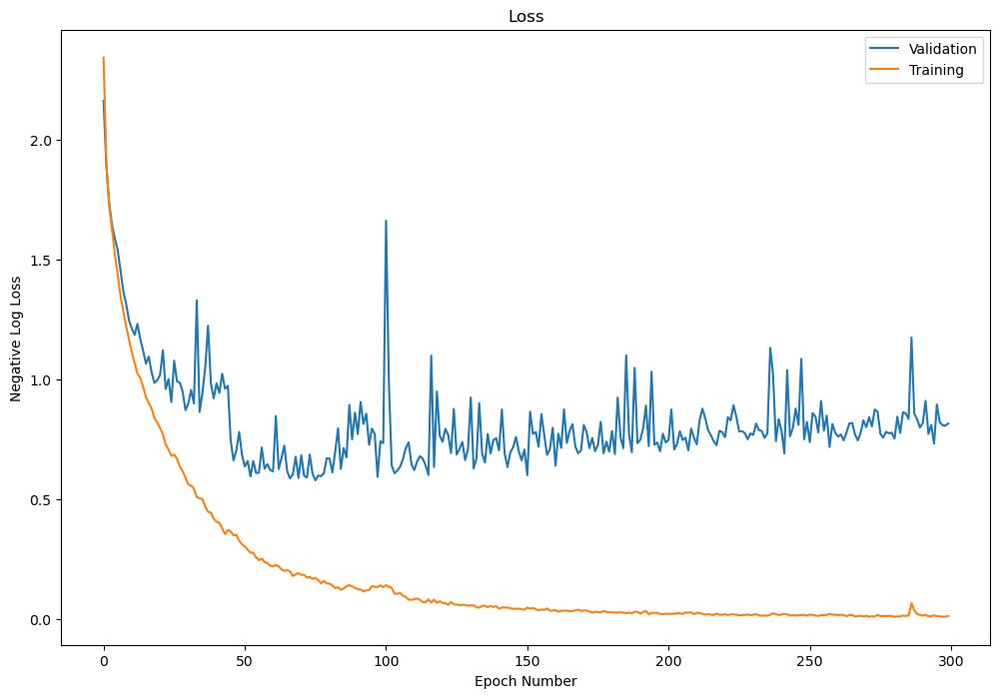


Peak Evaluation Accuracy: 93.7500%
Total Training Time: 1759.2712s

Training and testing "our-net/teo-gtsc/pure/0/1/2/3/4"...
The size of an example dataset entry size is torch.Size([9, 2, 60, 41])
Weight initialisation complete.


Epoch: 1
	  > Mini-batch #0: 	Loss = 2.5025 	Accuracy = 7 / 200 (3.500%)
	  > Mini-batch #4: 	Loss = 2.3832 	Accuracy = 15 / 200 (7.500%)
	  > Mini-batch #8: 	Loss = 2.2007 	Accuracy = 24 / 200 (12.000%)
	  > Mini-batch #12: 	Loss = 2.2090 	Accuracy = 13 / 154 (8.442%)

	[Train] Time: 4.9	| Average Loss: 2.3580	| Accuracy: 270/2554 (10.572%)
	[Test]  Time: 1.21	| Average Loss: 2.1907	| Accuracy: 13/80 (16.250%)

Epoch: 2
	  > Mini-batch #0: 	Loss = 2.0240 	Accuracy = 51 / 200 (25.500%)
	  > Mini-batch #4: 	Loss = 1.7111 	Accuracy = 59 / 200 (29.500%)
	  > Mini-batch #8: 	Loss = 1.7487 	Accuracy = 86 / 200 (43.000%)
	  > Mini-batch #12: 	Loss = 1.9820 	Accuracy = 14 / 154 (9.091%)

	[Train] Time: 4.9	| Average Loss: 1.9328	| Accuracy: 644/2554 (25.215%)
	[Te

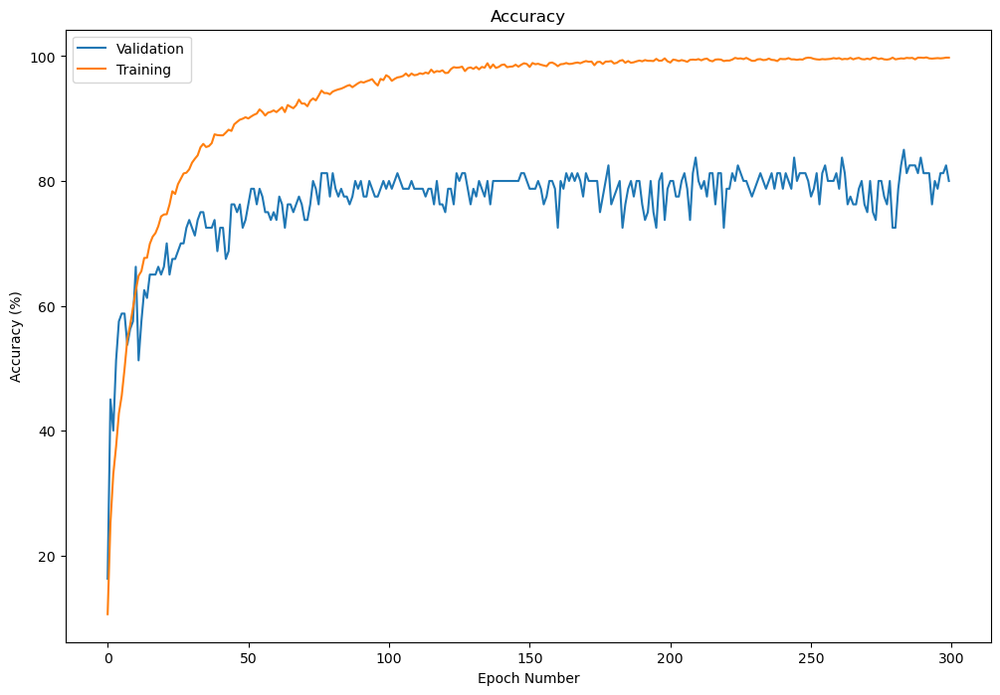

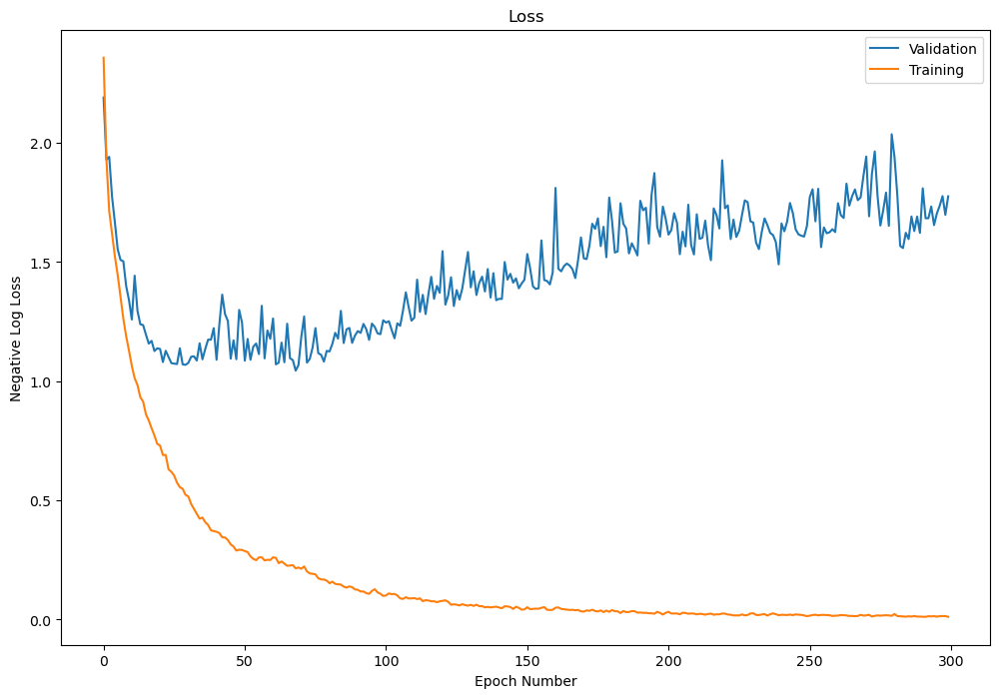


Peak Evaluation Accuracy: 85.0000%
Total Training Time: 1788.2076s

Peak Accuracies: [82.5  96.25 86.25 93.75 85.  ]
Mean: 88.75
Std: 5.303301


In [39]:
with temporary_config():
    config.input_shape = (2, 60, 41)  # Piczak Short Segments
    config.epochs = 300

    dataset = EscPureTeoGtscDataset(esc10=True, long=False)

    model = OurNet(dataset.get_class_count())
    model = model.to(config.device)

    input_type: InputType = "ensemble"

    cross_validate(dataset, model, input_type, "our-net/teo-gtsc/pure")

#### OurNet + Fused TEO-GTSC

ESC Dataset: Found cache for fold-0 at '.cache/esc10/gtsc/seg-short-test/fold-0': sample count = 80
ESC Dataset: Found cache for fold-1 at '.cache/esc10/gtsc/seg-short-test/fold-1': sample count = 80
ESC Dataset: Found cache for fold-2 at '.cache/esc10/gtsc/seg-short-test/fold-2': sample count = 80
ESC Dataset: Found cache for fold-3 at '.cache/esc10/gtsc/seg-short-test/fold-3': sample count = 80
ESC Dataset: Found cache for fold-4 at '.cache/esc10/gtsc/seg-short-test/fold-4': sample count = 80
ESC Dataset: Found cache for fold-0 at '.cache/esc10/gtsc/seg-short/fold-0': sample count = 641
ESC Dataset: Found cache for fold-1 at '.cache/esc10/gtsc/seg-short/fold-1': sample count = 660
ESC Dataset: Found cache for fold-2 at '.cache/esc10/gtsc/seg-short/fold-2': sample count = 662
ESC Dataset: Found cache for fold-3 at '.cache/esc10/gtsc/seg-short/fold-3': sample count = 658
ESC Dataset: Found cache for fold-4 at '.cache/esc10/gtsc/seg-short/fold-4': sample count = 675
Training and testing

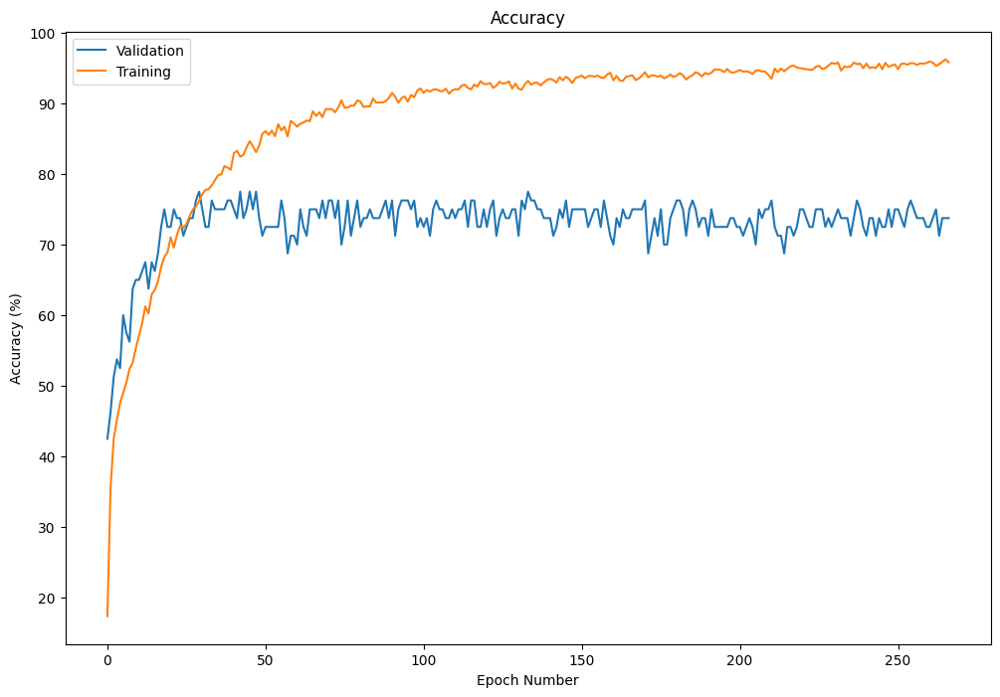

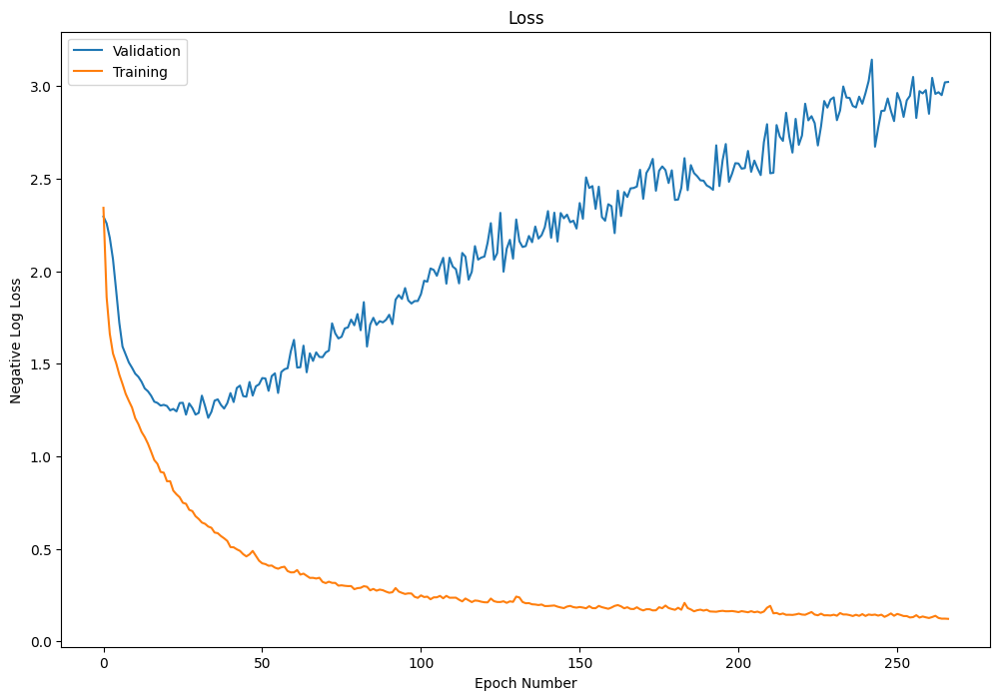


Peak Evaluation Accuracy: 77.5000%
Total Training Time: 801.2752s

Training and testing "our-net/teo-gtsc/fused/1"...
The size of an example dataset entry size is torch.Size([9, 2, 60, 41])
Weight initialisation complete.


Epoch: 1
	  > Mini-batch #0: 	Loss = 2.5261 	Accuracy = 5 / 200 (2.500%)
	  > Mini-batch #4: 	Loss = 2.6759 	Accuracy = 2 / 200 (1.000%)
	  > Mini-batch #8: 	Loss = 1.9995 	Accuracy = 72 / 200 (36.000%)
	  > Mini-batch #12: 	Loss = 1.9696 	Accuracy = 56 / 200 (28.000%)

	[Train] Time: 2.4	| Average Loss: 2.3222	| Accuracy: 454/2636 (17.223%)
	[Test]  Time: 0.59	| Average Loss: 2.0984	| Accuracy: 22/80 (27.500%)

Epoch: 2
	  > Mini-batch #0: 	Loss = 2.2848 	Accuracy = 19 / 200 (9.500%)
	  > Mini-batch #4: 	Loss = 1.9130 	Accuracy = 77 / 200 (38.500%)
	  > Mini-batch #8: 	Loss = 1.4907 	Accuracy = 114 / 200 (57.000%)
	  > Mini-batch #12: 	Loss = 1.6063 	Accuracy = 81 / 200 (40.500%)

	[Train] Time: 2.4	| Average Loss: 1.8239	| Accuracy: 908/2636 (34.446%)
	[Test]  Ti

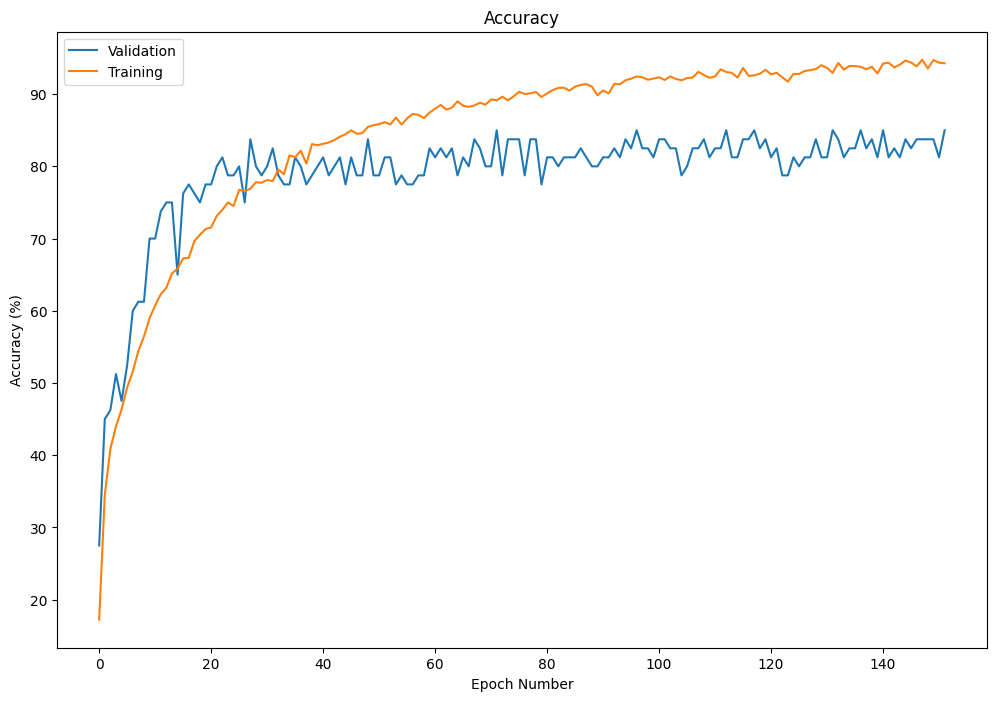

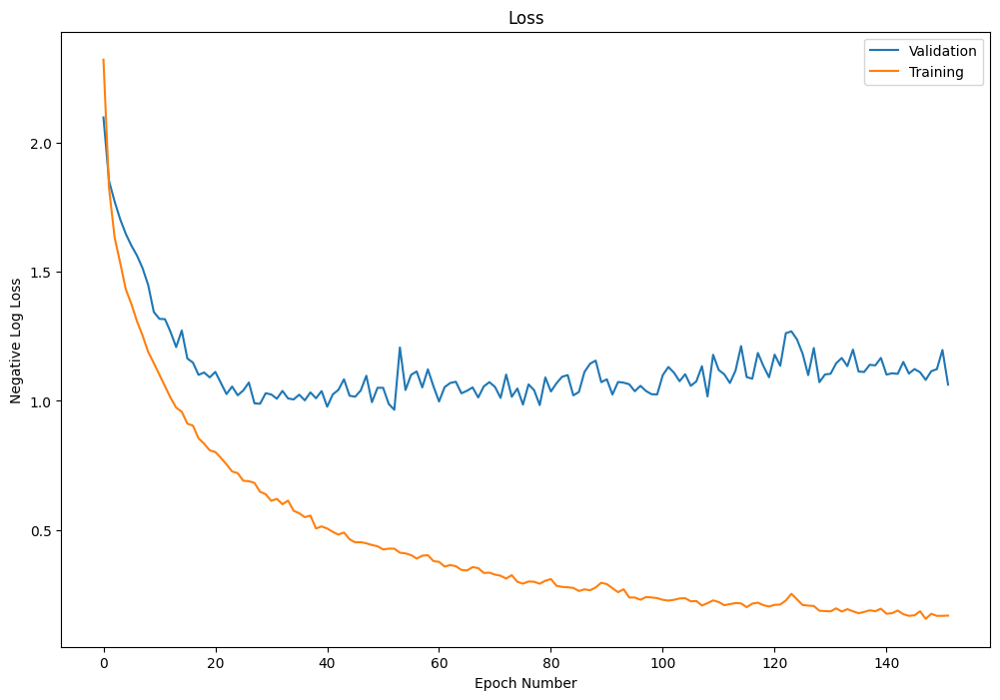


Peak Evaluation Accuracy: 85.0000%
Total Training Time: 454.4362s

Training and testing "our-net/teo-gtsc/fused/2"...
The size of an example dataset entry size is torch.Size([9, 2, 60, 41])
Weight initialisation complete.


Epoch: 1
	  > Mini-batch #0: 	Loss = 2.5123 	Accuracy = 16 / 200 (8.000%)
	  > Mini-batch #4: 	Loss = 2.5609 	Accuracy = 33 / 200 (16.500%)
	  > Mini-batch #8: 	Loss = 2.3777 	Accuracy = 27 / 200 (13.500%)
	  > Mini-batch #12: 	Loss = 2.1804 	Accuracy = 34 / 200 (17.000%)

	[Train] Time: 2.4	| Average Loss: 2.3843	| Accuracy: 389/2634 (14.768%)
	[Test]  Time: 0.60	| Average Loss: 2.1305	| Accuracy: 23/80 (28.750%)

Epoch: 2
	  > Mini-batch #0: 	Loss = 2.2650 	Accuracy = 16 / 200 (8.000%)
	  > Mini-batch #4: 	Loss = 1.9829 	Accuracy = 51 / 200 (25.500%)
	  > Mini-batch #8: 	Loss = 1.6326 	Accuracy = 114 / 200 (57.000%)
	  > Mini-batch #12: 	Loss = 1.7475 	Accuracy = 70 / 200 (35.000%)

	[Train] Time: 2.4	| Average Loss: 1.8739	| Accuracy: 845/2634 (32.080%)
	[Test] 

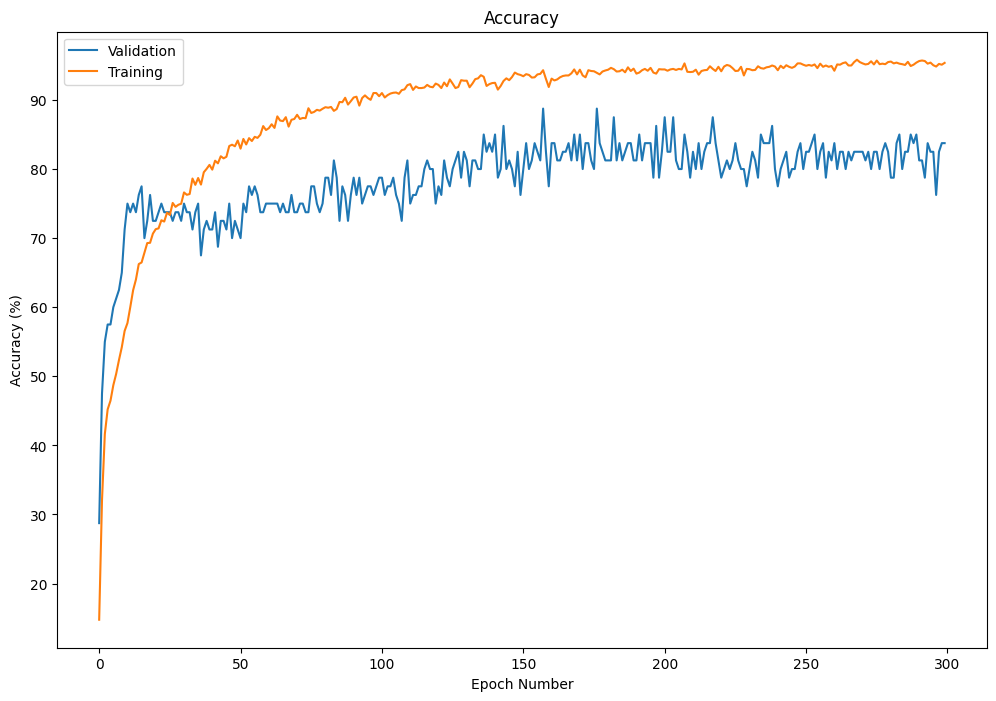

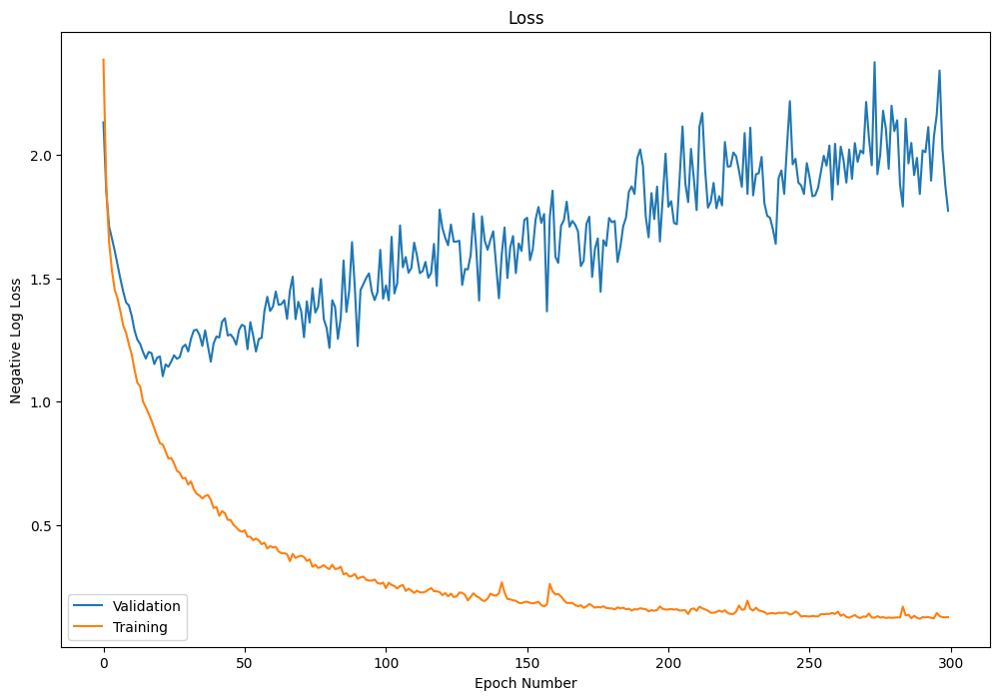


Peak Evaluation Accuracy: 88.7500%
Total Training Time: 900.4098s

Training and testing "our-net/teo-gtsc/fused/3"...
The size of an example dataset entry size is torch.Size([9, 2, 60, 41])
Weight initialisation complete.


Epoch: 1
	  > Mini-batch #0: 	Loss = 2.4188 	Accuracy = 13 / 200 (6.500%)
	  > Mini-batch #4: 	Loss = 2.4813 	Accuracy = 27 / 200 (13.500%)
	  > Mini-batch #8: 	Loss = 2.1232 	Accuracy = 34 / 200 (17.000%)
	  > Mini-batch #12: 	Loss = 2.2663 	Accuracy = 21 / 200 (10.500%)

	[Train] Time: 2.4	| Average Loss: 2.3550	| Accuracy: 330/2638 (12.509%)
	[Test]  Time: 0.59	| Average Loss: 2.1544	| Accuracy: 30/80 (37.500%)

Epoch: 2
	  > Mini-batch #0: 	Loss = 2.2270 	Accuracy = 22 / 200 (11.000%)
	  > Mini-batch #4: 	Loss = 2.0777 	Accuracy = 47 / 200 (23.500%)
	  > Mini-batch #8: 	Loss = 1.7662 	Accuracy = 76 / 200 (38.000%)
	  > Mini-batch #12: 	Loss = 1.7821 	Accuracy = 65 / 200 (32.500%)

	[Train] Time: 2.4	| Average Loss: 1.9333	| Accuracy: 790/2638 (29.947%)
	[Test] 

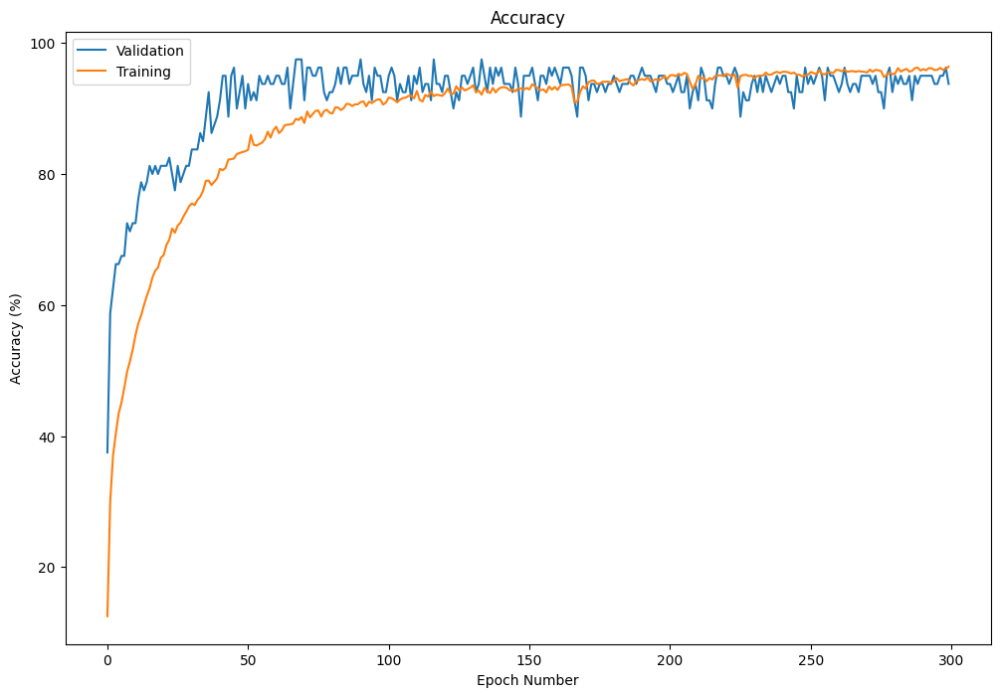

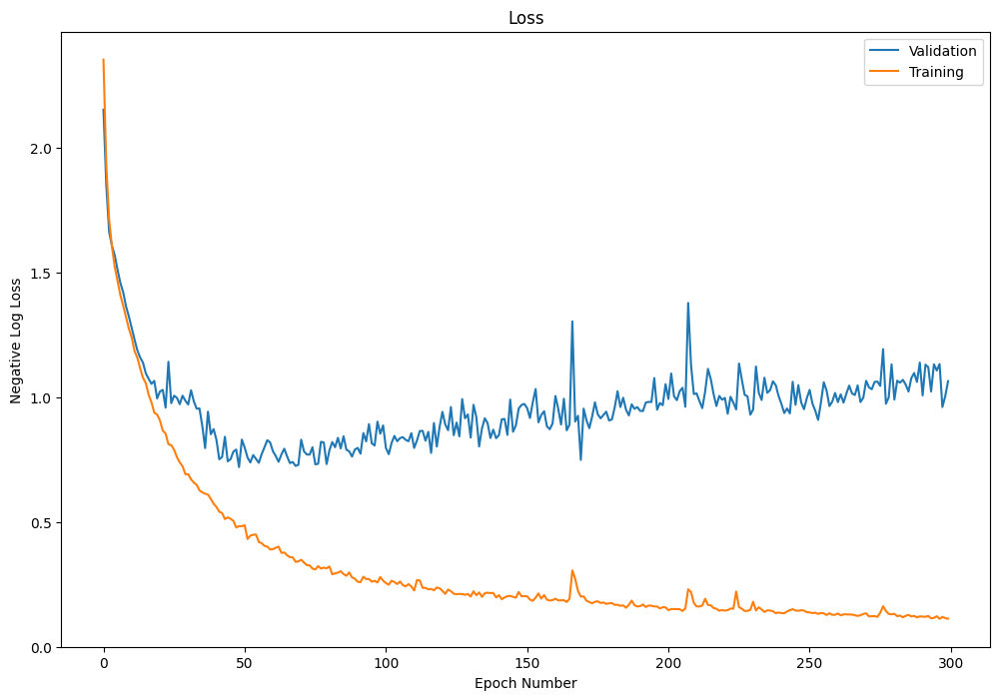


Peak Evaluation Accuracy: 97.5000%
Total Training Time: 897.2926s

Training and testing "our-net/teo-gtsc/fused/4"...
The size of an example dataset entry size is torch.Size([9, 2, 60, 41])
Weight initialisation complete.


Epoch: 1
	  > Mini-batch #0: 	Loss = 2.2799 	Accuracy = 44 / 200 (22.000%)
	  > Mini-batch #4: 	Loss = 2.5563 	Accuracy = 41 / 200 (20.500%)
	  > Mini-batch #8: 	Loss = 2.1387 	Accuracy = 36 / 200 (18.000%)
	  > Mini-batch #12: 	Loss = 2.1828 	Accuracy = 17 / 200 (8.500%)

	[Train] Time: 3.5	| Average Loss: 2.4111	| Accuracy: 360/2621 (13.735%)
	[Test]  Time: 0.62	| Average Loss: 2.1597	| Accuracy: 27/80 (33.750%)

Epoch: 2
	  > Mini-batch #0: 	Loss = 2.1087 	Accuracy = 48 / 200 (24.000%)
	  > Mini-batch #4: 	Loss = 2.0111 	Accuracy = 43 / 200 (21.500%)
	  > Mini-batch #8: 	Loss = 1.7366 	Accuracy = 83 / 200 (41.500%)
	  > Mini-batch #12: 	Loss = 1.8968 	Accuracy = 62 / 200 (31.000%)

	[Train] Time: 2.4	| Average Loss: 1.9838	| Accuracy: 752/2621 (28.691%)
	[Test] 

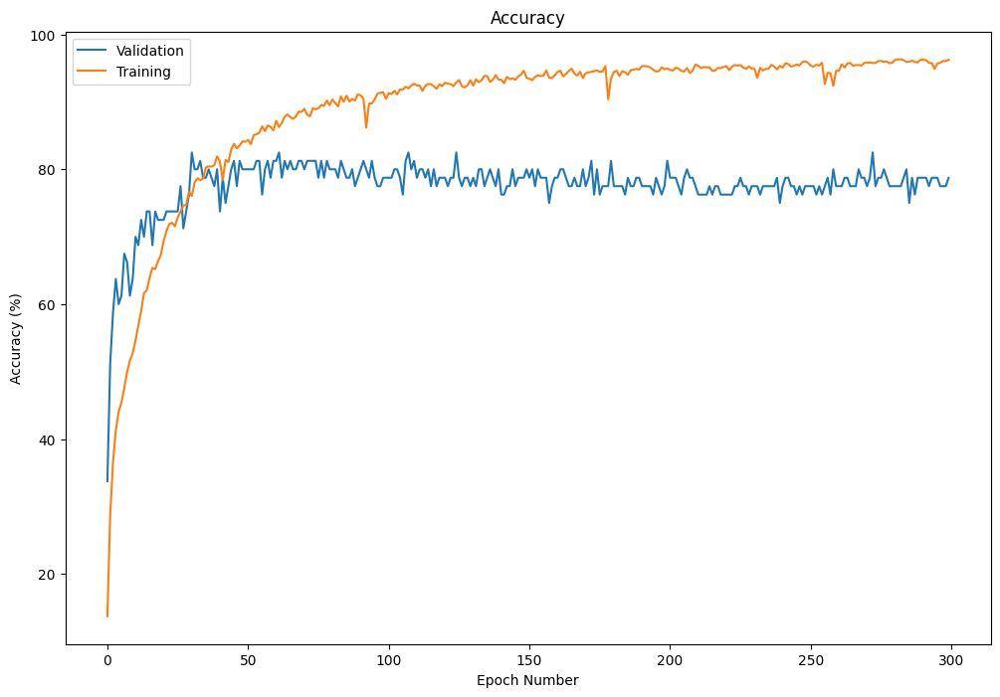

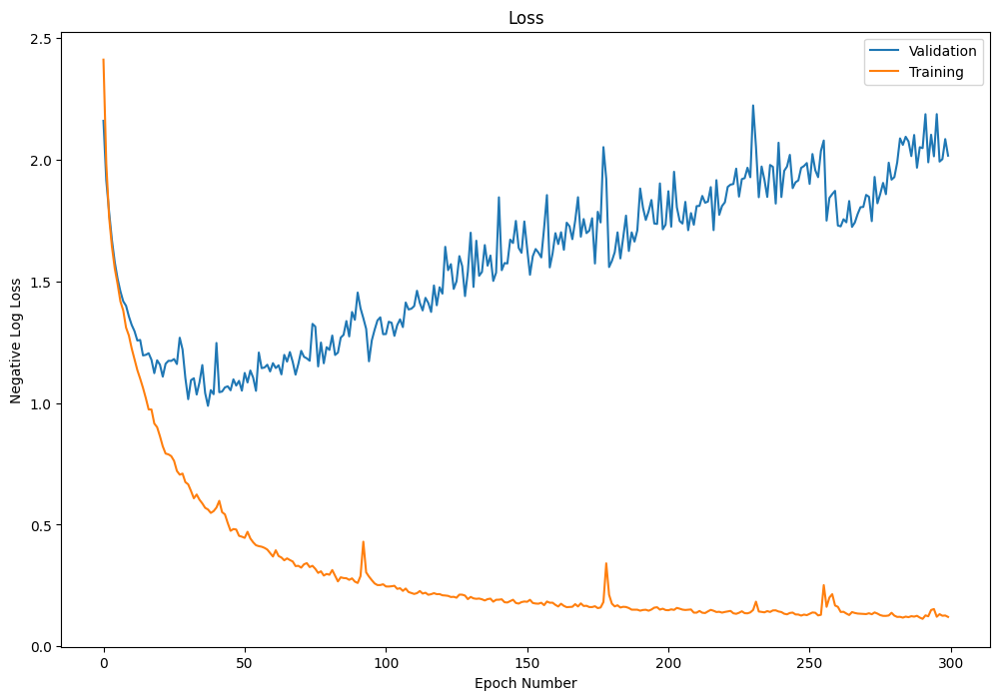


Peak Evaluation Accuracy: 82.5000%
Total Training Time: 896.9402s

Peak Accuracies: [77.5  85.   88.75 97.5  82.5 ]
Mean: 86.25
Std: 6.708204


In [109]:
with temporary_config():
    config.input_shape = (2, 60, 41)  # Piczak Short Segments

    dataset = EscFusedTeoGtscDataset(esc10=True)

    model = OurNet(dataset.get_class_count())
    model = model.to(config.device)

    input_type: InputType = "ensemble"

    cross_validate(dataset, model, input_type, "our-net/teo-gtsc/fused")

> Less important

#### Piczak Augmentation

Due to the nature of the task, we stopped the training around 60 epochs since its enough to show that it does not work out (and it takes too long to train).


Repo card metadata block was not found. Setting CardData to empty.


Preprocess: audio resampled to 22050Hz (110250 frames)
Preprocessing: cleaned dataset has 400 samples(test dataset = True).


Map (num_proc=12):   0%|          | 0/400 [00:00<?, ? examples/s]

Filter (num_proc=12):   0%|          | 0/400 [00:00<?, ? examples/s]

Saving the dataset (0/1 shards):   0%|          | 0/80 [00:00<?, ? examples/s]

ESC Dataset: Saved fold-0 to '.cache/esc10/log-mel-aug-10/seg-short-test/fold-0'.


Filter (num_proc=12):   0%|          | 0/400 [00:00<?, ? examples/s]

Saving the dataset (0/1 shards):   0%|          | 0/80 [00:00<?, ? examples/s]

ESC Dataset: Saved fold-1 to '.cache/esc10/log-mel-aug-10/seg-short-test/fold-1'.


Filter (num_proc=12):   0%|          | 0/400 [00:00<?, ? examples/s]

Saving the dataset (0/1 shards):   0%|          | 0/80 [00:00<?, ? examples/s]

ESC Dataset: Saved fold-2 to '.cache/esc10/log-mel-aug-10/seg-short-test/fold-2'.


Filter (num_proc=12):   0%|          | 0/400 [00:00<?, ? examples/s]

Saving the dataset (0/1 shards):   0%|          | 0/80 [00:00<?, ? examples/s]

ESC Dataset: Saved fold-3 to '.cache/esc10/log-mel-aug-10/seg-short-test/fold-3'.


Filter (num_proc=12):   0%|          | 0/400 [00:00<?, ? examples/s]

Saving the dataset (0/1 shards):   0%|          | 0/80 [00:00<?, ? examples/s]

ESC Dataset: Saved fold-4 to '.cache/esc10/log-mel-aug-10/seg-short-test/fold-4'.


Repo card metadata block was not found. Setting CardData to empty.


Preprocess: audio resampled to 22050Hz (110250 frames)
Preprocessing: cleaned dataset has 400 samples(test dataset = False).


Map (num_proc=12):   0%|          | 0/400 [00:00<?, ? examples/s]

Filter (num_proc=12):   0%|          | 0/38417 [00:00<?, ? examples/s]

Saving the dataset (0/1 shards):   0%|          | 0/7549 [00:00<?, ? examples/s]

ESC Dataset: Saved fold-0 to '.cache/esc10/log-mel-aug-10/seg-short/fold-0'.


Filter (num_proc=12):   0%|          | 0/38417 [00:00<?, ? examples/s]

Saving the dataset (0/1 shards):   0%|          | 0/7757 [00:00<?, ? examples/s]

ESC Dataset: Saved fold-1 to '.cache/esc10/log-mel-aug-10/seg-short/fold-1'.


Filter (num_proc=12):   0%|          | 0/38417 [00:00<?, ? examples/s]

Saving the dataset (0/1 shards):   0%|          | 0/7636 [00:00<?, ? examples/s]

ESC Dataset: Saved fold-2 to '.cache/esc10/log-mel-aug-10/seg-short/fold-2'.


Filter (num_proc=12):   0%|          | 0/38417 [00:00<?, ? examples/s]

Saving the dataset (0/1 shards):   0%|          | 0/7628 [00:00<?, ? examples/s]

ESC Dataset: Saved fold-3 to '.cache/esc10/log-mel-aug-10/seg-short/fold-3'.


Filter (num_proc=12):   0%|          | 0/38417 [00:00<?, ? examples/s]

Saving the dataset (0/1 shards):   0%|          | 0/7847 [00:00<?, ? examples/s]

ESC Dataset: Saved fold-4 to '.cache/esc10/log-mel-aug-10/seg-short/fold-4'.
Training and testing "piczak/static-aug/log-mel/shory"...
The size of an example dataset entry size is torch.Size([9, 2, 60, 41])
Weight initialisation complete.


Epoch: 1
	  > Mini-batch #0: 	Loss = 2.5664 	Accuracy = 9 / 200 (4.500%)
	  > Mini-batch #4: 	Loss = 2.6509 	Accuracy = 102 / 200 (51.000%)
	  > Mini-batch #8: 	Loss = 6.4311 	Accuracy = 66 / 200 (33.000%)
	  > Mini-batch #12: 	Loss = 2.3567 	Accuracy = 0 / 200 (0.000%)
	  > Mini-batch #16: 	Loss = 2.4078 	Accuracy = 0 / 200 (0.000%)
	  > Mini-batch #20: 	Loss = 2.3136 	Accuracy = 0 / 200 (0.000%)
	  > Mini-batch #24: 	Loss = 2.3066 	Accuracy = 0 / 200 (0.000%)
	  > Mini-batch #28: 	Loss = 2.3022 	Accuracy = 0 / 200 (0.000%)
	  > Mini-batch #32: 	Loss = 2.3367 	Accuracy = 0 / 200 (0.000%)
	  > Mini-batch #36: 	Loss = 2.3845 	Accuracy = 0 / 200 (0.000%)
	  > Mini-batch #40: 	Loss = 2.3094 	Accuracy = 53 / 200 (26.500%)
	  > Mini-batch #44: 	Loss = 2.

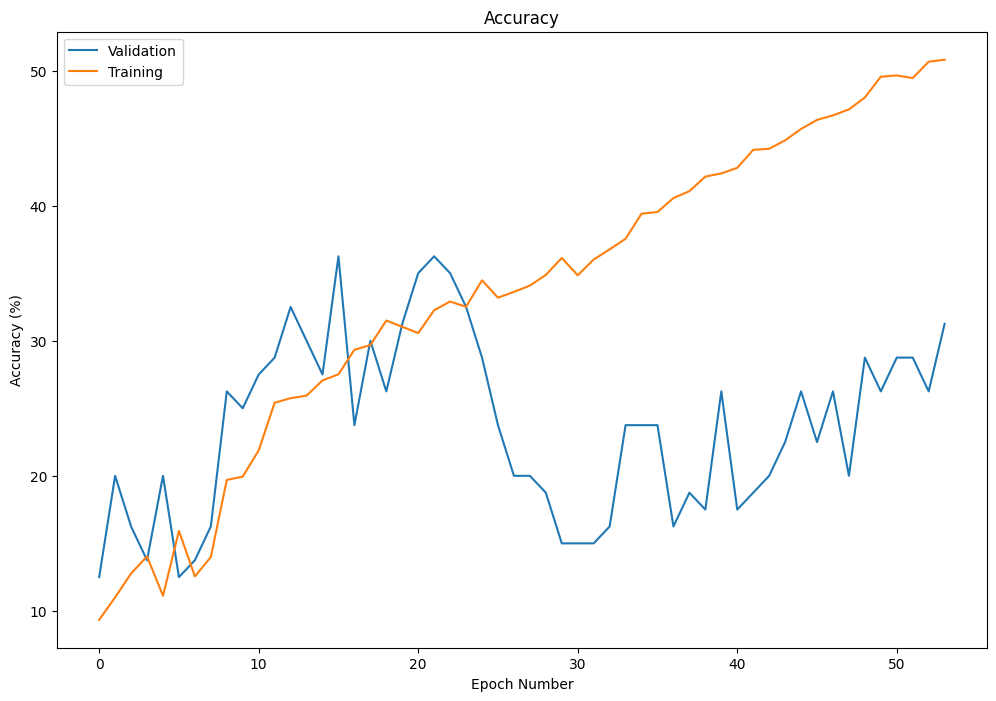

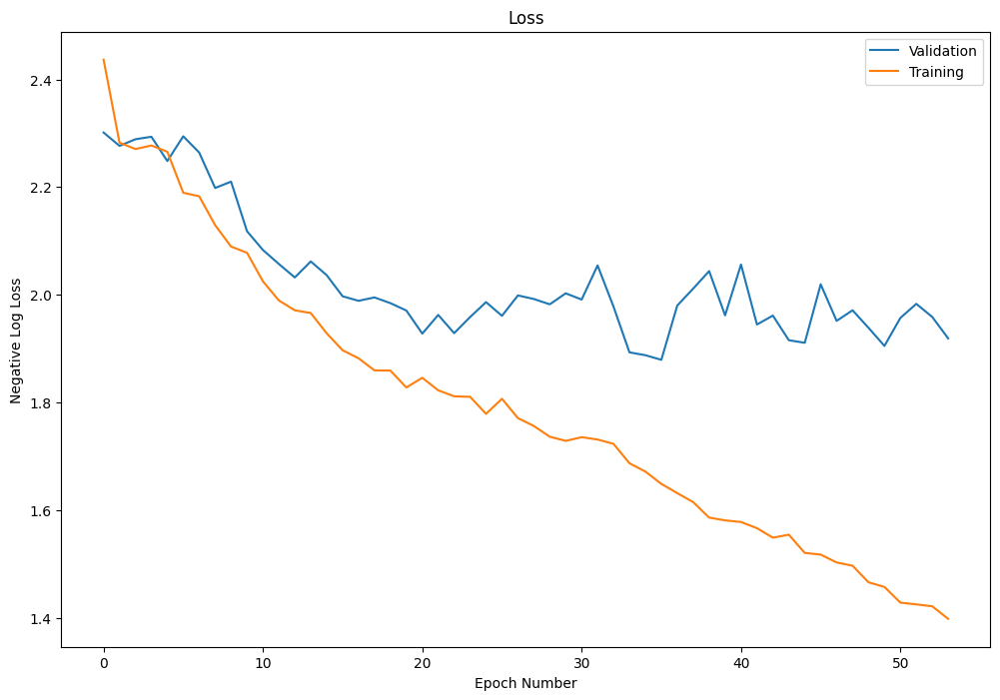


Peak Evaluation Accuracy: 36.2500%
Total Training Time: 3520.4052s



In [ ]:
with temporary_config():
    config.input_shape = (2, 60, 41)  # Piczak CNN, Short Segments

    dataset = EscLogMelSegmentDataset(esc10=True, long=False, augment_count=10)

    model = PiczakCNNBaseline(dataset.get_class_count(), long=False)
    model = model.to(config.device)

    input_type: InputType = "ensemble"

    train_and_test(dataset, model, input_type, "piczak/static-aug/log-mel/short")

#### Segmented Log-Mel with Augmentation On the Fly

ESC Dataset: Found cache for fold-0 at '.cache\esc10\log-mel-aug\seg-short-test\fold-0': sample count = 80
ESC Dataset: Found cache for fold-1 at '.cache\esc10\log-mel-aug\seg-short-test\fold-1': sample count = 80
ESC Dataset: Found cache for fold-2 at '.cache\esc10\log-mel-aug\seg-short-test\fold-2': sample count = 80
ESC Dataset: Found cache for fold-3 at '.cache\esc10\log-mel-aug\seg-short-test\fold-3': sample count = 80
ESC Dataset: Found cache for fold-4 at '.cache\esc10\log-mel-aug\seg-short-test\fold-4': sample count = 80
ESC Dataset: Found cache for fold-0 at '.cache\esc10\log-mel-aug\seg-short\fold-0': sample count = 80
ESC Dataset: Found cache for fold-1 at '.cache\esc10\log-mel-aug\seg-short\fold-1': sample count = 80
ESC Dataset: Found cache for fold-2 at '.cache\esc10\log-mel-aug\seg-short\fold-2': sample count = 80
ESC Dataset: Found cache for fold-3 at '.cache\esc10\log-mel-aug\seg-short\fold-3': sample count = 80
ESC Dataset: Found cache for fold-4 at '.cache\esc10\log-

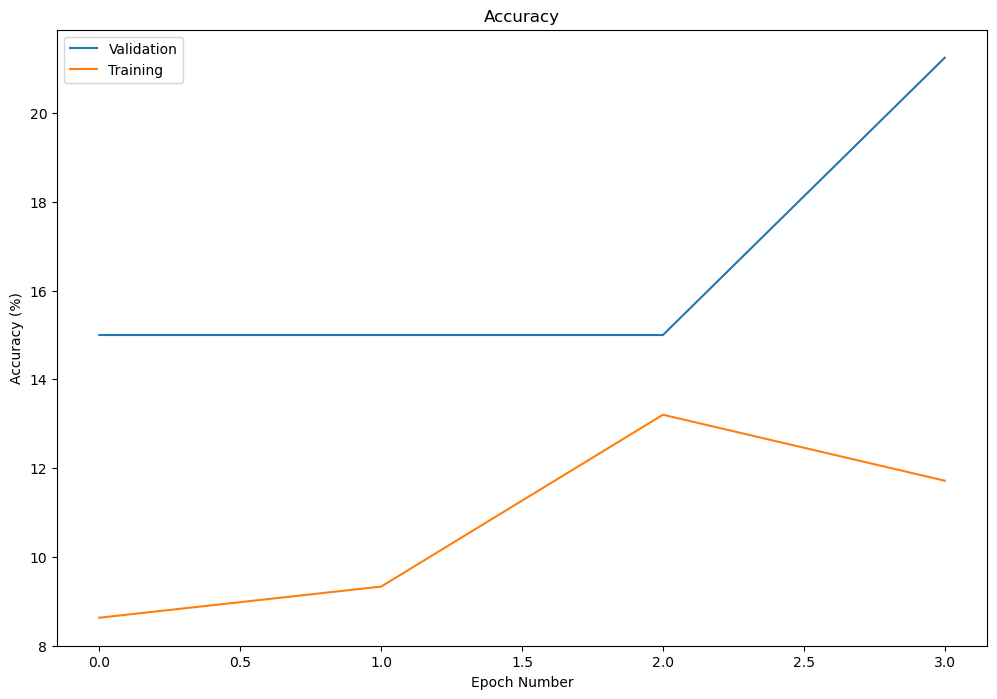

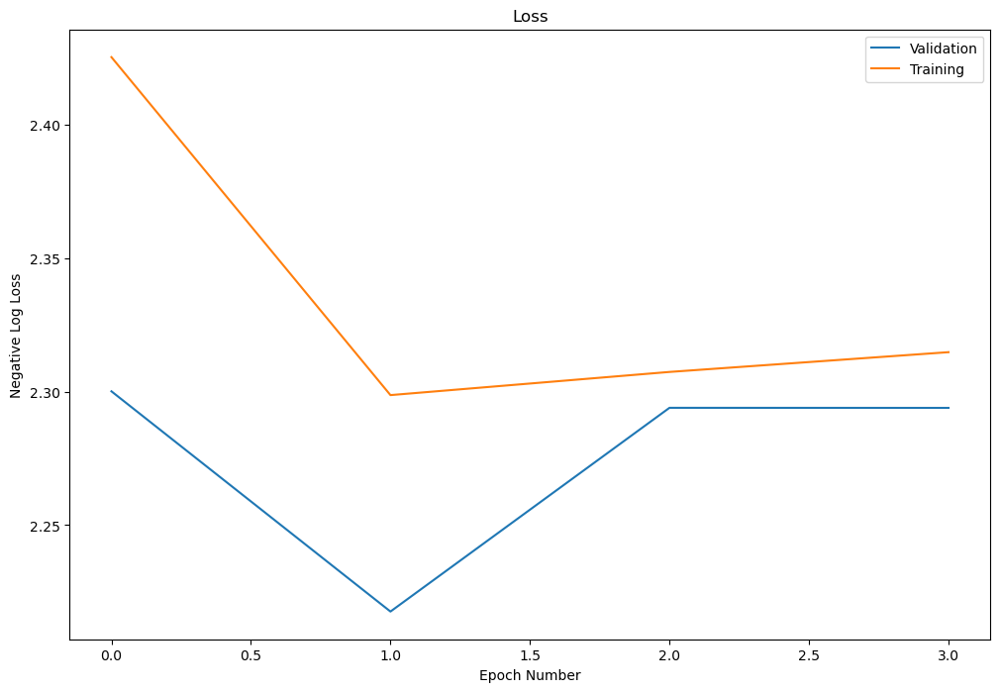


Peak Evaluation Accuracy: 21.2500%
Total Training Time: 137.1559s



In [103]:
with temporary_config():
    config.input_shape = (2, 60, 41)  # Piczak CNN, Short Segments
    config.epochs = 50

    dataset = EscAugmentedLogMelSegmentDataset(esc10=True, long=False)

    model = PiczakCNNBaseline(dataset.get_class_count(), long=False)
    model = model.to(config.device)

    input_type: InputType = "ensemble"

    train_and_test(dataset, model, input_type, "piczak/dynamic-aug/log-mel/short")

### Accuracies

| Approach | Peak Accuracies for Each Test Fold (%) | Mean (%) | Standard Error ($\sigma_{\bar{x}}$) |
|----------|----------------------------------------|----------|------------------------------|
| VGG16 + Log-Mel               | `[56.25, 66.25, 65.00, 57.50, 63.75]` | $61.75$ | $1.823$ |
| TEO CNN + TEO-GTSC            | `[67.50, 85.00, 87.50, 90.00, 78.75]` | $81.75$ | $3.599$ |
| Piczak CNN + Log-Mel          | `[75.00, 90.00, 83.75, 87.50, 77.50]` | $82.75$ | $2.559$ |
| Piczak CNN + TEO-GTSC (pure)  | `[72.50, 85.00, 87.50, 88.75, 76.25]` | $82.00$ | $2.885$ |
| Piczak CNN + TEO-GTSC (fused) | `[76.25, 85.00, 90.00, 96.25, 80.00]` | $85.50$ | $3.174$ |
| OurNet + Log-Mel              | `[81.25, 91.25, 92.50, 92.50, 90.00]` | $89.50$ | $1.891$ |
| OurNet + TEO-GTSC (pure)      | `[82.50, 96.25, 86.25, 93.75, 85.00]` | $88.75$ | $2.372$ |
| OurNet + TEO-GTSC (fused)     | `[77.50, 85.00, 88.75, 97.50, 82.50]` | $86.25$ | $3.000$ |



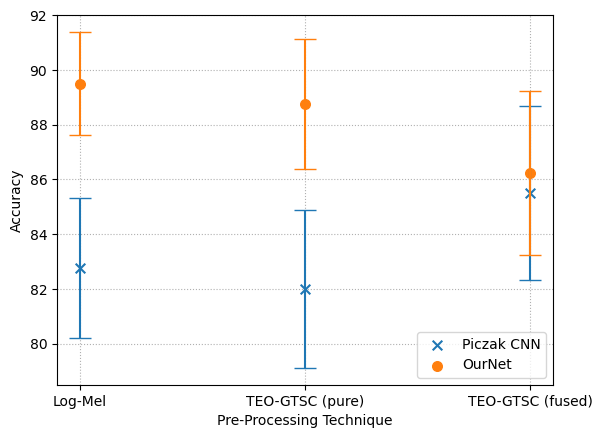

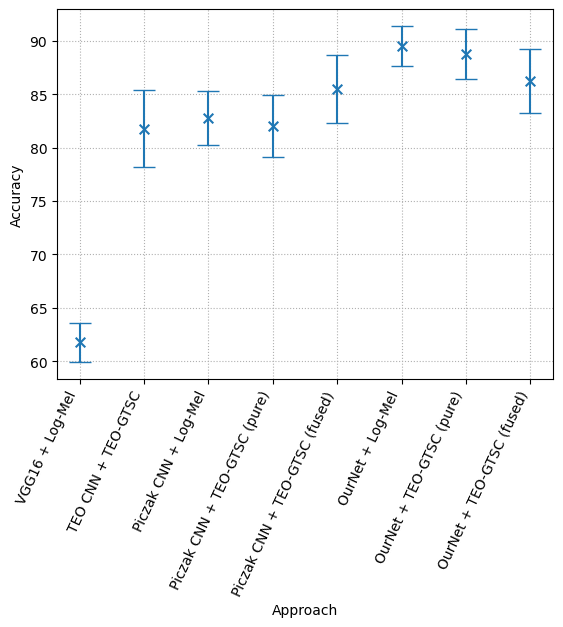

In [77]:
def plot_accuracies() -> None:
    accuracy_data = {
        "VGG16 + Log-Mel"               : [56.25, 66.25, 65.00, 57.50, 63.75],
        "TEO CNN + TEO-GTSC"            : [67.50, 85.00, 87.50, 90.00, 78.75],
        "Piczak CNN + Log-Mel"          : [75.00, 90.00, 83.75, 87.50, 77.50],
        "Piczak CNN + TEO-GTSC (pure)"  : [72.50, 85.00, 87.50, 88.75, 76.25],
        "Piczak CNN + TEO-GTSC (fused)" : [76.25, 85.00, 90.00, 96.25, 80.00],
        "OurNet + Log-Mel"              : [81.25, 91.25, 92.50, 92.50, 90.00],
        "OurNet + TEO-GTSC (pure)"      : [82.50, 96.25, 86.25, 93.75, 85.00],
        "OurNet + TEO-GTSC (fused)"     : [77.50, 85.00, 88.75, 97.50, 82.50]
    }
    
    fig = plt.figure()
    ax = fig.gca()
    for name_prefix in ["Piczak CNN", "OurNet"]:
        marker = ("o" if name_prefix == "OurNet" else "x")
        names = [name for name in accuracy_data.keys() if name.startswith(name_prefix)]
        x = [name.split("+")[-1].strip() for name in names]
        y = [np.mean(accuracy_data[name]) for name in names]
        yerr = [np.std(accuracy_data[name]) / np.sqrt(np.size(accuracy_data[name])) for name in names]
        ax.errorbar(x, y, yerr=yerr, solid_capstyle='projecting', capsize=8, ls="none")
        ax.scatter(x, y, marker=marker, label=name_prefix, s=48)

    ax.legend()
    ax.set_xlabel("Pre-Processing Technique")
    ax.set_ylabel("Accuracy")
    ax.grid(True, linestyle=":")

    plt.show()
    plt.close(fig)

    fig = plt.figure()
    ax = fig.gca()
    x = list(accuracy_data.keys())
    y = [np.mean(accuracy_data[name]) for name in x]
    yerr = [np.std(accuracy_data[name]) / np.sqrt(np.size(accuracy_data[name])) for name in x]
    ax.errorbar(x, y, yerr=yerr, solid_capstyle='projecting', capsize=8, ls="none")
    ax.scatter(x, y, marker="x", s=48)

    ax.set_xlabel("Approach")
    ax.set_ylabel("Accuracy")
    ax.grid(True, linestyle=":")

    plt.xticks(rotation=65, ha="right")
    plt.show()
    plt.close(fig)

plot_accuracies()
del plot_accuracies

### Training Costs

For each approach, the training time per epoch and the ram usage are also recorded.
RAM usage is measured by monitoring the `ipykernel` process's memory footprint in `btop` and calculating the difference in said quantity between the training and idle states.
All measurements below were performed on a machine with an AMD Ryzen&trade; 9 5900X CPU and an AMD Radeon&trade; RX 7900 XTX GPU.

| Approach                      | RAM Usage (MiB) | Time per Epoch (s) |
| ----------------------------- | --------------- | ------------------ |
| VGG16 + Log-Mel               | 310             | 2.6                |
| TEO CNN + TEO-GTSC            | 256             | 2.2                |
| Piczak CNN + Log-Mel          | 263             | 2.2                |
| Piczak CNN + TEO-GTSC (pure)  | 212             | 2.3                |
| Piczak CNN + TEO-GTSC (fused) | 295             | 2.3                |
| OurNet + Log-Mel              | 285             | 2.5                |
| OurNet + TEO-GTSC (pure)      | 291             | 2.3                |
| OurNet + TEO-GTSC (fused)     | 304             | 2.4                |


We also performed the measurements for Piczak CNN + Log-Mel using the augmentation method proposed by Piczak with, generating 10 randomly transformed audio samples for each original audio sample prior to segmentation and pre-processing. The RAM footprint is 1.1GiB and on average it takes 63.4s to train for one epoch.

There are no drastic differences in the RAM usage and time per epoch between the approaches above (excluding the augmentation). Minor discrepancies is likely to be present due to the feature of this type of measurement. It should be used as a reference for any possible trends only, and not as precise indications. The time needed per epoch for OurNet is similar to Piczak/TEO-CNN and less than deeper networks such as VGG-16.


## Discussion

### Results analysis

- OurNet only has 3,850,312 parameters, whilst the Piczak CNN Baseline has 26,734,090, yielding a 85% reduction in parameter count. This will significantly boost the inference speed and allows our model to run on devices with limited computational power.
- From our results of 5-fold CVs, we can see that `Ournet` + fused TEO-GTSC achieved the highest peak accuracy. However it is rather unstable, with a best and worst accuracy of 97.5% and 77.5% rescpectively. This behavior is spotted on Piczak with fused TEO-GTSC as well, indicating that the preprocessing method of extracting fused TEO-GTSC causes models to be less stable in comparison to other methods (i.e. pure TEO-GTSC).
- Despite that `OurNet` does not require pre-training or data augmentation, it is able to quickly reach &ge;90% of its peak accuracy within 30-50 epochs, even for complex features like fused TEO-GTSC, far faster than Piczak CNN (requiring around 50-60 epochs for log-mel and 400-600 epochs for fused/pure teo-gtsc) and TEO CNN (taking around 200-300 epochs). 
    - This significantly reduces the training cost and is immensely helpful for manufacturers in production cost minimisation, allowing more competitive products to be made.
- VGG-16 is the most stable model (with a standard deviation of 4) but significantly overfits after hitting a plateau, whereas `OurNet` is less susceptible to such issues due to its simple architecture. VGG-16's complex architecture is what makes it stable (easier to seperate out the features) but also make it really easy to overfits (memorise the training audio instead of the audio features).
- Our attempts with `OurCRNNet` is not shown, as its validation accuracy is very unstable despite consuming an unfeasibly large amount of time with the limited hardwares we have access to.
- `OurNet` requires less RAM to train than VGG-16 but slightly more than Piczak since we have more layers/parameters.
- The model proposed in TEO paper, `TEO-CNN`, is the least stable one due to the overly simplified architecture. Compare to the Piczak's model, there is one less fully connected layer and the hidden number of units changed from 5000 to 500. This change made it such that its harder for the model to fully distinguish between the features and it's accuracy is highly dependent on the way the folds are structured.
- The preprocessing we did where we have TEO-GTSC fused with our power spectrogram feature (Fused TEO-GTSC) works best for the Piczak baseline, while Log-Mel works the best for `OurNet`. The custom feature we fused with TEO gave more information for Piczak CNN to learn, but due to `OurNet` having a minimal fully connected layer compensated by the parallel CNN, the network might be overwhelmed by the excessive amount of available details, and, in turn, ended up having more difficulty in learning those features due to over-saturation. Thus, simpler signal processing works better for `OurNet`, and more complex signal pre-processing is better for Piczak.

### Comparison with Related Existing & SOTA Approaches

| Name       | Accuracy (%) |
| ---------- | ------------ |
| VGG-16     | 61.75        |
| TEO-CNN    | 81.75        |
| Piczak CNN | 82.75        |
| [EnvNet](https://doi.org/10.1109/ICASSP.2017.7952651)     | 88.10        |
| [EnvNet-v2](https://openreview.net/forum?id=B1Gi6LeRZ)    | 88.80        |
| **OurNet** | **89.50**    |
| [AclNet](https://doi.org/10.1080/2150704X.2022.2097031)   | 95.75        |
| [ACDNet](https://doi.org/10.1016/j.patcog.2022.109025)    | 96.65        |

### Limitations and future work

Due to limited access to computational power, the models were only run for a single time for each test fold instead of for a statistically significant number of times. Hence, the reliability of our results are slight lower than desired; however, this is compensated by the use of 5-fold cross-validation, which provides a really effective and reliable way for us to evaluate our models and significant overcome this limitation.

In the end we decided to not show the outputs for `OurCRNNet`. Even though the network can reach ~80%, the network is even more unstable than the fused TEO-GTSC networks reported above. However its recorded performance is worse than `OurNet` due to the inherent nature of its architecture, failing to generalise or even learn on a limited dataset without augmentation. Attempts to initialise (both with and without freezing) the CNN part of model with a pretrained Piczak CNN on `OurCRNNet` have been made, however the accuracy improvement is negligible comparing to the added performance overhead. Hence we decided it's unecessary to go in details about our attempts with CRNNs. Future works may explore a more efficient and powerful mechanism based on RNN to replace probability voting that improves accuracy by incorporating temporal features of the segments individually processed by CNN.

A known better option for our pretraining is to use a image captioning or generation network (i.e. Resnet50, RGAN etc..), and have the encoder feed into our custom network. However this will greatly increase the memory overhead required for this model which invalidates our starting point of edge computing, as well as making the model more difficult to scale. Further studies can use `OurNet` as a basis to develop smaller and more efficient networks that incorporates these mechanism instead of wholly relying on the such mechanisms.

We have also attempted to incorporate transformers for sound classification due to audio's sequential nature. However, existing implementations of audio classification or captioning transformers are far too demanding to be run on our GPUs or other harwares we have access to; it requires unreasonable training and inference time as well as extensive pretraining to achieve near perfect accuracy on esc-10. Future researches can be done on such topics if mroe computational resources are accessible. Alternatively, studies studies can be made to reduce the transformers' size to be reasonable (i.e. consume similar computational resources as a traditional CNN) by turning the networks proposed in our project into attention-based networks.

## Conclusion

In this project, we have used signal processing and deep learning techniques to explore and develop a robust and efficient model with minimal training cost, one that is specifically optimised for audio classification over a small number of classes and capable of running on limited computational space and power, which is commonly found in low-end, budget-friendly devices. We proposed a number of pre-processing pipelines catered to network architectures, as well as a novel CNN architecture that has a significantly higher overall accuracy and stability, lower memory footprints, and better inference/training performance than the baselines that has informed its design.